In [1]:
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark.sql import Row, DataFrame

from hops import hdfs
from tempfile import TemporaryFile

import pandas as pd
import numpy as np

import math
import seaborn as sns

Starting Spark application


ID,YARN Application ID,Kind,State,Spark UI,Driver log,Current session?
1510,application_1544690131655_0134,pyspark,idle,Link,Link,✔


SparkSession available as 'spark'.


In [2]:
%%local
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Polygon
import matplotlib.patches as mpatches
plt.style.use('seaborn-darkgrid')
%matplotlib inline 
xlabel_size = 80
ylabel_size = 80
font_size = 60
tick_size = 60
line_width = 20

plt.rc('font', **{'weight' : 'normal','size'   : font_size})



## Parameters

In [3]:
year = 2016
month = 11

root_path = "hdfs:///Projects/traffic_reginbald/processed_traffic_data/"

######## Metadata Data ########
sensor_file_path = root_path + str(year) + "-" + str(month) + "_all-sensors-timeseries-parquet/*.parquet"
partition_metadata_paths = [
    root_path + "partitions/backward_partitions-" + str(part_min) + "min.csv" for part_min in [3,5,10,20,30]
]

overlapping_metadata_path = root_path + "/partitions/overlapping_partitions-base_weight_2_min-forward_3-backward_10.csv"

single_sensor_data_path = root_path + str(year) + "-" + str(month) + "_single-sensor-30-min-supervised-parquet/"


######## Single Sensor Models Results ########
single_sensor_model_path =  root_path + str(year) + "-" + str(month) + "_single-sensor-30-min-output/"

######## Partition Models Results########
part_3min_path = root_path + str(year) + "-" + str(month) + "_backward_partitions-3-min-output/"

part_5min_path = root_path + str(year) + "-" + str(month) + "_backward_partitions-5-min-output/"

part_10min_path = root_path + str(year) + "-" + str(month) + "_backward_partitions-10-min-output/"

part_20min_path = root_path + str(year) + "-" + str(month) + "_backward_partitions-20-min-output/"

part_30min_path = root_path + str(year) + "-" + str(month) + "_backward_partitions-30-min-output/"

######## Whole Traffic Network Model Results########
all_sensors_model_path = root_path + str(year) + "-" + str(month) + "_whole_traffic_network-output/"
######## Overlapping Models Results########
overlapping_path = root_path + str(year) + "-" + str(month) + \
    "_overlapping_partitions-base_2-forward_3-backward_10-min-output/"

## Import Data

In [4]:
sensors = spark.read.parquet(sensor_file_path).columns[1:]

In [5]:
print("Number of sensors: " + str(len(sensors)))
print("First sensor: " + sensors[0])

Number of sensors: 1941
First sensor: E182N-0005-1

In [6]:
partition_schema = StructType() \
    .add('node', StringType(), False) \
    .add('partition', IntegerType(), False) \
    .add('group', StringType())

In [7]:
overlapping_schema = StructType() \
    .add('node', StringType(), False) \
    .add('partition', IntegerType(), False) \
    .add('type', StringType())

In [8]:
partitions_3min_raw_df = spark.read.csv(
    partition_metadata_paths[0], 
    sep=';', 
    schema=partition_schema,
    ignoreLeadingWhiteSpace=True,
    ignoreTrailingWhiteSpace=True,
    header=True,
    timestampFormat='yyyy/MM/dd HH:mm:ss.SSS'
)

In [9]:
partitions_5min_raw_df = spark.read.csv(
    partition_metadata_paths[1], 
    sep=';', 
    schema=partition_schema,
    ignoreLeadingWhiteSpace=True,
    ignoreTrailingWhiteSpace=True,
    header=True,
    timestampFormat='yyyy/MM/dd HH:mm:ss.SSS'
)

In [10]:
partitions_10min_raw_df = spark.read.csv(
    partition_metadata_paths[2], 
    sep=';', 
    schema=partition_schema,
    ignoreLeadingWhiteSpace=True,
    ignoreTrailingWhiteSpace=True,
    header=True,
    timestampFormat='yyyy/MM/dd HH:mm:ss.SSS'
)

In [11]:
partitions_20min_raw_df = spark.read.csv(
    partition_metadata_paths[3], 
    sep=';', 
    schema=partition_schema,
    ignoreLeadingWhiteSpace=True,
    ignoreTrailingWhiteSpace=True,
    header=True,
    timestampFormat='yyyy/MM/dd HH:mm:ss.SSS'
)

In [12]:
partitions_30min_raw_df = spark.read.csv(
    partition_metadata_paths[4], 
    sep=';', 
    schema=partition_schema,
    ignoreLeadingWhiteSpace=True,
    ignoreTrailingWhiteSpace=True,
    header=True,
    timestampFormat='yyyy/MM/dd HH:mm:ss.SSS'
)

In [13]:
overlapping_raw_df = spark.read.csv(
    overlapping_metadata_path, 
    sep=';', 
    schema=overlapping_schema,
    ignoreLeadingWhiteSpace=True,
    ignoreTrailingWhiteSpace=True,
    header=True,
    timestampFormat='yyyy/MM/dd HH:mm:ss.SSS'
)

In [14]:
print partitions_3min_raw_df.count()
print partitions_5min_raw_df.count()
print partitions_10min_raw_df.count()
print partitions_20min_raw_df.count()
print partitions_30min_raw_df.count()
print overlapping_raw_df.where(col('type') == 'critical').count()

857
857
857
857
857
857

In [15]:
@udf(StringType())
def shot_identifier(identifier):
    return identifier[:-2]

sensors_df = spark.createDataFrame(sc.parallelize([Row(identifier=s) for s in sensors]), ["identifier"]) \
    .withColumn("identifier_alt", shot_identifier("identifier"))
sensors_df.count()

1941

In [16]:
partitions_3min_df = partitions_3min_raw_df.alias("p").join(
    sensors_df.alias("s"),
    col("s.identifier_alt") == col("p.node"),
    "rightouter"
)
partitions_3min_df.count()

1941

In [17]:
partitions_5min_df = partitions_5min_raw_df.alias("p").join(
    sensors_df.alias("s"),
    col("s.identifier_alt") == col("p.node"),
    "rightouter"
)
partitions_5min_df.count()

1941

In [18]:
partitions_10min_df = partitions_10min_raw_df.alias("p").join(
    sensors_df.alias("s"),
    col("s.identifier_alt") == col("p.node"),
    "rightouter"
)
partitions_10min_df.count()

1941

In [19]:
partitions_20min_df = partitions_20min_raw_df.alias("p").join(
    sensors_df.alias("s"),
    col("s.identifier_alt") == col("p.node"),
    "rightouter"
)
partitions_20min_df.count()

1941

In [20]:
partitions_30min_df = partitions_30min_raw_df.alias("p").join(
    sensors_df.alias("s"),
    col("s.identifier_alt") == col("p.node"),
    "rightouter"
)
partitions_30min_df.count()

1941

In [21]:
overlapping_df = overlapping_raw_df.alias("p").join(
    sensors_df.alias("s"),
    col("s.identifier_alt") == col("p.node"),
    "rightouter"
)
overlapping_df.where(col('type') == 'critical').count()

1938

In [22]:
# These sensors are not connected to the rest of the graph and should be removed
overlapping_df.where(col('p.node').isNull()).show()

+----+---------+----+------------+--------------+
|node|partition|type|  identifier|identifier_alt|
+----+---------+----+------------+--------------+
|null|     null|null|E18W-37625-1|    E18W-37625|
|null|     null|null|E18W-37625-2|    E18W-37625|
|null|     null|null|E4_A-31975-1|    E4_A-31975|
+----+---------+----+------------+--------------+

In [23]:
partitions_3min_df = partitions_3min_df.where(~col('p.node').isNull()) \
    .select(
        col("s.identifier").alias("identifier"), 
        col("p.partition").alias("partition"), 
        col("p.group").alias("group"))
partitions_3min_df.count()

1938

In [24]:
partitions_5min_df = partitions_5min_df.where(~col('p.node').isNull()) \
    .select(
        col("s.identifier").alias("identifier"), 
        col("p.partition").alias("partition"), 
        col("p.group").alias("group"))
partitions_5min_df.count()

1938

In [25]:
partitions_10min_df = partitions_10min_df.where(~col('p.node').isNull()) \
    .select(
        col("s.identifier").alias("identifier"), 
        col("p.partition").alias("partition"), 
        col("p.group").alias("group"))
partitions_10min_df.count()

1938

In [26]:
partitions_20min_df = partitions_20min_df.where(~col('p.node').isNull()) \
    .select(
        col("s.identifier").alias("identifier"), 
        col("p.partition").alias("partition"), 
        col("p.group").alias("group"))
partitions_20min_df.count()

1938

In [27]:
partitions_30min_df = partitions_30min_df.where(~col('p.node').isNull()) \
    .select(
        col("s.identifier").alias("identifier"), 
        col("p.partition").alias("partition"), 
        col("p.group").alias("group"))
partitions_30min_df.count()

1938

In [28]:
overlapping_df = overlapping_df.where(~col('p.node').isNull()) \
    .select(
        col("s.identifier").alias("identifier"), 
        col("p.partition").alias("partition"), 
        col("p.type").alias("type"))
overlapping_df.where(col('type') == 'critical').count()

1938

In [29]:
sensors = [s[0] for s in partitions_3min_df.select('identifier').collect()]

## Define Functions

In [30]:
def read_hdfs_file(file_path):
    fs_handle = hdfs.get_fs()
    temp_file = TemporaryFile()
    fd = fs_handle.open_file(file_path, mode='r')
    temp_file.write(fd.read())
    temp_file.seek(0)
    np_array = np.load(temp_file)
    return np_array

In [31]:
def write_hdfs_file(file_path, data):
    fs_handle = hdfs.get_fs()
    temp_file = TemporaryFile()
    np.save(temp_file, data, allow_pickle=False)
    temp_file.seek(0)

    fd = fs_handle.open_file(file_path, mode='w')
    fd.write(temp_file.read())
    fd.close()

In [32]:
def file_exists(file_path):
    try:
        read_hdfs_file(file_path)
    except:
        return False
    return True

In [33]:
def reject_outliers(data, m=2):
    return data[np.absolute(data - np.mean(data)) < m * np.std(data)]

In [34]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true[y_true != 0] - y_pred[y_true != 0]) / y_true[y_true != 0])) * 100

In [35]:
def mean_squared_error(y_true, y_pred):
    return ((y_true - y_pred) ** 2).mean(axis=0)

In [36]:
def mean_absolute_error(y_true, y_pred):
    return np.sum(np.absolute((y_true - y_pred)).mean(axis=0))

In [37]:
def calculate_errors(true_values, pred_values):
    errors = []

    for i in range(0, true_values.shape[1]):
        true_reshaped = np.reshape(true_values[:, i, :], (-1))
        pred_reshaped = np.reshape(pred_values[:, i, :], (-1))

        rmse = float(math.sqrt(mean_squared_error(y_true=true_reshaped, y_pred=pred_reshaped)))
        mse = float(mean_squared_error(y_true=true_reshaped, y_pred=pred_reshaped))
        mae = float(mean_absolute_error(y_true=true_reshaped, y_pred=pred_reshaped))
        mpr = float(mean_absolute_percentage_error(y_true=true_reshaped, y_pred=pred_reshaped))

        errors.append((rmse, mse, mae, mpr))
    return errors

In [38]:
def calculate_avg_rmse(path, c_sensors):
    true_values = np.reshape(
        read_hdfs_file(path + c_sensors[0] + "/true_values.npy"), 
        (12085, 30, 1)
    )
    pred_values = np.reshape(
        read_hdfs_file(path + c_sensors[0] + "/pred_values.npy"), 
        (12085, 30, 1)
    )

    for i in range(1, len(c_sensors)):
        true_values = np.append(true_values, np.reshape(
            read_hdfs_file(path + c_sensors[i] + "/true_values.npy"), 
            (12085, 30, 1)
        ), 2)

        pred_values = np.append(pred_values, np.reshape(
            read_hdfs_file(path + c_sensors[i] + "/pred_values.npy"), 
            (12085, 30, 1)
        ), 2)
        if i % 10 == 0: #To know where it is
            fs_handle = hdfs.get_fs()
            fd = fs_handle.open_file(root_path + "counter.txt", mode='w')
            fd.write("Working on path: " + path + " counter: " + str(i))
            fd.close() 

    return np.average(np.sqrt(mean_squared_error(
        y_true=true_values, 
        y_pred=pred_values
    )), axis=1)

In [39]:
def calculate_rmse(path, c_sensors):
    true_values = np.reshape(
        read_hdfs_file(path + c_sensors[0] + "/true_values.npy"), 
        (12085, 30, 1)
    )
    pred_values = np.reshape(
        read_hdfs_file(path + c_sensors[0] + "/pred_values.npy"), 
        (12085, 30, 1)
    )

    for i in range(1, len(c_sensors)):
        true_values = np.append(true_values, np.reshape(
            read_hdfs_file(path + c_sensors[i] + "/true_values.npy"), 
            (12085, 30, 1)
        ), 2)

        pred_values = np.append(pred_values, np.reshape(
            read_hdfs_file(path + c_sensors[i] + "/pred_values.npy"), 
            (12085, 30, 1)
        ), 2)
        if i % 10 == 0: #To know where it is
            fs_handle = hdfs.get_fs()
            fd = fs_handle.open_file(root_path + "counter.txt", mode='w')
            fd.write("Working on path: " + path + " counter: " + str(i))
            fd.close() 

    return np.sqrt(mean_squared_error(
        y_true=true_values, 
        y_pred=pred_values
    ))

In [40]:
def calculate_avg_t_time(path, partition_ids, reject=False):
    time = read_hdfs_file(path + str(partition_ids[0]) + "/training_time.npy")

    for i in range(1, len(partition_ids)):
        time = np.append(time, read_hdfs_file(path + str(partition_ids[i]) + "/training_time.npy"))
    if reject: return np.average(reject_outliers(time, 2))
    return np.average(time)

In [41]:
def calculate_median_t_time(path, partition_ids, reject=False):
    time = read_hdfs_file(path + str(partition_ids[0]) + "/training_time.npy")

    for i in range(1, len(partition_ids)):
        time = np.append(time, read_hdfs_file(path + str(partition_ids[i]) + "/training_time.npy"))

    if reject: return np.median(reject_outliers(time, 2))
    return np.median(time)

In [42]:
def calculate_total_t_time(path, partition_ids, reject=False):
    time = read_hdfs_file(path + str(partition_ids[0]) + "/training_time.npy")

    for i in range(1, len(partition_ids)):
        time = np.append(time, read_hdfs_file(path + str(partition_ids[i]) + "/training_time.npy"))

    if reject: return np.sum(reject_outliers(time, 2))
    return np.sum(time)

In [43]:
def calculate_avg_p_time(path, partition_ids, reject=False):
    time = read_hdfs_file(path + str(partition_ids[0]) + "/prediction_time.npy")

    for i in range(1, len(partition_ids)):
        time = np.append(time, read_hdfs_file(path + str(partition_ids[i]) + "/prediction_time.npy"))

    if reject: return np.average(reject_outliers(time, 2))
    return np.average(time)

In [44]:
def get_p_time(path, partition_ids):
    time = read_hdfs_file(path + str(partition_ids[0]) + "/prediction_time.npy")

    for i in range(1, len(partition_ids)):
        time = np.append(time, read_hdfs_file(path + str(partition_ids[i]) + "/prediction_time.npy"))

    return time

In [45]:
def get_t_time(path, partition_ids):
    time = read_hdfs_file(path + str(partition_ids[0]) + "/training_time.npy")

    for i in range(1, len(partition_ids)):
        time = np.append(time, read_hdfs_file(path + str(partition_ids[i]) + "/training_time.npy"))

    return time

## Plot Measurements From Four Sensors

In [46]:
sensor_1_df = spark.read.parquet(single_sensor_data_path + sensors[0]).orderBy('Timestamp')
sensor_2_df = spark.read.parquet(single_sensor_data_path + sensors[500]).orderBy('Timestamp')
sensor_3_df = spark.read.parquet(single_sensor_data_path + sensors[1000]).orderBy('Timestamp')
sensor_4_df = spark.read.parquet(single_sensor_data_path + sensors[1500]).orderBy('Timestamp')
sensor_1_df.count()

40281

In [47]:
%%spark -o sensor_plot_df -n 40281

sensor_plot_df = sensor_1_df.select("Timestamp", "t+30").alias("s1").join(
    sensor_2_df.select("Timestamp", "t+30").alias("s2"),
    col("s1.Timestamp") == col("s2.Timestamp")
).select(
    col("s1.Timestamp").alias("Timestamp"), 
    col("s1.t+30").alias("Sensor 1"), 
    col("s2.t+30").alias("Sensor 2")).alias("s1").join(
    sensor_3_df.select("Timestamp", "t+30").alias("s3"),
    col("s1.Timestamp") == col("s3.Timestamp")   
).select(
    col("s1.Timestamp").alias("Timestamp"), 
    col("s1.Sensor 1").alias("Sensor 1"), 
    col("s1.Sensor 2").alias("Sensor 2"), 
    col("s3.t+30").alias("Sensor 3")).alias("s1").join(
    sensor_4_df.select("Timestamp", "t+30").alias("s4"),
    col("s1.Timestamp") == col("s4.Timestamp")
).select(
    col("s1.Timestamp").alias("Timestamp"), 
    col("s1.Sensor 1").alias(sensors[0]), 
    col("s1.Sensor 2").alias(sensors[500]),  
    col("s1.Sensor 3").alias(sensors[1000]),
    col("s4.t+30").alias(sensors[1500])
)

sensor_plot_df.count()

40281

In [48]:
sensor_plot_df.show()

+-------------------+------------------+-------------------+------------------+------------------+
|          Timestamp|      E182N-0005-1|       E265O-4215-1|       E4N-68340-3|      E4_C-32345-1|
+-------------------+------------------+-------------------+------------------+------------------+
|2016-11-02 00:00:00|0.6451612903225806|                0.0|               0.0|               0.0|
|2016-11-02 00:01:00|               0.0|                0.0|               0.0|0.9090909090909091|
|2016-11-02 00:02:00|               0.0|                0.0| 2.278481012658228|               0.0|
|2016-11-02 00:03:00|               0.0|                0.0|1.9148936170212767|            0.9375|
|2016-11-02 00:04:00|               0.0|                0.0| 2.891566265060241|               0.0|
|2016-11-02 00:05:00|0.7228915662650602|                0.0|               0.0|               0.0|
|2016-11-02 00:06:00| 1.348314606741573|                0.0|               0.0|               0.0|
|2016-11-0

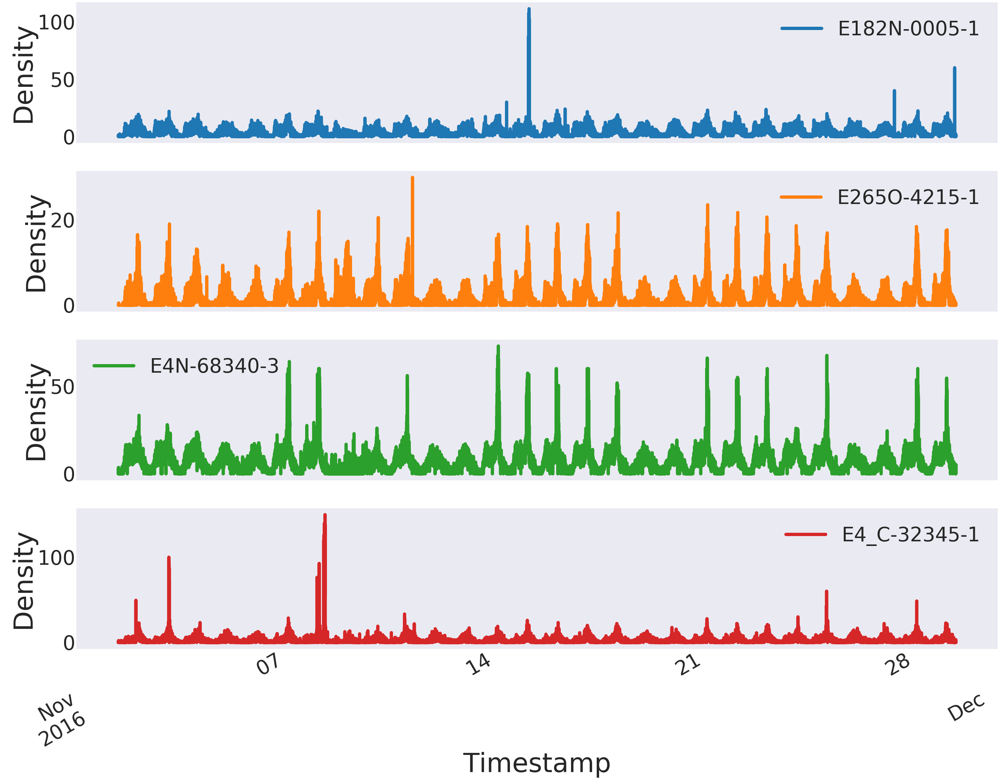

In [49]:
%%local

sensor_plot = sensor_plot_df.set_index("Timestamp").plot(
    figsize=(50, 40), 
    subplots=True, 
    layout=(4,1),
    sharex=True,
    fontsize=tick_size, 
    linewidth=line_width * 0.5
)

for ax in sensor_plot:
    ax[0].set_xlabel("Timestamp", {'size':xlabel_size})
    ax[0].set_ylabel("Density", {'size':ylabel_size})
    ax[0].grid(linewidth=0)

## Plot prediction and measurement for a single sensor

In [50]:
sensor_id = 500

single_sensor_true_values = np.reshape(
    read_hdfs_file(single_sensor_model_path + sensors[sensor_id] + "/true_values.npy"), 
    (12085, 30, 1)
)

single_sensor_pred_values = np.reshape(
    read_hdfs_file(single_sensor_model_path + sensors[sensor_id] + "/pred_values.npy"), 
    (12085, 30, 1)
)

In [51]:
%%spark -o true_df -n 12085

true_df = spark.createDataFrame(
    sc.parallelize(single_sensor_true_values[:, -1].reshape(single_sensor_true_values[:, -1].shape[0],-1).tolist()), 
    ["Measured density for " + sensors[sensor_id]]
)
true_df.count()

12085

In [52]:
%%spark -o pred_df -n 12085

pred_df = spark.createDataFrame(
    sc.parallelize(single_sensor_pred_values[:, -1].reshape(single_sensor_pred_values[:, -1].shape[0],-1).tolist()), 
    ["Predicted density for " + sensors[sensor_id]]
)
pred_df.count()

12085

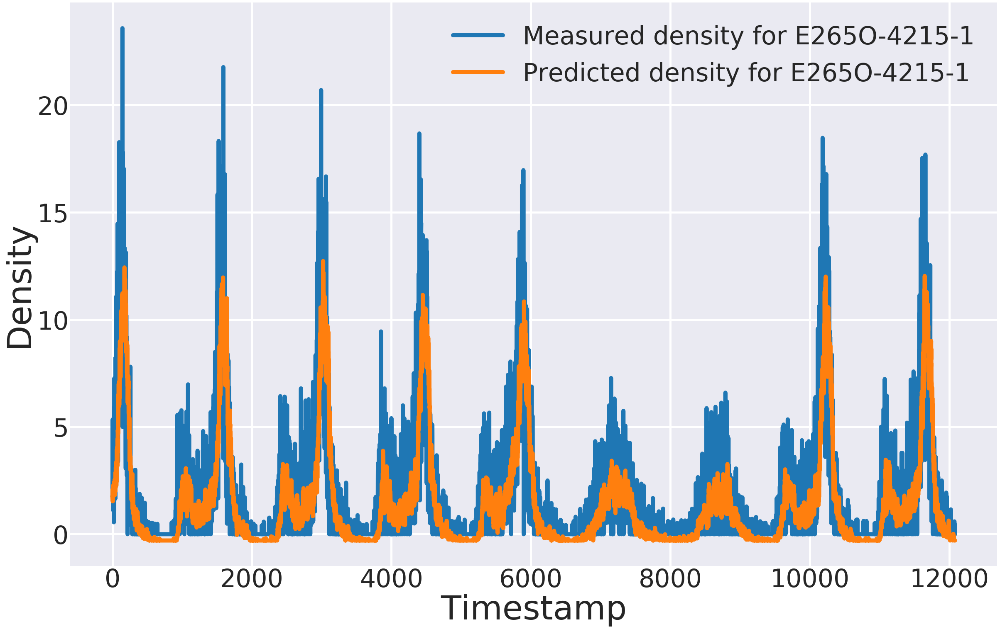

In [53]:
%%local
test_plot = pd.concat([true_df, pred_df], axis=1).plot.line(
    figsize=(40, 25),                                                       
    fontsize=tick_size, 
    linewidth=line_width * 0.5)

test_plot.set_xlabel("Timestamp", {'size':xlabel_size})
test_plot.set_ylabel("Density", {'size':ylabel_size})
test_plot.grid(linewidth=5)

## 3 minutes

In [54]:
min3_true_values = np.reshape(
    read_hdfs_file(part_3min_path + sensors[sensor_id] + "/true_values.npy"), 
    (12085, 30, 1)
)

min3_pred_values = np.reshape(
    read_hdfs_file(part_3min_path + sensors[sensor_id] + "/pred_values.npy"), 
    (12085, 30, 1)
)

In [55]:
%%spark -o min3_true_df -n 12085

min3_true_df = spark.createDataFrame(
    sc.parallelize(min3_true_values[:, -1].reshape(min3_true_values[:, -1].shape[0],-1).tolist()), 
    ["Measured density for " + sensors[sensor_id]]
)
min3_true_df.count()

12085

In [56]:
%%spark -o min3_pred_df -n 12085

min3_pred_df = spark.createDataFrame(
    sc.parallelize(min3_pred_values[:, -1].reshape(min3_pred_values[:, -1].shape[0],-1).tolist()), 
    ["Predicted density for " + sensors[sensor_id]]
)
min3_pred_df.count()

12085

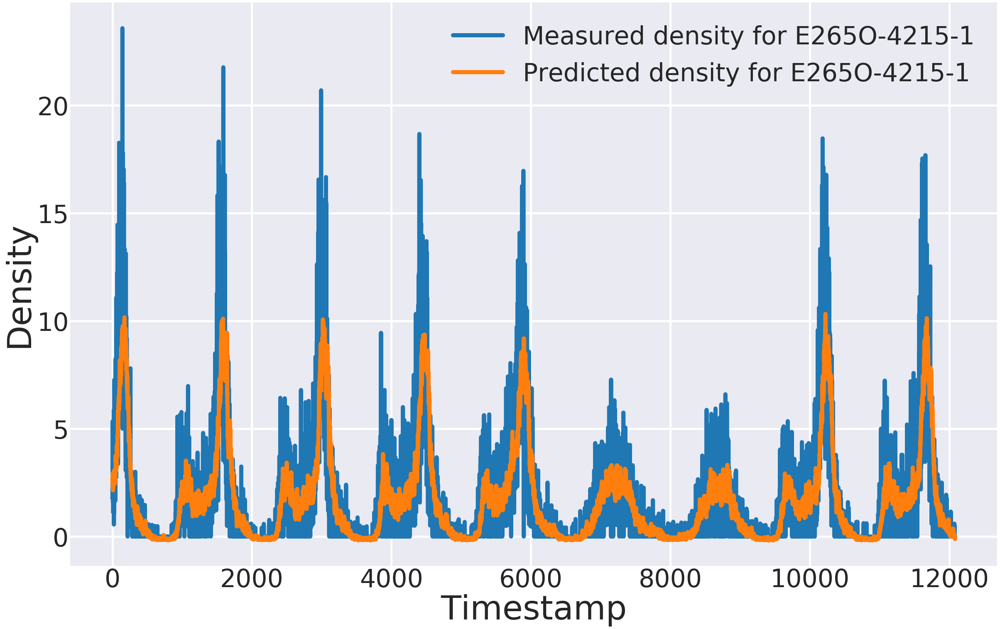

In [57]:
%%local
test_plot = pd.concat([min3_true_df, min3_pred_df], axis=1).plot.line(
    figsize=(40, 25),                                                       
    fontsize=tick_size, 
    linewidth=line_width * 0.5)

test_plot.set_xlabel("Timestamp", {'size':xlabel_size})
test_plot.set_ylabel("Density", {'size':ylabel_size})
test_plot.grid(linewidth=5)

## 5 minutes

In [58]:
min5_true_values = np.reshape(
    read_hdfs_file(part_5min_path + sensors[sensor_id] + "/true_values.npy"), 
    (12085, 30, 1)
)

min5_pred_values = np.reshape(
    read_hdfs_file(part_5min_path + sensors[sensor_id] + "/pred_values.npy"), 
    (12085, 30, 1)
)

In [59]:
%%spark -o min5_true_df -n 12085

min5_true_df = spark.createDataFrame(
    sc.parallelize(min5_true_values[:, -1].reshape(min5_true_values[:, -1].shape[0],-1).tolist()), 
    ["Measured density for " + sensors[sensor_id]]
)
min5_true_df.count()

12085

In [60]:
%%spark -o min5_pred_df -n 12085

min5_pred_df = spark.createDataFrame(
    sc.parallelize(min5_pred_values[:, -1].reshape(min5_pred_values[:, -1].shape[0],-1).tolist()), 
    ["Predicted density for " + sensors[sensor_id]]
)
min5_pred_df.count()

12085

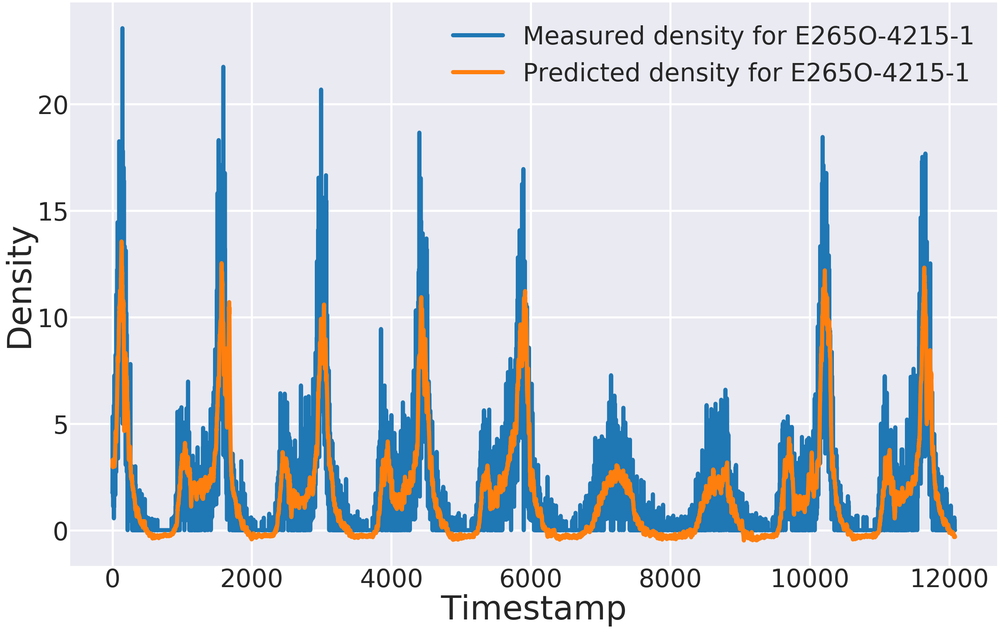

In [61]:
%%local
test_plot = pd.concat([min5_true_df, min5_pred_df], axis=1).plot.line(
    figsize=(40, 25),                                                       
    fontsize=tick_size, 
    linewidth=line_width * 0.5)

test_plot.set_xlabel("Timestamp", {'size':xlabel_size})
test_plot.set_ylabel("Density", {'size':ylabel_size})
test_plot.grid(linewidth=5)

## 10 minutes

In [62]:
min10_true_values = np.reshape(
    read_hdfs_file(part_10min_path + sensors[sensor_id] + "/true_values.npy"), 
    (12085, 30, 1)
)

min10_pred_values = np.reshape(
    read_hdfs_file(part_10min_path + sensors[sensor_id] + "/pred_values.npy"), 
    (12085, 30, 1)
)

In [63]:
%%spark -o min10_true_df -n 12085

min10_true_df = spark.createDataFrame(
    sc.parallelize(min10_true_values[:, -1].reshape(min10_true_values[:, -1].shape[0],-1).tolist()), 
    ["Measured density for " + sensors[sensor_id]]
)
min10_true_df.count()

12085

In [64]:
%%spark -o min10_pred_df -n 12085

min10_pred_df = spark.createDataFrame(
    sc.parallelize(min10_pred_values[:, -1].reshape(min10_pred_values[:, -1].shape[0],-1).tolist()), 
    ["Predicted density for " + sensors[sensor_id]]
)
min10_pred_df.count()

12085

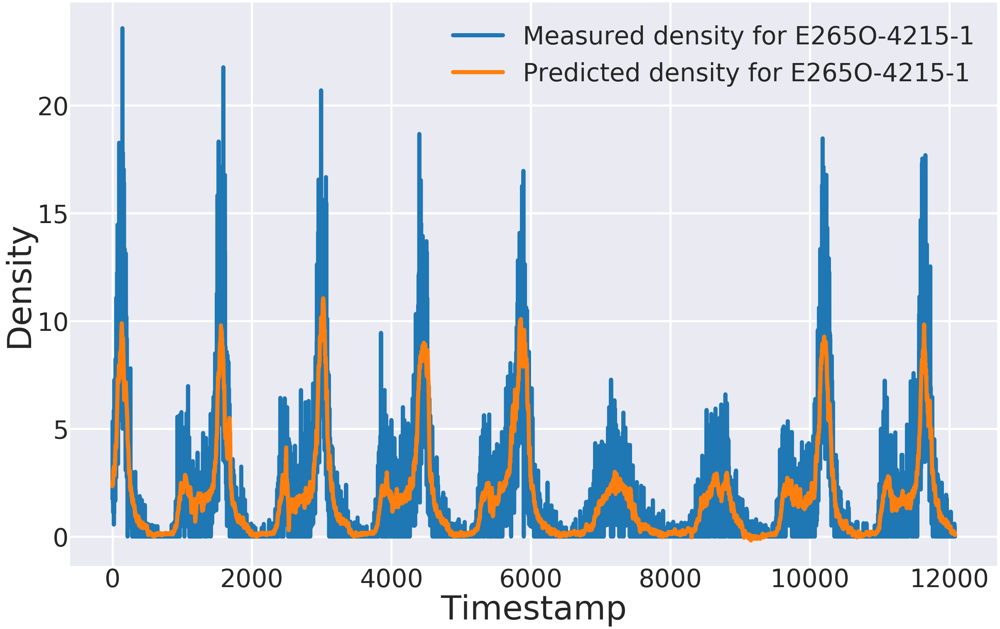

In [65]:
%%local
test_plot = pd.concat([min10_true_df, min10_pred_df], axis=1).plot.line(
    figsize=(40, 25),                                                       
    fontsize=tick_size, 
    linewidth=line_width * 0.5)

test_plot.set_xlabel("Timestamp", {'size':xlabel_size})
test_plot.set_ylabel("Density", {'size':ylabel_size})
test_plot.grid(linewidth=5)

## 20 minutes

In [66]:
min20_true_values = np.reshape(
    read_hdfs_file(part_20min_path + sensors[sensor_id] + "/true_values.npy"), 
    (12085, 30, 1)
)

min20_pred_values = np.reshape(
    read_hdfs_file(part_20min_path + sensors[sensor_id] + "/pred_values.npy"), 
    (12085, 30, 1)
)

In [67]:
%%spark -o min20_true_df -n 12085

min20_true_df = spark.createDataFrame(
    sc.parallelize(min20_true_values[:, -1].reshape(min20_true_values[:, -1].shape[0],-1).tolist()), 
    ["Measured density for " + sensors[sensor_id]]
)
min20_true_df.count()

12085

In [68]:
%%spark -o min20_pred_df -n 12085

min20_pred_df = spark.createDataFrame(
    sc.parallelize(min20_pred_values[:, -1].reshape(min20_pred_values[:, -1].shape[0],-1).tolist()), 
    ["Predicted density for " + sensors[sensor_id]]
)
min20_pred_df.count()

12085

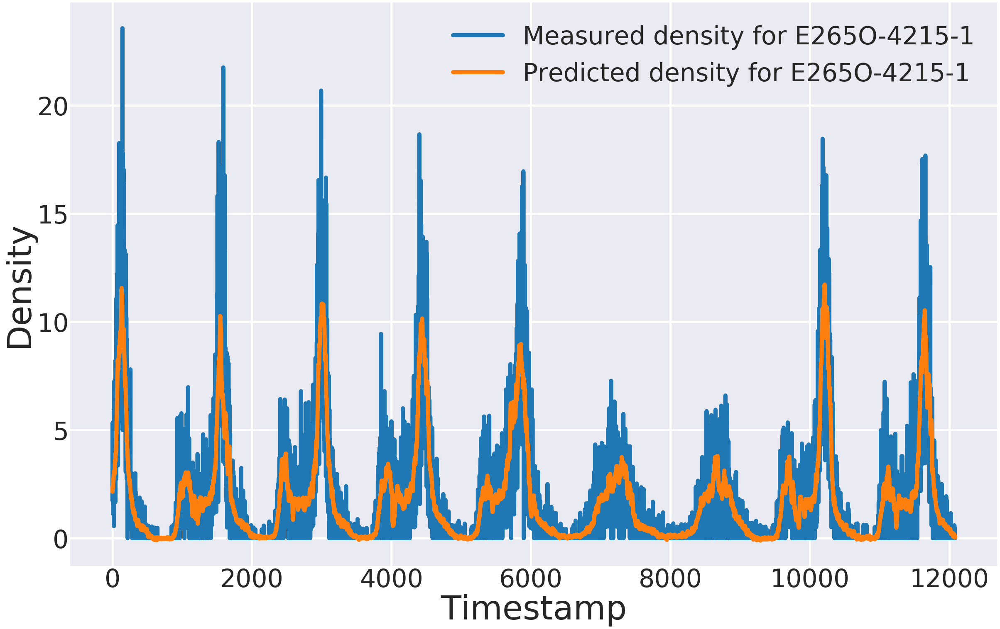

In [69]:
%%local
test_plot = pd.concat([min20_true_df, min20_pred_df], axis=1).plot.line(
    figsize=(40, 25),                                                       
    fontsize=tick_size, 
    linewidth=line_width * 0.5)

test_plot.set_xlabel("Timestamp", {'size':xlabel_size})
test_plot.set_ylabel("Density", {'size':ylabel_size})
test_plot.grid(linewidth=5)

## 30 minutes

In [70]:
min30_true_values = np.reshape(
    read_hdfs_file(part_30min_path + sensors[sensor_id] + "/true_values.npy"), 
    (12085, 30, 1)
)

min30_pred_values = np.reshape(
    read_hdfs_file(part_30min_path + sensors[sensor_id] + "/pred_values.npy"), 
    (12085, 30, 1)
)

In [71]:
%%spark -o min30_true_df -n 12085

min30_true_df = spark.createDataFrame(
    sc.parallelize(min30_true_values[:, -1].reshape(min30_true_values[:, -1].shape[0],-1).tolist()), 
    ["Measured density for " + sensors[sensor_id]]
)
min30_true_df.count()

12085

In [72]:
%%spark -o min30_pred_df -n 12085

min30_pred_df = spark.createDataFrame(
    sc.parallelize(min30_pred_values[:, -1].reshape(min30_pred_values[:, -1].shape[0],-1).tolist()), 
    ["Predicted density for " + sensors[sensor_id]]
)
min30_pred_df.count()

12085

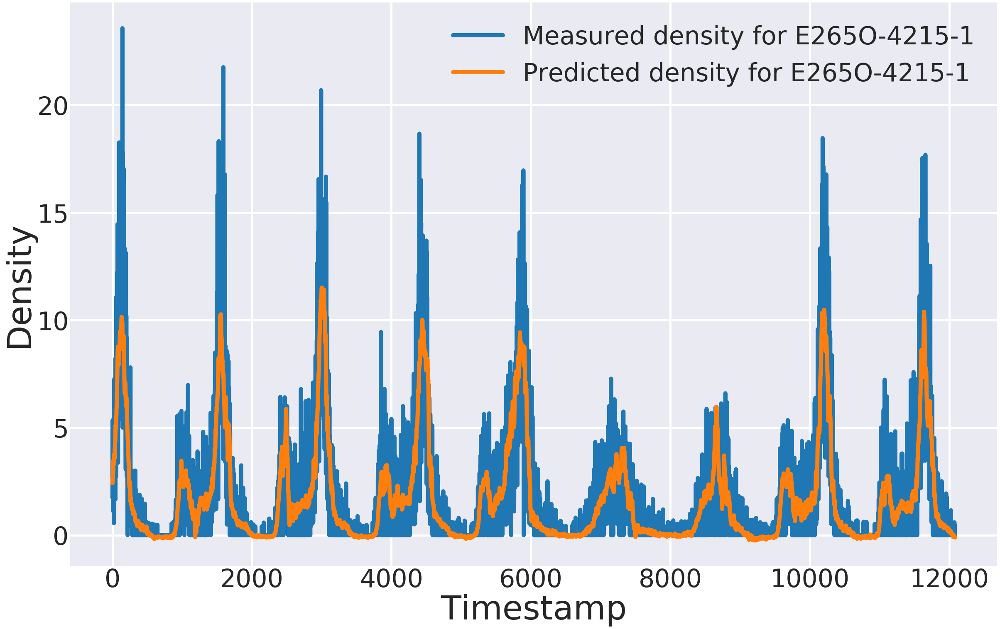

In [73]:
%%local
test_plot = pd.concat([min30_true_df, min30_pred_df], axis=1).plot.line(
    figsize=(40, 25),                                                       
    fontsize=tick_size, 
    linewidth=line_width * 0.5)

test_plot.set_xlabel("Timestamp", {'size':xlabel_size})
test_plot.set_ylabel("Density", {'size':ylabel_size})
test_plot.grid(linewidth=5)

## All

In [74]:
all_true_values = np.reshape(
    read_hdfs_file(all_sensors_model_path + sensors[sensor_id] + "/true_values.npy"), 
    (12085, 30, 1)
)

all_pred_values = np.reshape(
    read_hdfs_file(all_sensors_model_path + sensors[sensor_id] + "/pred_values.npy"), 
    (12085, 30, 1)
)

In [75]:
%%spark -o all_true_df -n 12085

all_true_df = spark.createDataFrame(
    sc.parallelize(all_true_values[:, -1].reshape(all_true_values[:, -1].shape[0],-1).tolist()), 
    ["Measured density for " + sensors[sensor_id]]
)
all_true_df.count()

12085

In [76]:
%%spark -o all_pred_df -n 12085

all_pred_df = spark.createDataFrame(
    sc.parallelize(all_pred_values[:, -1].reshape(all_pred_values[:, -1].shape[0],-1).tolist()), 
    ["Predicted density for " + sensors[sensor_id]]
)
all_pred_df.count()

12085

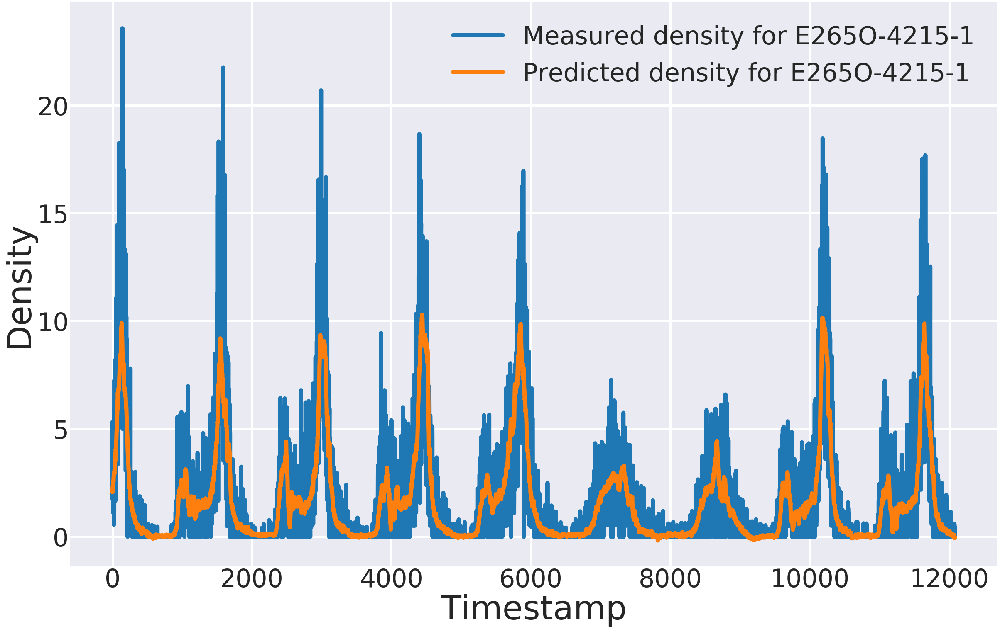

In [77]:
%%local
test_plot = pd.concat([all_true_df, all_pred_df], axis=1).plot.line(
    figsize=(40, 25),                                                       
    fontsize=tick_size, 
    linewidth=line_width * 0.5)

test_plot.set_xlabel("Timestamp", {'size':xlabel_size})
test_plot.set_ylabel("Density", {'size':ylabel_size})
test_plot.grid(linewidth=5)

## Overlapping

In [78]:
overlapping_true_values = np.reshape(
    read_hdfs_file(overlapping_path + sensors[sensor_id] + "/true_values.npy"), 
    (12085, 30, 1)
)

overlapping_pred_values = np.reshape(
    read_hdfs_file(overlapping_path + sensors[sensor_id] + "/pred_values.npy"), 
    (12085, 30, 1)
)

In [79]:
%%spark -o overlapping_true_df -n 12085

overlapping_true_df = spark.createDataFrame(
    sc.parallelize(overlapping_true_values[:, -1].reshape(overlapping_true_values[:, -1].shape[0],-1).tolist()), 
    ["Measured density for " + sensors[sensor_id]]
)
overlapping_true_df.count()

12085

In [80]:
%%spark -o overlapping_pred_df -n 12085

overlapping_pred_df = spark.createDataFrame(
    sc.parallelize(overlapping_pred_values[:, -1].reshape(overlapping_pred_values[:, -1].shape[0],-1).tolist()), 
    ["Predicted density for " + sensors[sensor_id]]
)
overlapping_pred_df.count()

12085

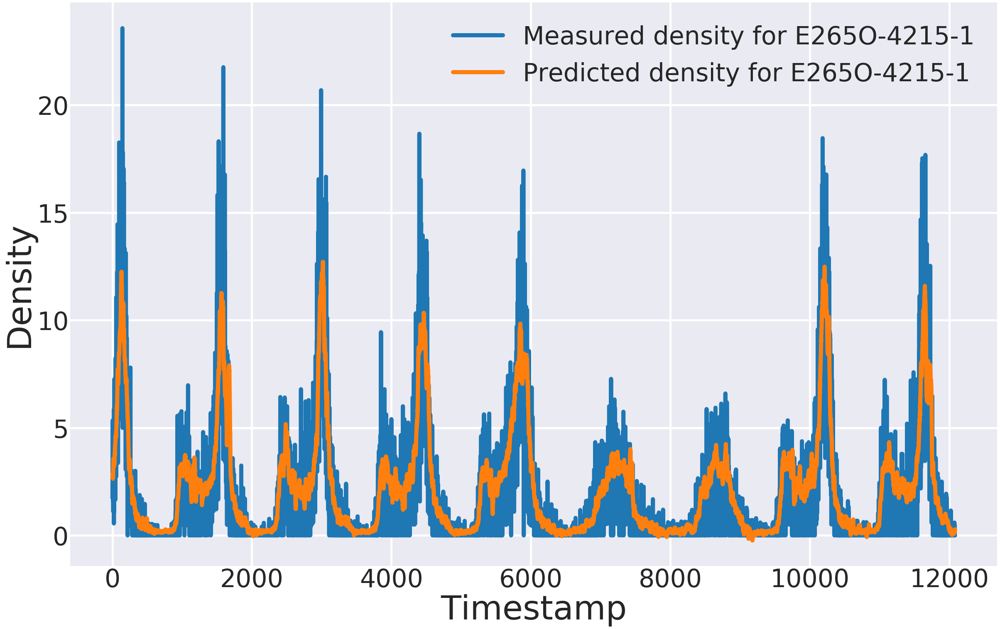

In [81]:
%%local
test_plot = pd.concat([overlapping_true_df, overlapping_pred_df], axis=1).plot.line(
    figsize=(40, 25),                                                       
    fontsize=tick_size, 
    linewidth=line_width * 0.5)

test_plot.set_xlabel("Timestamp", {'size':xlabel_size})
test_plot.set_ylabel("Density", {'size':ylabel_size})
test_plot.grid(linewidth=5)

### TABLE 

In [82]:
%%spark -o random_sensor_rmse_df
indices = [2, 4, 9, 19, 29]

random_sensor_rmse = np.array([np.array(["t+" + str(i)]) for i in range(1, 31)])
random_sensor_rmse = np.append(random_sensor_rmse, calculate_rmse(single_sensor_model_path, [sensors[sensor_id]]), 1)
random_sensor_rmse = np.append(random_sensor_rmse, calculate_rmse(part_3min_path, [sensors[sensor_id]]), 1)
random_sensor_rmse = np.append(random_sensor_rmse, calculate_rmse(part_5min_path, [sensors[sensor_id]]), 1)
random_sensor_rmse = np.append(random_sensor_rmse, calculate_rmse(part_10min_path, [sensors[sensor_id]]), 1)
random_sensor_rmse = np.append(random_sensor_rmse, calculate_rmse(part_20min_path, [sensors[sensor_id]]), 1)
random_sensor_rmse = np.append(random_sensor_rmse, calculate_rmse(part_30min_path, [sensors[sensor_id]]), 1)
random_sensor_rmse = np.append(random_sensor_rmse, calculate_rmse(all_sensors_model_path, [sensors[sensor_id]]), 1)
random_sensor_rmse = np.append(random_sensor_rmse, calculate_rmse(overlapping_path, [sensors[sensor_id]]), 1)


random_sensor_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.take(random_sensor_rmse, indices, 0).tolist()
    ), 
    [
        "Time",
        "Single Sensor Models", 
        "3 Minute Partition Models", 
        "5 Minute Partition Models",
        "10 Minute Partition Models", 
        "20 Minute Partition Models", 
        "30 Minute Partition Models",
        "Transportation System Model",
        "Overlapping Partition Models"
    ]
)

In [83]:
%%local
random_sensor_rmse_df#.transpose()

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=7, layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'30 Minute Partition Models': u'30 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Time': u'Time', u'Single Sensor Models': u'Single Sensor Models', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=u'Time'), HBox(children=(Dropdown(description=u'Y', index=8, layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'30 Minute Partition Models': u'30 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Time': u'Time', u'Single Sensor Models': u'Single Sensor Models', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=u'Single Sensor Models'), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

# Average RMSE

In [84]:
single_sensor_model_rmse = np.array([])
if not file_exists(single_sensor_model_path + "avg_rmse.npy"):
    single_sensor_model_avg_rmse = calculate_avg_rmse(single_sensor_model_path, sensors)
    write_hdfs_file(single_sensor_model_path + "avg_rmse.npy", single_sensor_model_avg_rmse)
else:
    single_sensor_model_avg_rmse = read_hdfs_file(single_sensor_model_path + "avg_rmse.npy")

In [85]:
partition_3min_model_avg_rmse = np.array([])

if not file_exists(part_3min_path + "avg_rmse.npy"):
    partition_3min_model_avg_rmse = calculate_avg_rmse(part_3min_path, sensors)
    write_hdfs_file(part_3min_path + "avg_rmse.npy", partition_3min_model_avg_rmse)
else:
    partition_3min_model_avg_rmse = read_hdfs_file(part_3min_path + "avg_rmse.npy")

In [86]:
partition_5min_model_avg_rmse = np.array([])

if not file_exists(part_5min_path + "avg_rmse.npy"):
    partition_5min_model_avg_rmse = calculate_avg_rmse(part_5min_path, sensors)
    write_hdfs_file(part_5min_path + "avg_rmse.npy", partition_5min_model_avg_rmse)
else:
    partition_5min_model_avg_rmse = read_hdfs_file(part_5min_path + "avg_rmse.npy")

In [87]:
partition_10min_model_avg_rmse = np.array([])

if not file_exists(part_10min_path + "avg_rmse.npy"):
    partition_10min_model_avg_rmse = calculate_avg_rmse(part_10min_path, sensors)
    write_hdfs_file(part_10min_path + "avg_rmse.npy", partition_10min_model_avg_rmse)
else:
    partition_10min_model_avg_rmse = read_hdfs_file(part_10min_path + "avg_rmse.npy")

In [88]:
partition_20min_model_avg_rmse = np.array([])

if not file_exists(part_20min_path + "avg_rmse.npy"):
    partition_20min_model_avg_rmse = calculate_avg_rmse(part_20min_path, sensors)
    write_hdfs_file(part_20min_path + "avg_rmse.npy", partition_20min_model_avg_rmse)
else:
    partition_20min_model_avg_rmse = read_hdfs_file(part_20min_path + "avg_rmse.npy")

In [89]:
partition_30min_model_avg_rmse = np.array([])

if not file_exists(part_30min_path + "avg_rmse.npy"):
    partition_30min_model_avg_rmse = calculate_avg_rmse(part_30min_path, sensors)
    write_hdfs_file(part_30min_path + "avg_rmse.npy", partition_30min_model_avg_rmse)
else:
    partition_30min_model_avg_rmse = read_hdfs_file(part_30min_path + "avg_rmse.npy")

In [90]:
whole_traffic_model_avg_rmse = np.array([])

if not file_exists(all_sensors_model_path + "avg_rmse.npy"):
    whole_traffic_model_avg_rmse = calculate_avg_rmse(all_sensors_model_path, sensors)
    write_hdfs_file(all_sensors_model_path + "avg_rmse.npy", whole_traffic_model_avg_rmse)
else:
    whole_traffic_model_avg_rmse = read_hdfs_file(all_sensors_model_path + "avg_rmse.npy")

In [91]:
# Todo use sensors
overlapping_model_avg_rsme = np.array([])

if not file_exists(overlapping_path + "avg_rmse.npy"):
    overlapping_model_avg_rsme = calculate_avg_rmse(overlapping_path, sensors)
    write_hdfs_file(overlapping_path + "avg_rmse.npy", overlapping_model_avg_rsme)
else:
    overlapping_model_avg_rsme = read_hdfs_file(overlapping_path + "avg_rmse.npy")

In [92]:
%%spark -o avg_rmse_df
indices = [2, 4, 9, 19, 29]

avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_sensor_model_avg_rmse, indices),
            np.take(partition_3min_model_avg_rmse, indices),
            np.take(partition_5min_model_avg_rmse, indices),
            np.take(partition_10min_model_avg_rmse, indices),
            np.take(partition_20min_model_avg_rmse, indices),
            #np.take(partition_30min_model_avg_rmse, indices),
            np.take(whole_traffic_model_avg_rmse, indices),
            np.take(overlapping_model_avg_rsme, indices),
        ]).tolist()
    ), 
    [
        "Time", 
        "Single Sensor Models", 
        "3 Minute Partition Models", 
        "5 Minute Partition Models",
        "10 Minute Partition Models", 
        "20 Minute Partition Models", 
        #"30 Minute Partition Models",
        "Transportation System Model",
        "Overlapping Partition Models"
    ]
)
avg_rmse_df.show(50)

+----+--------------------+-------------------------+-------------------------+--------------------------+--------------------------+---------------------------+----------------------------+
|Time|Single Sensor Models|3 Minute Partition Models|5 Minute Partition Models|10 Minute Partition Models|20 Minute Partition Models|Transportation System Model|Overlapping Partition Models|
+----+--------------------+-------------------------+-------------------------+--------------------------+--------------------------+---------------------------+----------------------------+
| t+3|   3.739942437645949|        3.917491924047392|        3.972693041204915|        4.1359945344733005|         4.267914809407513|          4.345502976287338|          3.8588141128128894|
| t+5|   3.919131828361962|        4.051176900806486|        4.090591076883717|         4.223154434412924|         4.339545816745016|           4.39809399785478|           3.990395859622424|
|t+10|   4.227437923326333|        4.30376638

In [443]:
%%local
avg_rmse_df

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=6, layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Time': u'Time', u'Single Sensor Models': u'Single Sensor Models', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=u'Time'), HBox(children=(Dropdown(description=u'Y', index=7, layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Time': u'Time', u'Single Sensor Models': u'Single Sensor Models', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=u'Single Sensor Models'), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

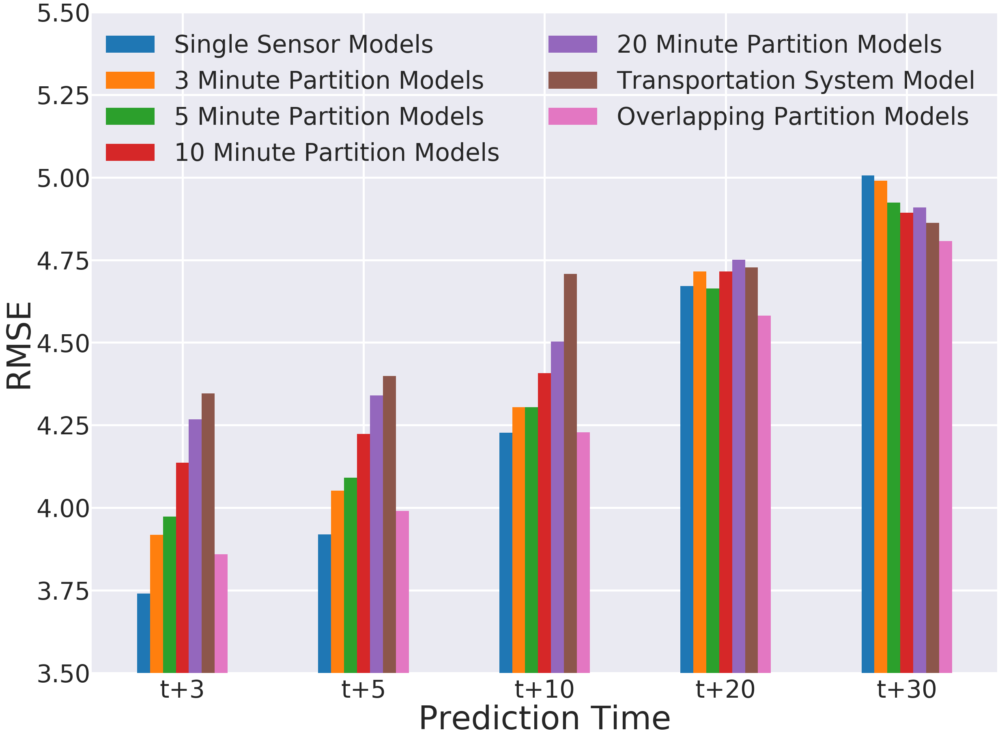

In [94]:
%%local
avg_rmse_plot = avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 30), fontsize=tick_size)

avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
avg_rmse_plot.set_ylim(3.5, 5.5)
avg_rmse_plot.legend(ncol=2)
avg_rmse_plot.grid(linewidth=5)

## ALL 

In [95]:
%%spark -o all_avg_rmse_df

all_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            ["t+" + str(x) for x in range(1, 31)],
            whole_traffic_model_avg_rmse,
        ]).tolist()
    ), 
    [
        "Time", 
        "Transportation System Model"
    ]
)


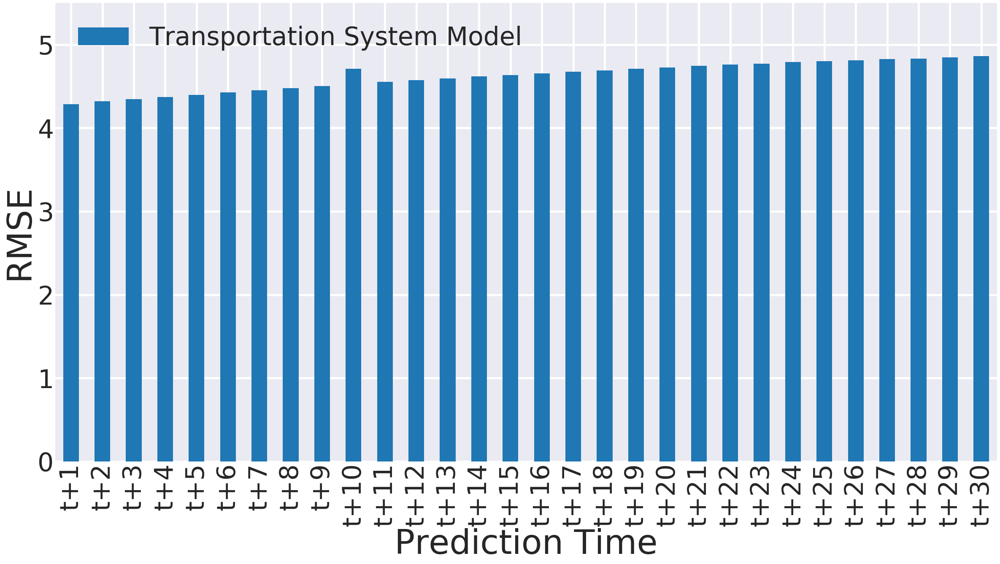

In [96]:
%%local
all_avg_rmse_plot = all_avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 20), fontsize=tick_size)

all_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
all_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
all_avg_rmse_plot.set_ylim(0, 5.5)
all_avg_rmse_plot.grid(linewidth=5)

## 30 minutes

In [97]:
%%spark -o min30_avg_rmse_df

min30_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            ["t+" + str(x) for x in range(1, 31)],
            partition_30min_model_avg_rmse,
        ]).tolist()
    ), 
    [
        "Time", 
        "30 Minute Partition Models"
    ]
)

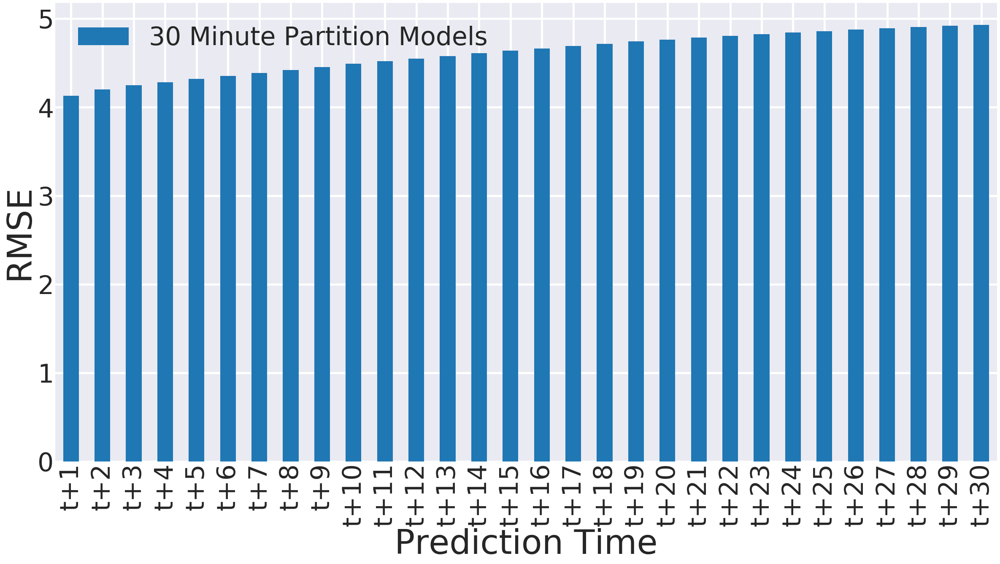

In [98]:
%%local
min30_avg_rmse_plot = min30_avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 20), fontsize=tick_size)

min30_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
min30_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
min30_avg_rmse_plot.grid(linewidth=5)

## 20 minutes

In [99]:
%%spark -o min20_avg_rmse_df

min20_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            ["t+" + str(x) for x in range(1, 31)],
            partition_20min_model_avg_rmse,
        ]).tolist()
    ), 
    [
        "Time", 
        "20 Minute Partition Models"
    ]
)

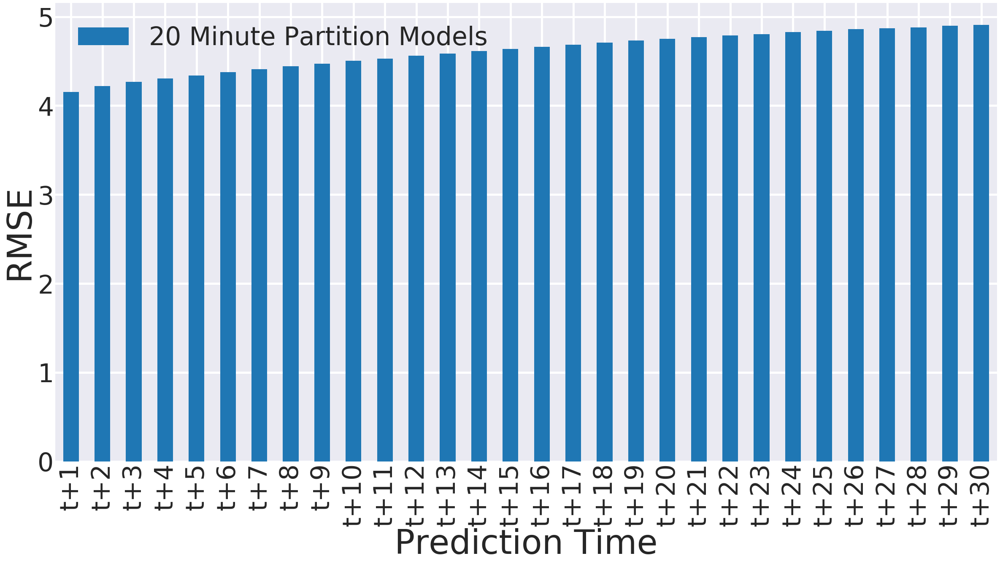

In [100]:
%%local
min20_avg_rmse_plot = min20_avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 20), fontsize=tick_size)

min20_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
min20_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
min20_avg_rmse_plot.grid(linewidth=5)

## 10 minutes

In [101]:
%%spark -o min10_avg_rmse_df

min10_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            ["t+" + str(x) for x in range(1, 31)],
            partition_10min_model_avg_rmse,
        ]).tolist()
    ), 
    [
        "Time", 
        "10 Minute Partition Models"
    ]
)

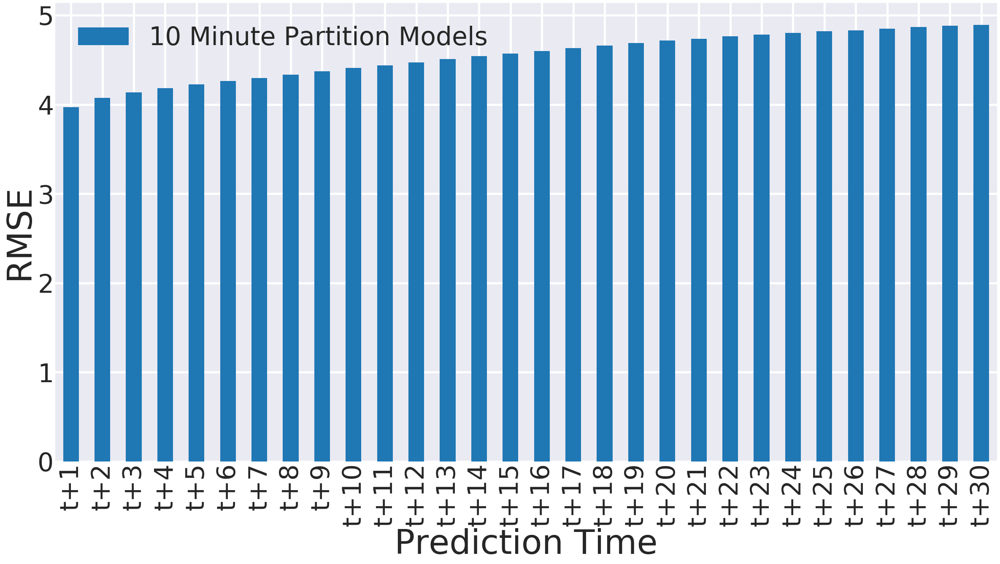

In [102]:
%%local
min10_avg_rmse_plot = min10_avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 20), fontsize=tick_size)

min10_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
min10_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
min10_avg_rmse_plot.grid(linewidth=5)

## 5 minutes

In [103]:
%%spark -o min5_avg_rmse_df

min5_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            ["t+" + str(x) for x in range(1, 31)],
            partition_5min_model_avg_rmse,
        ]).tolist()
    ), 
    [
        "Time", 
        "5 Minute Partition Models"
    ]
)

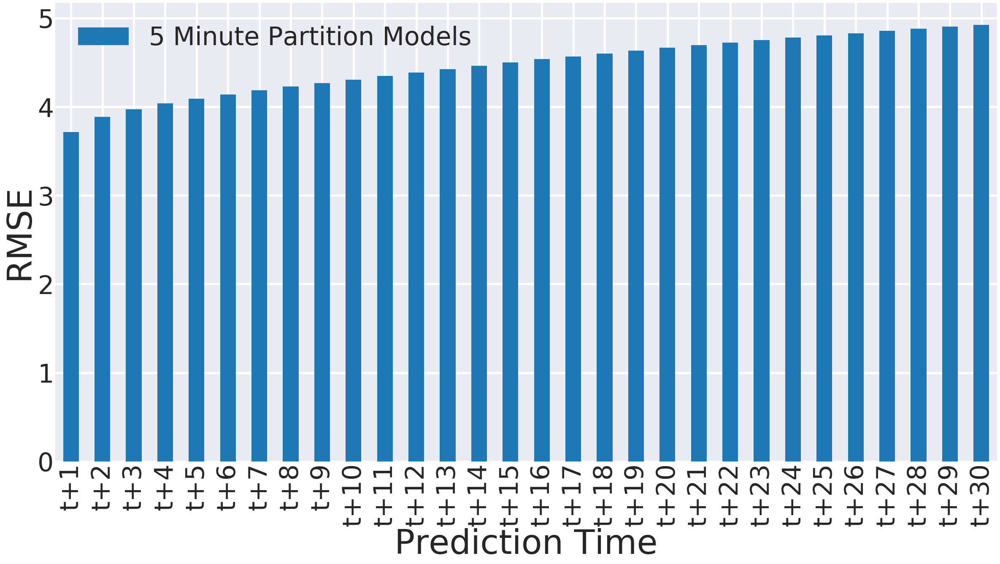

In [104]:
%%local
min5_avg_rmse_plot = min5_avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 20), fontsize=tick_size)

min5_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
min5_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
min5_avg_rmse_plot.grid(linewidth=5)

## 3 minutes 

In [105]:
%%spark -o min3_avg_rmse_df

min3_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            ["t+" + str(x) for x in range(1, 31)],
            partition_3min_model_avg_rmse,
        ]).tolist()
    ), 
    [
        "Time", 
        "3 Minute Partition Models"
    ]
)

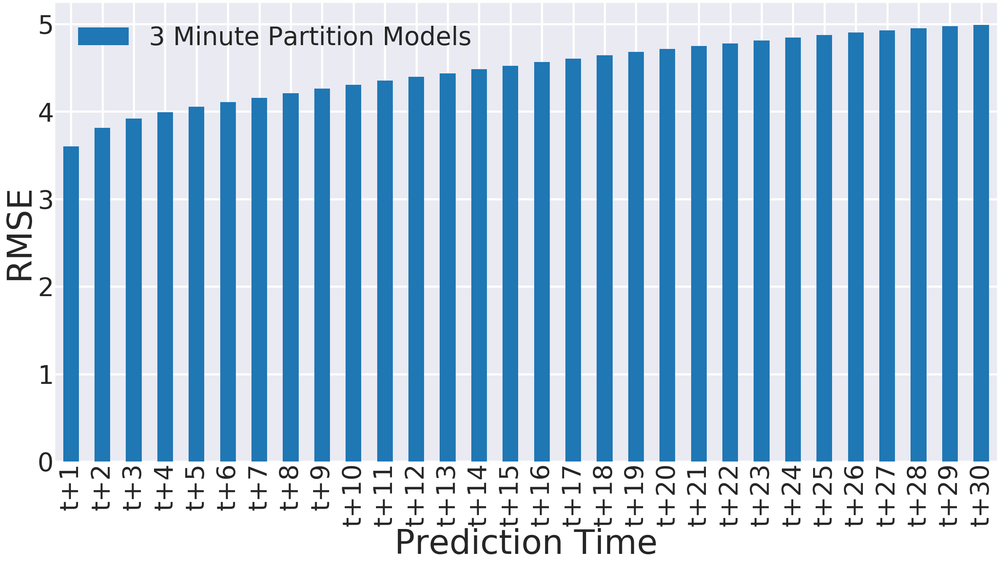

In [106]:
%%local
min3_avg_rmse_plot = min3_avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 20), fontsize=tick_size)

min3_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
min3_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
min3_avg_rmse_plot.grid(linewidth=5)

## Single Sensor

In [107]:
%%spark -o single_avg_rmse_df

single_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            ["t+" + str(x) for x in range(1, 31)],
            single_sensor_model_avg_rmse,
        ]).tolist()
    ), 
    [
        "Time", 
        "Single Sensor Models"
    ]
)

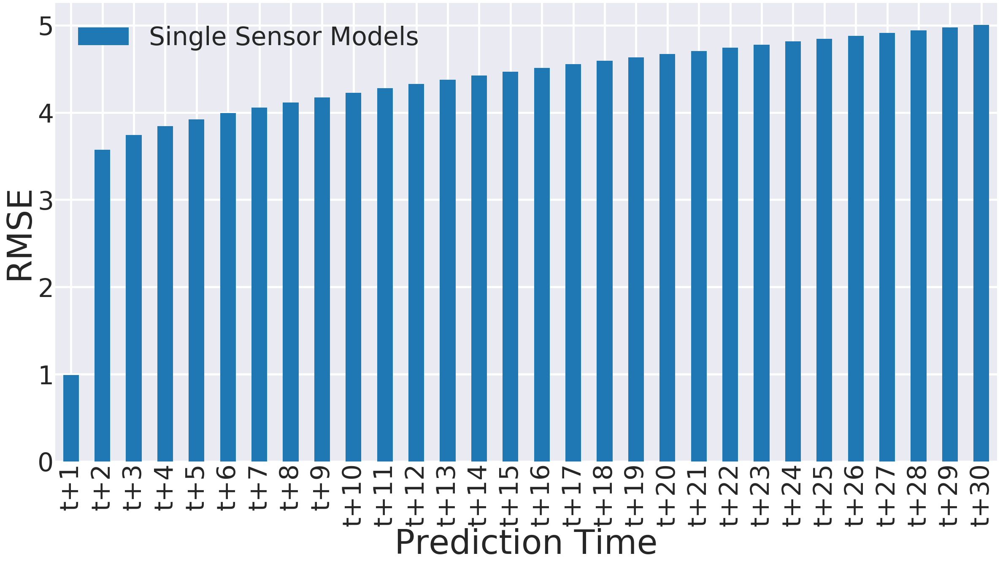

In [108]:
%%local
single_avg_rmse_plot = single_avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 20), fontsize=tick_size)

single_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
single_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
single_avg_rmse_plot.grid(linewidth=5)

## Overlapping

In [109]:
%%spark -o overlapping_avg_rmse_df

overlapping_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            ["t+" + str(x) for x in range(1, 31)],
            overlapping_model_avg_rsme,
        ]).tolist()
    ), 
    [
        "Time", 
        "Overlapping Partition Models"
    ]
)

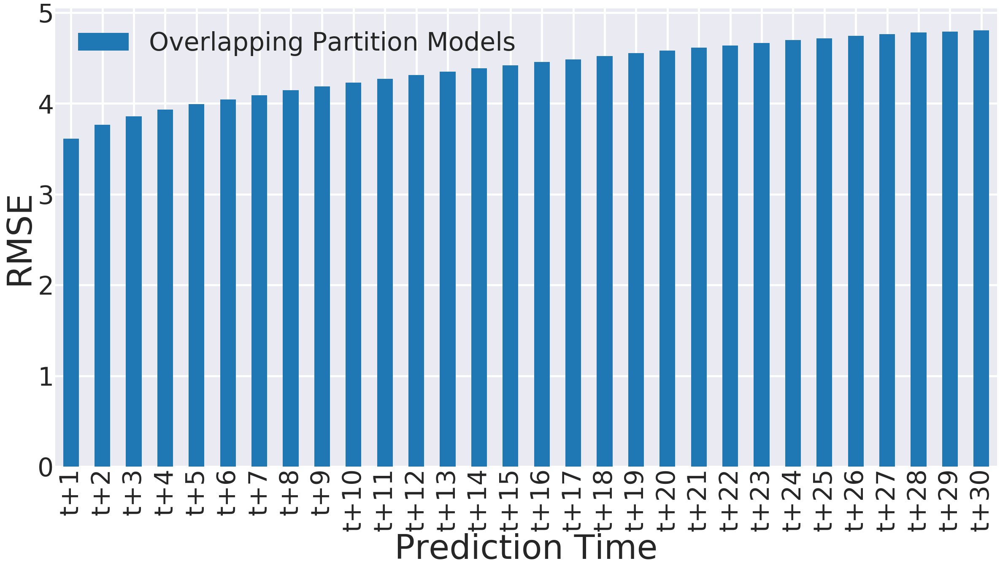

In [110]:
%%local
overlapping_avg_rmse_plot = overlapping_avg_rmse_df.set_index("Time").plot.bar(figsize=(40, 20), fontsize=tick_size)

overlapping_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
overlapping_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
overlapping_avg_rmse_plot.grid(linewidth=5)

## 3 Minute Partition Sensor group RMSE comparison

In [111]:
part3_start_sensors = [s[0] for s in partitions_3min_df.where(col('group') == 'start').select('identifier').collect()]
part3_center_sensors = [s[0] for s in partitions_3min_df.where(col('group') == 'center').select('identifier').collect()]
part3_end_sensors = [s[0] for s in partitions_3min_df.where(col('group') == 'end').select('identifier').collect()]

print len(part3_start_sensors) + len(part3_center_sensors) + len(part3_end_sensors)

1938

In [112]:
part3_start_avg_rmse = np.array([])
part3_center_avg_rmse = np.array([])
part3_end_avg_rmse = np.array([])
single_start_avg_rmse = np.array([])
single_center_avg_rmse = np.array([])
single_end_avg_rmse = np.array([])
all_start_avg_rmse = np.array([])
all_center_avg_rmse = np.array([])
all_end_avg_rmse = np.array([])

if not file_exists(part_3min_path + "avg_center_rmse.npy"):
    
    #Start nodes
    part3_start_avg_rmse = calculate_avg_rmse(part_3min_path, part3_start_sensors)
    single_start_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part3_start_sensors)
    all_start_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part3_start_sensors)
    write_hdfs_file(part_3min_path + "avg_start_rmse.npy", part3_start_avg_rmse)
    write_hdfs_file(part_3min_path + "single_avg_start_rmse.npy", single_start_avg_rmse)
    write_hdfs_file(part_3min_path + "all_avg_start_rmse.npy", all_start_avg_rmse)
    
    #Center nodes
    part3_center_avg_rmse = calculate_avg_rmse(part_3min_path, part3_center_sensors)
    single_center_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part3_center_sensors)
    all_center_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part3_center_sensors)
    write_hdfs_file(part_3min_path + "avg_center_rmse.npy", part3_center_avg_rmse)
    write_hdfs_file(part_3min_path + "single_avg_center_rmse.npy", all_center_avg_rmse)
    write_hdfs_file(part_3min_path + "all_avg_center_rmse.npy", all_center_avg_rmse)
    
    #End nodes
    part3_end_avg_rmse = calculate_avg_rmse(part_3min_path, part3_end_sensors)
    single_end_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part3_end_sensors)
    all_end_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part3_end_sensors)
    write_hdfs_file(part_3min_path + "avg_end_rmse.npy", part3_end_avg_rmse)
    write_hdfs_file(part_3min_path + "single_avg_end_rmse.npy", single_end_avg_rmse)
    write_hdfs_file(part_3min_path + "all_avg_end_rmse.npy", all_end_avg_rmse)
else:
    part3_start_avg_rmse =   read_hdfs_file(part_3min_path + "avg_start_rmse.npy")
    part3_center_avg_rmse =  read_hdfs_file(part_3min_path + "avg_center_rmse.npy")
    part3_end_avg_rmse =     read_hdfs_file(part_3min_path + "avg_end_rmse.npy")
    single_start_avg_rmse =  read_hdfs_file(part_3min_path + "single_avg_start_rmse.npy")
    single_center_avg_rmse = read_hdfs_file(part_3min_path + "single_avg_center_rmse.npy")
    single_end_avg_rmse =    read_hdfs_file(part_3min_path + "single_avg_end_rmse.npy")
    all_start_avg_rmse =     read_hdfs_file(part_3min_path + "all_avg_start_rmse.npy")
    all_center_avg_rmse =    read_hdfs_file(part_3min_path + "all_avg_center_rmse.npy")
    all_end_avg_rmse =       read_hdfs_file(part_3min_path + "all_avg_end_rmse.npy")

In [113]:
%%spark -o part3_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part3_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_start_avg_rmse, indices),
            np.take(part3_start_avg_rmse, indices),
            np.take(all_start_avg_rmse, indices),
            np.take(single_center_avg_rmse, indices),
            np.take(part3_center_avg_rmse, indices),
            np.take(all_center_avg_rmse, indices),
            np.take(single_end_avg_rmse, indices),
            np.take(part3_end_avg_rmse, indices),
            np.take(all_end_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Start Single Sensor Models",
        "Start 3 Minute Partition Models", 
        "Start Whole Traffic Network Model", 
        "Center Single Sensor Models",
        "Center 3 Minute Partition Models", 
        "Center Whole Traffic Network Model", 
        "End Single Sensor Models",
        "End 3 Minute Partition Models", 
        "End Whole Traffic Network Model", 
    ]
)

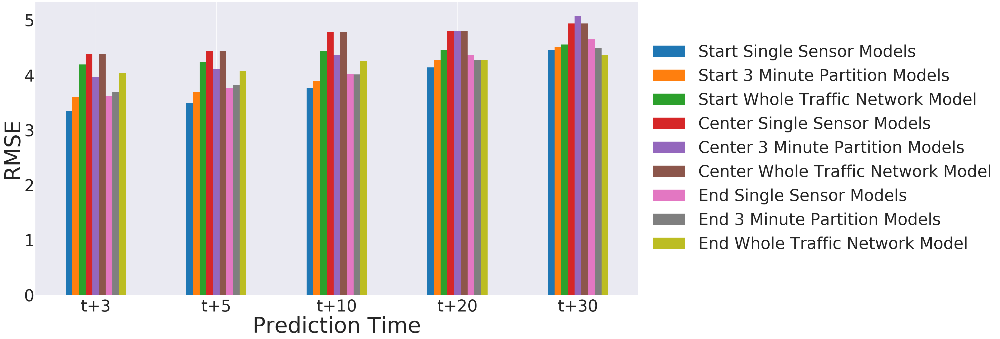

In [114]:
%%local
part3_avg_rmse_plot = part3_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size,
)

part3_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part3_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part3_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
#part3_avg_rmse_plot.set_ylim(0,10)
part3_avg_rmse_plot.legend(ncol= 2)

part3_avg_rmse_plot.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## 10 Minute Partition Sensor group RMSE comparison

In [115]:
part10_start_sensors = [s[0] for s in partitions_10min_df.where(col('group') == 'start').select('identifier').collect()]
part10_center_sensors = [s[0] for s in partitions_10min_df.where(col('group') == 'center').select('identifier').collect()]
part10_end_sensors = [s[0] for s in partitions_10min_df.where(col('group') == 'end').select('identifier').collect()]

print len(part10_start_sensors) + len(part10_center_sensors) + len(part10_end_sensors)

1938

In [116]:
part10_start_avg_rmse = np.array([])
part10_center_avg_rmse = np.array([])
part10_end_avg_rmse = np.array([])
single_start_avg_rmse = np.array([])
single_center_avg_rmse = np.array([])
single_end_avg_rmse = np.array([])
all_start_avg_rmse = np.array([])
all_center_avg_rmse = np.array([])
all_end_avg_rmse = np.array([])

if not file_exists(part_10min_path + "avg_center_rmse.npy"):
    
    #Start nodes
    part10_start_avg_rmse = calculate_avg_rmse(part_10min_path, part10_start_sensors)
    single_start_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part10_start_sensors)
    all_start_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part10_start_sensors)
    write_hdfs_file(part_10min_path + "avg_start_rmse.npy", part10_start_avg_rmse)
    write_hdfs_file(part_10min_path + "single_avg_start_rmse.npy", single_start_avg_rmse)
    write_hdfs_file(part_10min_path + "all_avg_start_rmse.npy", all_start_avg_rmse)
    
    #Center nodes
    part10_center_avg_rmse = calculate_avg_rmse(part_10min_path, part10_center_sensors)
    single_center_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part10_center_sensors)
    all_center_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part10_center_sensors)
    write_hdfs_file(part_10min_path + "avg_center_rmse.npy", part10_center_avg_rmse)
    write_hdfs_file(part_10min_path + "single_avg_center_rmse.npy", all_center_avg_rmse)
    write_hdfs_file(part_10min_path + "all_avg_center_rmse.npy", all_center_avg_rmse)
    
    #End nodes
    part10_end_avg_rmse = calculate_avg_rmse(part_10min_path, part10_end_sensors)
    single_end_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part10_end_sensors)
    all_end_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part10_end_sensors)
    write_hdfs_file(part_10min_path + "avg_end_rmse.npy", part10_end_avg_rmse)
    write_hdfs_file(part_10min_path + "single_avg_end_rmse.npy", single_end_avg_rmse)
    write_hdfs_file(part_10min_path + "all_avg_end_rmse.npy", all_end_avg_rmse)
else:
    part10_start_avg_rmse = read_hdfs_file(part_10min_path + "avg_start_rmse.npy")
    part10_center_avg_rmse = read_hdfs_file(part_10min_path + "avg_center_rmse.npy")
    part10_end_avg_rmse = read_hdfs_file(part_10min_path + "avg_end_rmse.npy")
    single_start_avg_rmse = read_hdfs_file(part_10min_path + "single_avg_start_rmse.npy")
    single_center_avg_rmse = read_hdfs_file(part_10min_path + "single_avg_center_rmse.npy")
    single_end_avg_rmse = read_hdfs_file(part_10min_path + "single_avg_end_rmse.npy")
    all_start_avg_rmse = read_hdfs_file(part_10min_path + "all_avg_start_rmse.npy")
    all_center_avg_rmse = read_hdfs_file(part_10min_path + "all_avg_center_rmse.npy")
    all_end_avg_rmse = read_hdfs_file(part_10min_path + "all_avg_end_rmse.npy")

In [117]:
%%spark -o part10_start_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part10_start_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_start_avg_rmse, indices),
            np.take(part10_start_avg_rmse, indices),
            np.take(all_start_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Single Sensor Models",
        "10 Minute Partition Models", 
        "Whole Traffic Network Model", 
    ]
)

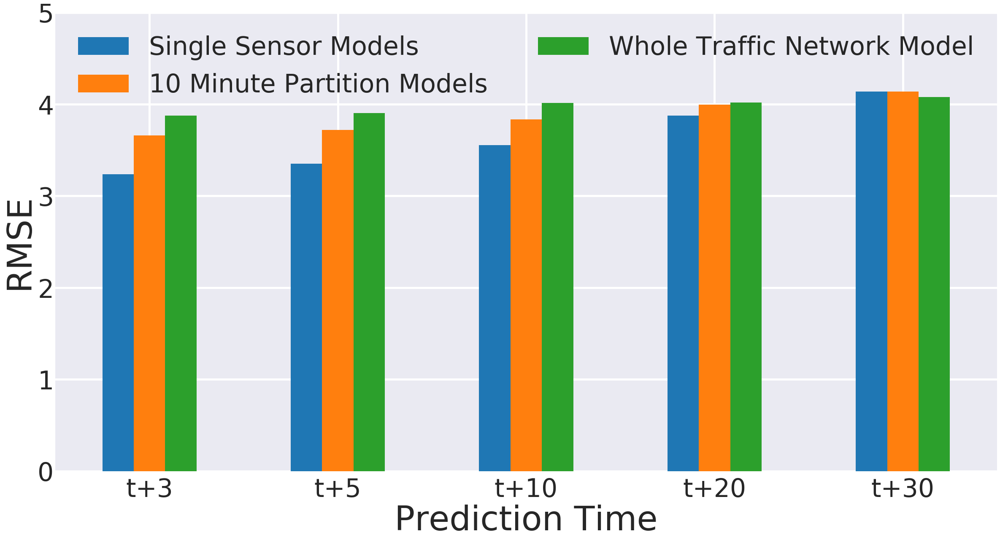

In [118]:
%%local
part10_start_avg_rmse_plot = part10_start_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size
)

part10_start_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part10_start_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part10_start_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
part10_start_avg_rmse_plot.set_ylim(0,5)
part10_start_avg_rmse_plot.legend(ncol=2)
part10_start_avg_rmse_plot.grid(linewidth=5)

In [119]:
%%spark -o part10_center_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part10_center_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_center_avg_rmse, indices),
            np.take(part10_center_avg_rmse, indices),
            np.take(all_center_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Single Sensor Models",
        "10 Minute Partition Models", 
        "Whole Traffic Network Model", 
    ]
)

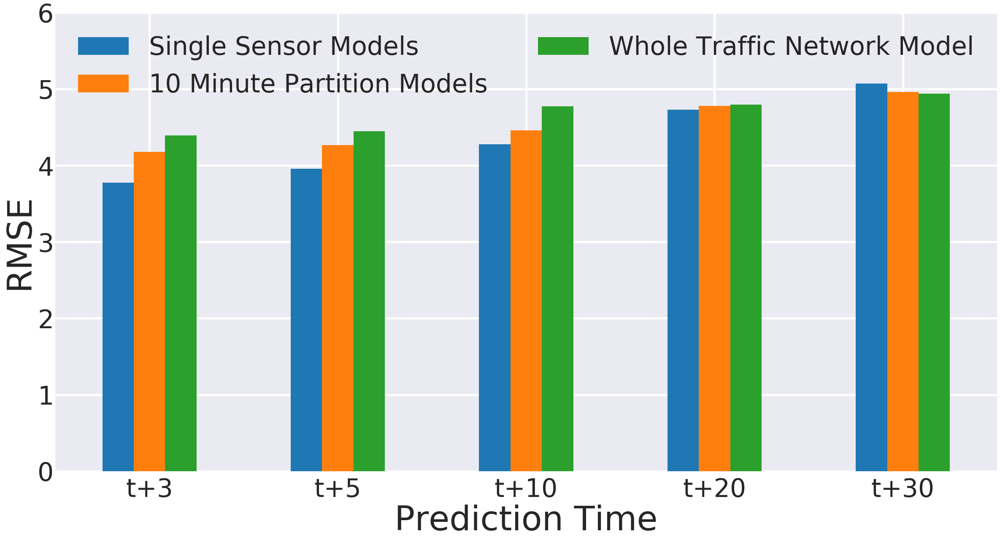

In [120]:
%%local
part10_center_avg_rmse_plot = part10_center_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size
)

part10_center_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part10_center_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part10_center_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
part10_center_avg_rmse_plot.set_ylim(0,6)
part10_center_avg_rmse_plot.legend(ncol=2)
part10_center_avg_rmse_plot.grid(linewidth=5)

In [121]:
%%spark -o part10_end_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part10_end_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_end_avg_rmse, indices),
            np.take(part10_end_avg_rmse, indices),
            np.take(all_end_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Single Sensor Models",
        "10 Minute Partition Models", 
        "Whole Traffic Network Model", 
    ]
)

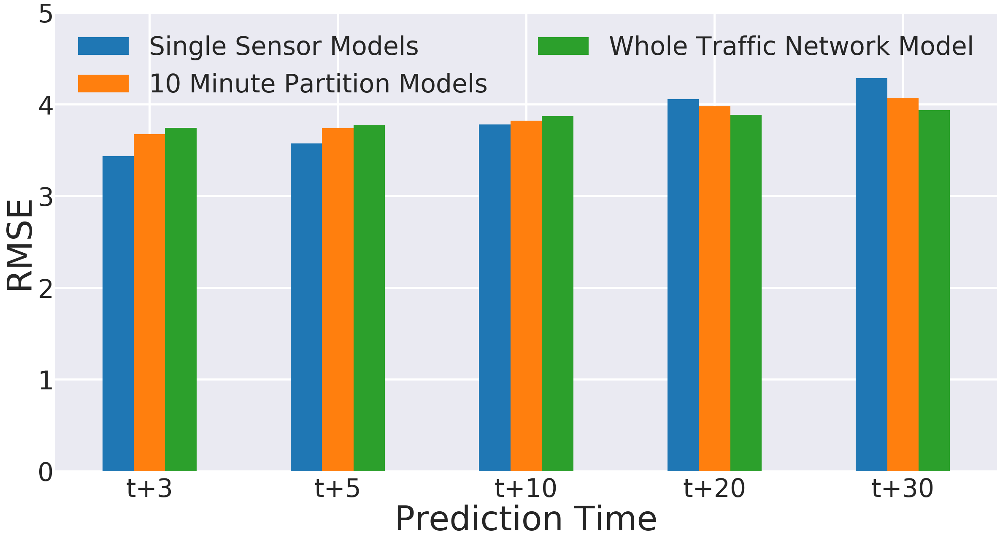

In [122]:
%%local
part10_end_avg_rmse_plot = part10_end_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size
)

part10_end_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part10_end_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part10_end_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
part10_end_avg_rmse_plot.set_ylim(0,5)
part10_end_avg_rmse_plot.legend(ncol=2)
part10_end_avg_rmse_plot.grid(linewidth=5)

## 20 Minute Partition Sensor group RMSE comparison

In [123]:
part20_start_sensors = [s[0] for s in partitions_20min_df.where(col('group') == 'start').select('identifier').collect()]
part20_center_sensors = [s[0] for s in partitions_20min_df.where(col('group') == 'center').select('identifier').collect()]
part20_end_sensors = [s[0] for s in partitions_20min_df.where(col('group') == 'end').select('identifier').collect()]

print len(part20_start_sensors) + len(part20_center_sensors) + len(part20_end_sensors)

1938

In [124]:
part20_start_avg_rmse = np.array([])
part20_center_avg_rmse = np.array([])
part20_end_avg_rmse = np.array([])
single_start_avg_rmse = np.array([])
single_center_avg_rmse = np.array([])
single_end_avg_rmse = np.array([])
all_start_avg_rmse = np.array([])
all_center_avg_rmse = np.array([])
all_end_avg_rmse = np.array([])

if not file_exists(part_20min_path + "avg_center_rmse.npy"):
    
    #Start nodes
    part20_start_avg_rmse = calculate_avg_rmse(part_20min_path, part20_start_sensors)
    single_start_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part20_start_sensors)
    all_start_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part20_start_sensors)
    write_hdfs_file(part_20min_path + "avg_start_rmse.npy", part20_start_avg_rmse)
    write_hdfs_file(part_20min_path + "single_avg_start_rmse.npy", single_start_avg_rmse)
    write_hdfs_file(part_20min_path + "all_avg_start_rmse.npy", all_start_avg_rmse)
    
    #Center nodes
    part20_center_avg_rmse = calculate_avg_rmse(part_20min_path, part20_center_sensors)
    single_center_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part20_center_sensors)
    all_center_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part20_center_sensors)
    write_hdfs_file(part_20min_path + "avg_center_rmse.npy", part20_center_avg_rmse)
    write_hdfs_file(part_20min_path + "single_avg_center_rmse.npy", all_center_avg_rmse)
    write_hdfs_file(part_20min_path + "all_avg_center_rmse.npy", all_center_avg_rmse)
    
    #End nodes
    part20_end_avg_rmse = calculate_avg_rmse(part_20min_path, part20_end_sensors)
    single_end_avg_rmse = calculate_avg_rmse(single_sensor_model_path, part20_end_sensors)
    all_end_avg_rmse = calculate_avg_rmse(all_sensors_model_path, part20_end_sensors)
    write_hdfs_file(part_20min_path + "avg_end_rmse.npy", part20_end_avg_rmse)
    write_hdfs_file(part_20min_path + "single_avg_end_rmse.npy", single_end_avg_rmse)
    write_hdfs_file(part_20min_path + "all_avg_end_rmse.npy", all_end_avg_rmse)
else:
    part20_start_avg_rmse = read_hdfs_file(part_20min_path + "avg_start_rmse.npy")
    part20_center_avg_rmse = read_hdfs_file(part_20min_path + "avg_center_rmse.npy")
    part20_end_avg_rmse = read_hdfs_file(part_20min_path + "avg_end_rmse.npy")
    single_start_avg_rmse = read_hdfs_file(part_20min_path + "single_avg_start_rmse.npy")
    single_center_avg_rmse = read_hdfs_file(part_20min_path + "single_avg_center_rmse.npy")
    single_end_avg_rmse = read_hdfs_file(part_20min_path + "single_avg_end_rmse.npy")
    all_start_avg_rmse = read_hdfs_file(part_20min_path + "all_avg_start_rmse.npy")
    all_center_avg_rmse = read_hdfs_file(part_20min_path + "all_avg_center_rmse.npy")
    all_end_avg_rmse = read_hdfs_file(part_20min_path + "all_avg_end_rmse.npy")

In [125]:
%%spark -o part20_group_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part20_group_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(part20_start_avg_rmse, indices),
            np.take(part20_center_avg_rmse, indices),
            np.take(part20_end_avg_rmse, indices),
        ]).tolist()
    ), 
    [
        "Time", 
        "Start", 
        "Center", 
        "End"
    ]
)

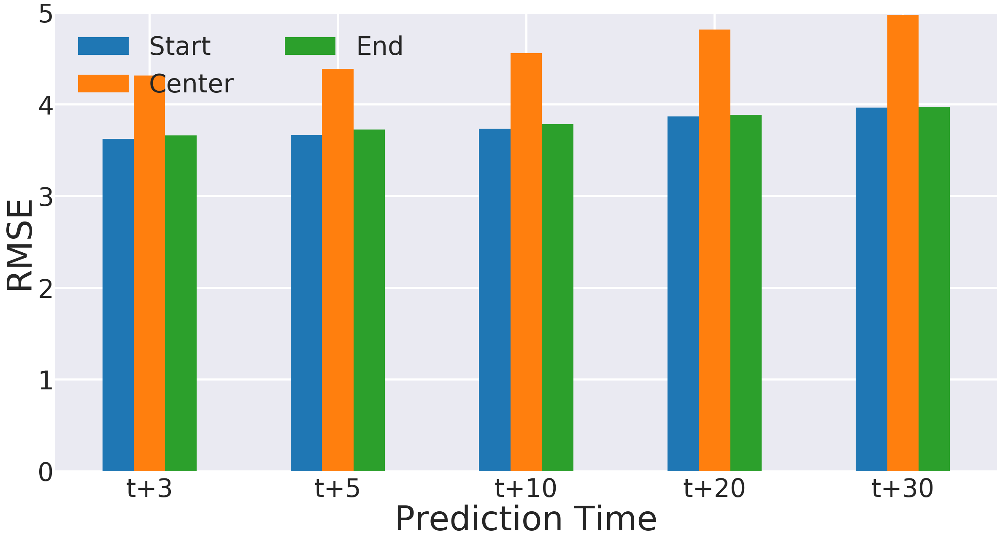

In [126]:
%%local
part20_group_avg_rmse_plot = part20_group_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size
)

part20_group_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part20_group_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part20_group_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
part20_group_avg_rmse_plot.set_ylim(0,5)
part20_group_avg_rmse_plot.legend(ncol=2)
part20_group_avg_rmse_plot.grid(linewidth=5)

In [127]:
%%spark -o part20_start_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part20_start_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_start_avg_rmse, indices),
            np.take(part20_start_avg_rmse, indices),
            np.take(all_start_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Single Sensor Models",
        "20 Minute Partition Models", 
        "Whole Traffic Network Model", 
    ]
)

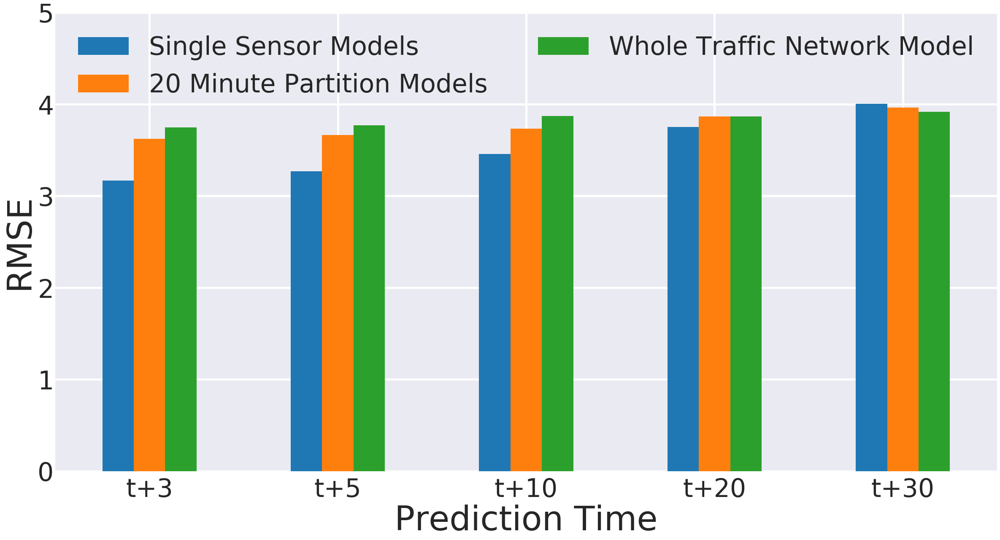

In [128]:
%%local
part20_start_avg_rmse_plot = part20_start_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size
)

part20_start_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part20_start_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part20_start_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
part20_start_avg_rmse_plot.set_ylim(0,5)
part20_start_avg_rmse_plot.legend(ncol=2)
part20_start_avg_rmse_plot.grid(linewidth=5)

In [129]:
%%spark -o part20_center_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part20_center_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_center_avg_rmse, indices),
            np.take(part20_center_avg_rmse, indices),
            np.take(all_center_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Single Sensor Models",
        "20 Minute Partition Models", 
        "Whole Traffic Network Model", 
    ]
)

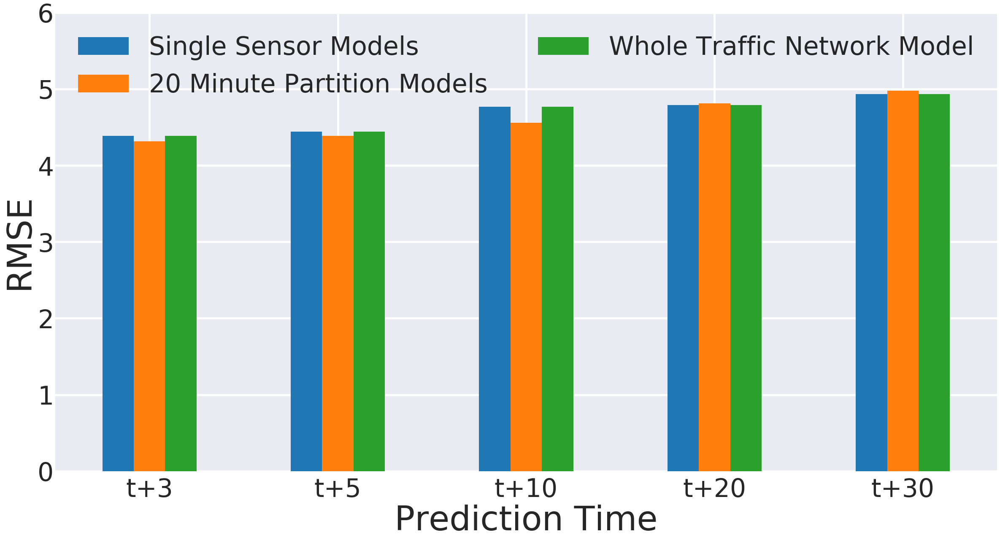

In [130]:
%%local
part20_center_avg_rmse_plot = part20_center_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size
)

part20_center_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part20_center_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part20_center_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
part20_center_avg_rmse_plot.set_ylim(0,6)
part20_center_avg_rmse_plot.legend(ncol=2)
part20_center_avg_rmse_plot.grid(linewidth=5)

In [131]:
%%spark -o part20_end_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part20_end_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_end_avg_rmse, indices),
            np.take(part20_end_avg_rmse, indices),
            np.take(all_end_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Single Sensor Models",
        "20 Minute Partition Models", 
        "Whole Traffic Network Model", 
    ]
)

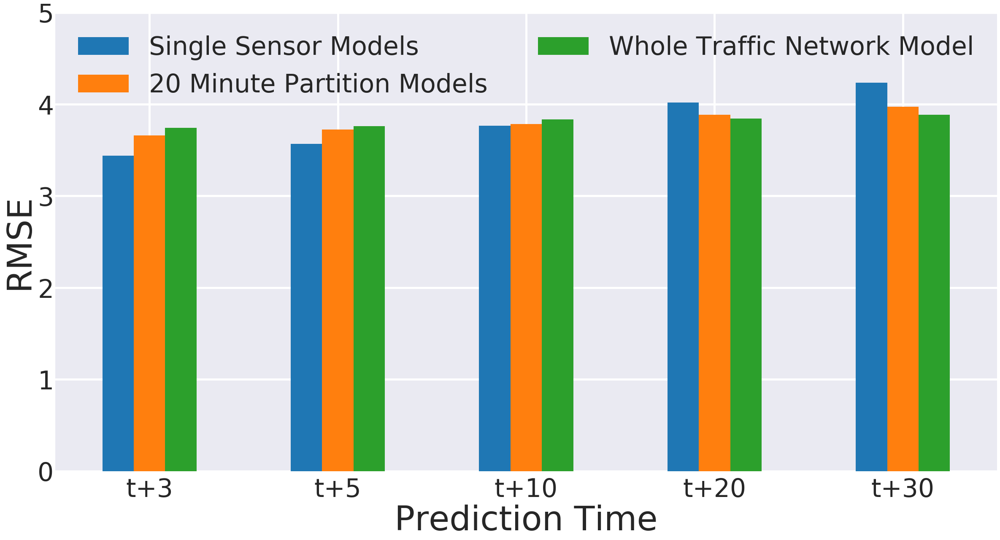

In [132]:
%%local
part20_end_avg_rmse_plot = part20_end_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size
)

part20_end_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part20_end_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part20_end_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
part20_end_avg_rmse_plot.set_ylim(0,5)
part20_end_avg_rmse_plot.legend(ncol=2)
part20_end_avg_rmse_plot.grid(linewidth=5)

In [133]:
%%spark -o part20_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part20_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(single_start_avg_rmse, indices),
            np.take(part20_start_avg_rmse, indices),
            np.take(all_start_avg_rmse, indices),
            np.take(single_center_avg_rmse, indices),
            np.take(part20_center_avg_rmse, indices),
            np.take(all_center_avg_rmse, indices),
            np.take(single_end_avg_rmse, indices),
            np.take(part20_end_avg_rmse, indices),
            np.take(all_end_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Start Single Sensor Models",
        "Start 20 Minute Partition Models", 
        "Start Whole Traffic Network Model", 
        "Center Single Sensor Models",
        "Center 20 Minute Partition Models", 
        "Center Whole Traffic Network Model", 
        "End Single Sensor Models",
        "End 20 Minute Partition Models", 
        "End Whole Traffic Network Model", 
    ]
)

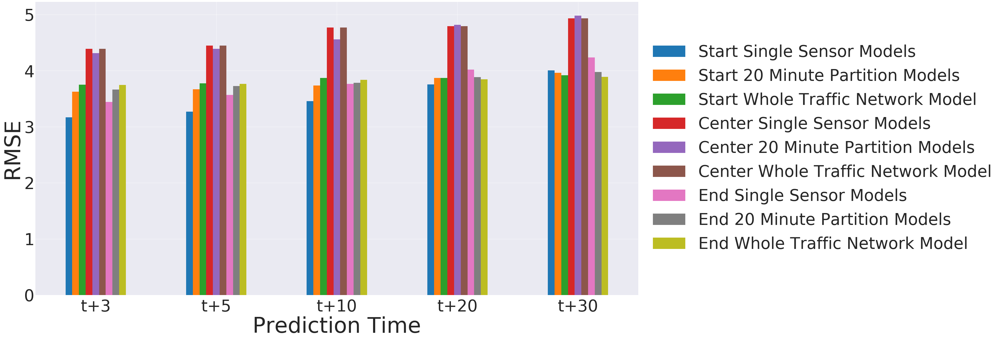

In [134]:
%%local
part20_avg_rmse_plot = part20_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size,
)

part20_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part20_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part20_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
#part20_avg_rmse_plot.set_ylim(0,10)
part20_avg_rmse_plot.legend(ncol= 2)

part20_avg_rmse_plot.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## Pick "Good" Partitions

In [135]:
def test_in(partition):
    return partition in [1,2,3,4,8,10]

f = udf(test_in, BooleanType())

good_part_20min_df = partitions_20min_df.where(f(col('partition'))).orderBy(col('partition'))

good_part20_start_sensors = [s[0] for s in good_part_20min_df.where(col('group') == 'start').select('identifier').collect()]
good_part20_center_sensors = [s[0] for s in good_part_20min_df.where(col('group') == 'center').select('identifier').collect()]
good_part20_end_sensors = [s[0] for s in good_part_20min_df.where(col('group') == 'end').select('identifier').collect()]

print len(good_part20_start_sensors) + len(good_part20_center_sensors) + len(good_part20_end_sensors)

257

In [136]:
good_part20_start_avg_rmse = np.array([])
good_part20_center_avg_rmse = np.array([])
good_part20_end_avg_rmse = np.array([])
good_single_start_avg_rmse = np.array([])
good_single_center_avg_rmse = np.array([])
good_single_end_avg_rmse = np.array([])
good_all_start_avg_rmse = np.array([])
good_all_center_avg_rmse = np.array([])
good_all_end_avg_rmse = np.array([])

if not file_exists(part_20min_path + "good_avg_center_rmse.npy"):
    
    #Start nodes
    good_part20_start_avg_rmse = calculate_avg_rmse(part_20min_path, good_part20_start_sensors)
    good_single_start_avg_rmse = calculate_avg_rmse(single_sensor_model_path, good_part20_start_sensors)
    good_all_start_avg_rmse = calculate_avg_rmse(all_sensors_model_path, good_part20_start_sensors)
    write_hdfs_file(part_20min_path + "good_avg_start_rmse.npy", good_part20_start_avg_rmse)
    write_hdfs_file(part_20min_path + "good_single_avg_start_rmse.npy", good_single_start_avg_rmse)
    write_hdfs_file(part_20min_path + "good_all_avg_start_rmse.npy", good_all_start_avg_rmse)
    
    #Center nodes
    good_part20_center_avg_rmse = calculate_avg_rmse(part_20min_path, good_part20_center_sensors)
    good_single_center_avg_rmse = calculate_avg_rmse(single_sensor_model_path, good_part20_center_sensors)
    good_all_center_avg_rmse = calculate_avg_rmse(all_sensors_model_path, good_part20_center_sensors)
    write_hdfs_file(part_20min_path + "good_avg_center_rmse.npy", good_part20_center_avg_rmse)
    write_hdfs_file(part_20min_path + "good_single_avg_center_rmse.npy", good_single_center_avg_rmse)
    write_hdfs_file(part_20min_path + "good_all_avg_center_rmse.npy", good_all_center_avg_rmse)
    
    #End nodes
    good_part20_end_avg_rmse = calculate_avg_rmse(part_20min_path, good_part20_end_sensors)
    good_single_end_avg_rmse = calculate_avg_rmse(single_sensor_model_path, good_part20_end_sensors)
    good_all_end_avg_rmse = calculate_avg_rmse(all_sensors_model_path, good_part20_end_sensors)
    write_hdfs_file(part_20min_path + "good_avg_end_rmse.npy", good_part20_end_avg_rmse)
    write_hdfs_file(part_20min_path + "good_single_avg_end_rmse.npy", good_single_end_avg_rmse)
    write_hdfs_file(part_20min_path + "good_all_avg_end_rmse.npy", good_all_end_avg_rmse)
else:
    good_part20_start_avg_rmse = read_hdfs_file(part_20min_path + "good_avg_start_rmse.npy")
    good_part20_center_avg_rmse = read_hdfs_file(part_20min_path + "good_avg_center_rmse.npy")
    good_part20_end_avg_rmse = read_hdfs_file(part_20min_path + "good_avg_end_rmse.npy")
    good_single_start_avg_rmse = read_hdfs_file(part_20min_path + "good_single_avg_start_rmse.npy")
    good_single_center_avg_rmse = read_hdfs_file(part_20min_path + "good_single_avg_center_rmse.npy")
    good_single_end_avg_rmse = read_hdfs_file(part_20min_path + "good_single_avg_end_rmse.npy")
    good_all_start_avg_rmse = read_hdfs_file(part_20min_path + "good_all_avg_start_rmse.npy")
    good_all_center_avg_rmse = read_hdfs_file(part_20min_path + "good_all_avg_center_rmse.npy")
    good_all_end_avg_rmse = read_hdfs_file(part_20min_path + "good_all_avg_end_rmse.npy")

In [137]:
%%spark -o part20_avg_rmse_df
indices = [2, 4, 9, 19, 29]

part20_avg_rmse_df = spark.createDataFrame(
    sc.parallelize(
        np.transpose([
            np.take(["t+" + str(x) for x in range(1, 31)], indices),
            np.take(good_single_start_avg_rmse, indices),
            np.take(good_part20_start_avg_rmse, indices),
            np.take(good_all_start_avg_rmse, indices),
            np.take(good_single_center_avg_rmse, indices),
            np.take(good_part20_center_avg_rmse, indices),
            np.take(good_all_center_avg_rmse, indices),
            np.take(good_single_end_avg_rmse, indices),
            np.take(good_part20_end_avg_rmse, indices),
            np.take(good_all_end_avg_rmse, indices)
        ]).tolist()
    ), 
    [
        "Time", 
        "Start Single Sensor Models",
        "Start 20 Minute Partition Models", 
        "Start Whole Traffic Network Model", 
        "Center Single Sensor Models",
        "Center 20 Minute Partition Models", 
        "Center Whole Traffic Network Model", 
        "End Single Sensor Models",
        "End 20 Minute Partition Models", 
        "End Whole Traffic Network Model", 
    ]
)

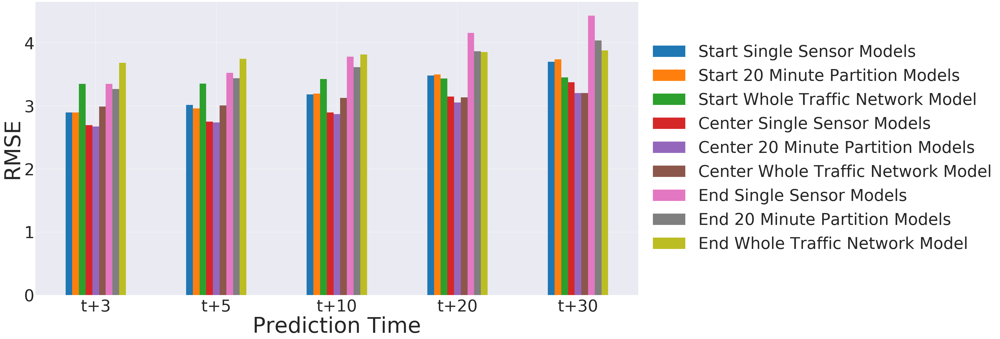

In [138]:
%%local
part20_avg_rmse_plot = part20_avg_rmse_df.set_index("Time").plot(
    kind='bar',
    figsize=(40, 20), 
    fontsize=tick_size,
)

part20_avg_rmse_plot.tick_params(axis='x', pad=15, rotation=0)
part20_avg_rmse_plot.set_xlabel("Prediction Time", {'size':ylabel_size})
part20_avg_rmse_plot.set_ylabel("RMSE", {'size':ylabel_size})
#part20_avg_rmse_plot.set_ylim(0,10)
part20_avg_rmse_plot.legend(ncol= 2)

part20_avg_rmse_plot.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## Comparing Average Training Time

In [139]:
single_avg_t_time = calculate_avg_t_time(single_sensor_model_path, sensors)

In [140]:
ids = [x[0] for x in partitions_3min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part3_avg_t_time = calculate_avg_t_time(part_3min_path + "partition_", ids)

In [141]:
ids = [x[0] for x in partitions_5min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part5_avg_t_time = calculate_avg_t_time(part_5min_path + "partition_", ids)

In [142]:
ids = [x[0] for x in partitions_10min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part10_avg_t_time = calculate_avg_t_time(part_10min_path + "partition_", ids)

In [143]:
ids = [x[0] for x in partitions_20min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part20_avg_t_time = calculate_avg_t_time(part_20min_path + "partition_", ids)

In [144]:
ids = [x[0] for x in partitions_30min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part30_avg_t_time = calculate_avg_t_time(part_30min_path + "partition_", ids)

In [145]:
all_avg_t_time = read_hdfs_file(all_sensors_model_path + "training_time.npy")

In [146]:
ids = [x[0] for x in overlapping_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
overlapping_avg_t_time = calculate_avg_t_time(overlapping_path + "partition_", ids)

In [147]:
%%spark -o avg_t_time_df

avg_t_time_df = spark.createDataFrame(
    sc.parallelize([[
            np.float(single_avg_t_time),
            np.float(part3_avg_t_time),
            np.float(part5_avg_t_time),
            np.float(part10_avg_t_time),
            np.float(part20_avg_t_time),
            #np.float(part30_avg_t_time),
            np.float(all_avg_t_time),
            np.float(overlapping_avg_t_time)
        ]]
    ), schema=StructType()\
        .add("Single Sensor Model", FloatType(), True)\
        .add("3 Minute Partition Models", FloatType(), True)\
        .add("5 Minute Partition Models", FloatType(), True)\
        .add("10 Minute Partition Models", FloatType(), True)\
        .add("20 Minute Partition Models", FloatType(), True)\
        #.add("30 Minute Partition Models", FloatType(), True) \
        .add("Transportation System Model", FloatType(), True)\
        .add("Overlapping Partition Models", FloatType(), True) 
)

In [148]:
%%local
avg_t_time_df

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=6, layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Single Sensor Model': u'Single Sensor Model', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=u'Single Sensor Model'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Single Sensor Model': u'Single Sensor Model', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=None), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

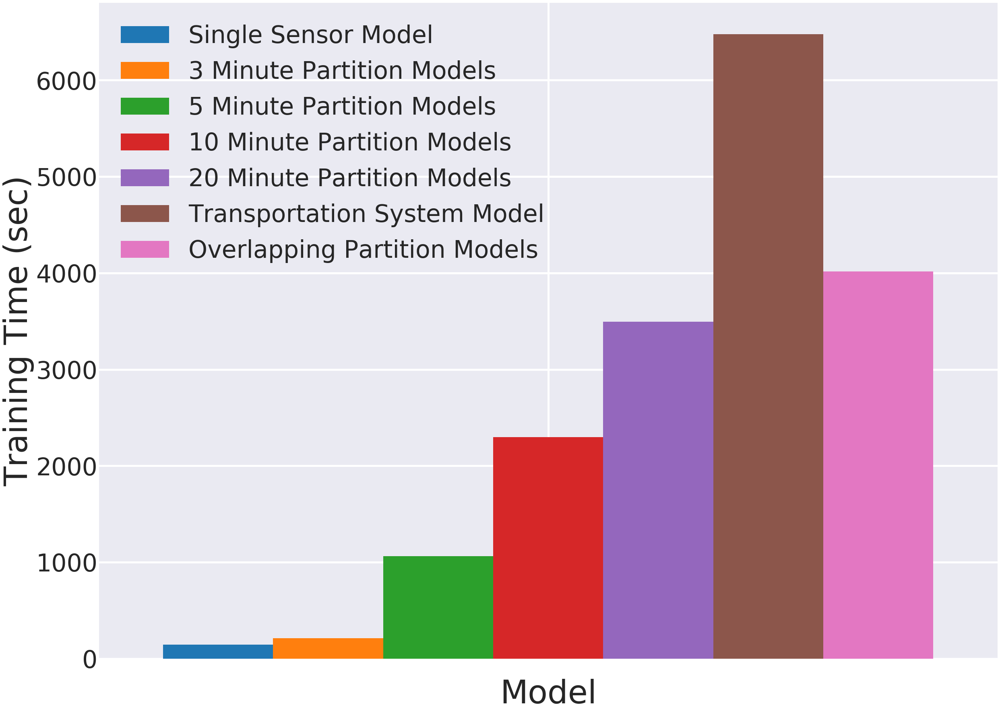

In [149]:
%%local
avg_t_time_plot = avg_t_time_df.plot(
    kind='bar',
    figsize=(40, 30), 
    fontsize=tick_size,
    width= 3
)

avg_t_time_plot.set_xlabel("Model", {'size':xlabel_size}, labelpad=50)
avg_t_time_plot.set_ylabel("Training Time (sec)", {'size':ylabel_size})
avg_t_time_plot.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off

#avg_t_time_plot.legend(loc='center left', bbox_to_anchor=(1, 0.5))
avg_t_time_plot.grid(linewidth=5)

## Comparing Median Training Time

In [150]:
single_median_t_time = calculate_median_t_time(single_sensor_model_path, sensors)

In [151]:
ids = [x[0] for x in partitions_3min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part3_median_t_time = calculate_median_t_time(part_3min_path + "partition_", ids)

In [152]:
ids = [x[0] for x in partitions_5min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part5_median_t_time = calculate_median_t_time(part_5min_path + "partition_", ids)

In [153]:
ids = [x[0] for x in partitions_10min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part10_median_t_time = calculate_median_t_time(part_10min_path + "partition_", ids)

In [154]:
ids = [x[0] for x in partitions_20min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part20_median_t_time = calculate_median_t_time(part_20min_path + "partition_", ids)

In [155]:
ids = [x[0] for x in partitions_30min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part30_median_t_time = calculate_median_t_time(part_30min_path + "partition_", ids)

In [156]:
all_median_t_time = read_hdfs_file(all_sensors_model_path + "training_time.npy")

In [157]:
ids = [x[0] for x in overlapping_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
overlapping_median_t_time = calculate_median_t_time(overlapping_path + "partition_", ids)

In [158]:
%%spark -o median_t_time_df

median_t_time_df = spark.createDataFrame(
    sc.parallelize([[
            np.float(single_median_t_time),
            np.float(part3_median_t_time),
            np.float(part5_median_t_time),
            np.float(part10_median_t_time),
            np.float(part20_median_t_time),
            #np.float(part30_median_t_time),
            np.float(all_median_t_time),
            np.float(overlapping_median_t_time)
        ]]
    ), schema=StructType()\
        .add("Single Sensor Model", FloatType(), True)\
        .add("3 Minute Partition Models", FloatType(), True)\
        .add("5 Minute Partition Models", FloatType(), True)\
        .add("10 Minute Partition Models", FloatType(), True)\
        .add("20 Minute Partition Models", FloatType(), True)\
        #.add("30 Minute Partition Models", FloatType(), True) \
        .add("Transportation System Model", FloatType(), True)\
        .add("Overlapping Partition Models", FloatType(), True) 
)

In [159]:
%%local
median_t_time_df

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=6, layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Single Sensor Model': u'Single Sensor Model', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=u'Single Sensor Model'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Single Sensor Model': u'Single Sensor Model', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=None), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

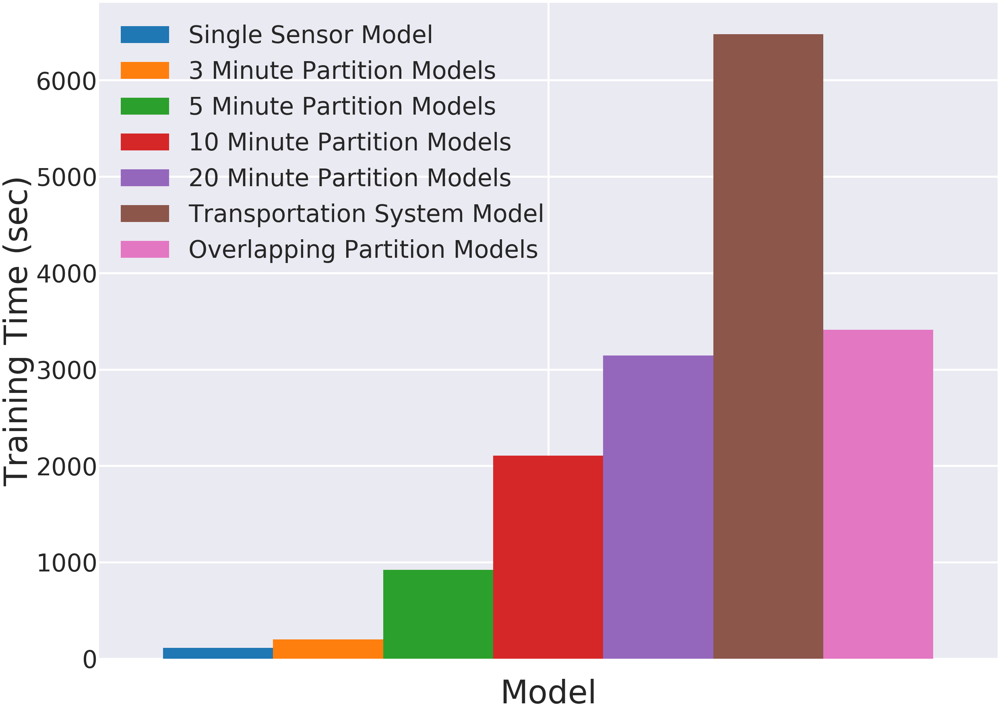

In [160]:
%%local
median_t_time_plot = median_t_time_df.plot(
    kind='bar',
    figsize=(40, 30), 
    fontsize=tick_size,
    width= 3
)

median_t_time_plot.set_xlabel("Model", {'size':xlabel_size}, labelpad=50)
median_t_time_plot.set_ylabel("Training Time (sec)", {'size':ylabel_size})
median_t_time_plot.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off
#median_t_time_plot.legend(loc='center left', bbox_to_anchor=(1, 0.5))
median_t_time_plot.grid(linewidth=5)

## Comparing Total Training Time

In [161]:
single_total_t_time = calculate_total_t_time(single_sensor_model_path, sensors)

In [162]:
ids = [x[0] for x in partitions_3min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part3_total_t_time = calculate_total_t_time(part_3min_path + "partition_", ids)

In [163]:
ids = [x[0] for x in partitions_5min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part5_total_t_time = calculate_total_t_time(part_5min_path + "partition_", ids)

In [164]:
ids = [x[0] for x in partitions_10min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part10_total_t_time = calculate_total_t_time(part_10min_path + "partition_", ids)

In [165]:
ids = [x[0] for x in partitions_20min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part20_total_t_time = calculate_total_t_time(part_20min_path + "partition_", ids)

In [166]:
ids = [x[0] for x in partitions_30min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part30_total_t_time = calculate_total_t_time(part_30min_path + "partition_", ids)

In [167]:
all_total_t_time = read_hdfs_file(all_sensors_model_path + "training_time.npy")

In [168]:
ids = [x[0] for x in overlapping_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
overlapping_total_t_time = calculate_total_t_time(overlapping_path + "partition_", ids)

In [169]:
%%spark -o total_t_time_df

total_t_time_df = spark.createDataFrame(
    sc.parallelize([[
            np.float(single_total_t_time),
            np.float(part3_total_t_time),
            np.float(part5_total_t_time),
            np.float(part10_total_t_time),
            np.float(part20_total_t_time),
            #np.float(part30_total_t_time),
            np.float(all_total_t_time),
            np.float(overlapping_total_t_time)
        ]]
    ), schema=StructType()\
        .add("Single Sensor Model", FloatType(), True)\
        .add("3 Minute Partition Models", FloatType(), True)\
        .add("5 Minute Partition Models", FloatType(), True)\
        .add("10 Minute Partition Models", FloatType(), True)\
        .add("20 Minute Partition Models", FloatType(), True)\
        #.add("30 Minute Partition Models", FloatType(), True) \
        .add("Transportation System Model", FloatType(), True)\
        .add("Overlapping Partition Models", FloatType(), True) 
)

In [170]:
%%local
total_t_time_df

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=6, layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Single Sensor Model': u'Single Sensor Model', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=u'Single Sensor Model'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Single Sensor Model': u'Single Sensor Model', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=None), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

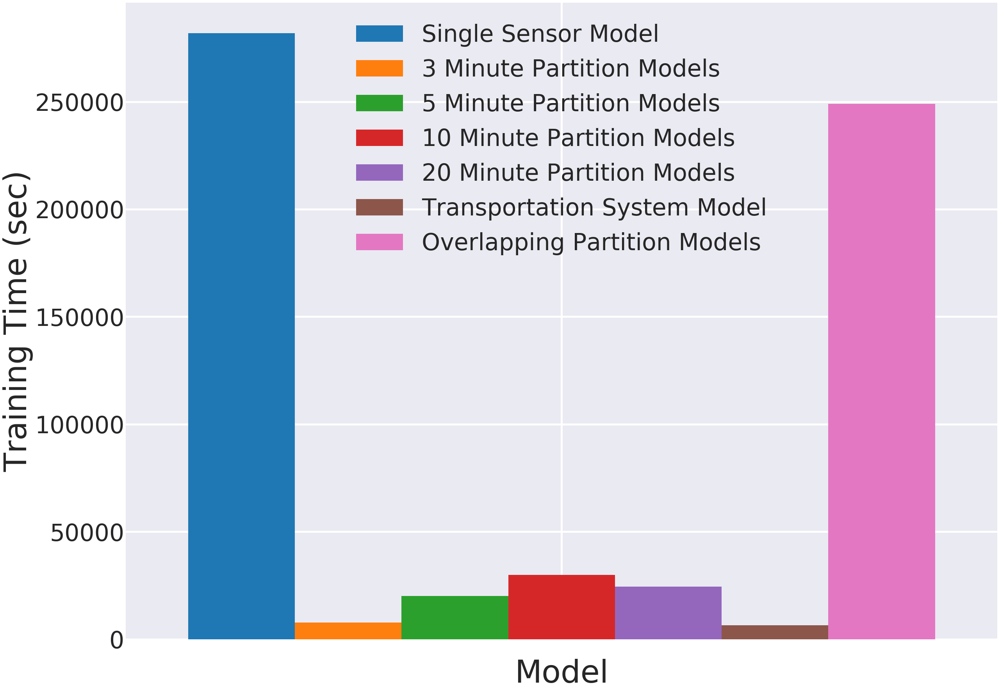

In [171]:
%%local
total_t_time_plot = total_t_time_df.plot(
    kind='bar',
    figsize=(40, 30), 
    fontsize=tick_size,
    width=3
)

total_t_time_plot.set_xlabel("Model", {'size':xlabel_size}, labelpad=50)
total_t_time_plot.set_ylabel("Training Time (sec)", {'size':ylabel_size})
total_t_time_plot.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off
#total_t_time_plot.set_ylim(0,500000)
#total_t_time_plot.legend(
#    loc='center', 
#    bbox_to_anchor=(0.5, 1.02), 
#    ncol=4,
#    borderaxespad=5
#)
total_t_time_plot.grid(linewidth=5)

## Comparing Average Prediciton Time

In [172]:
single_avg_p_time = calculate_avg_p_time(single_sensor_model_path, sensors)

In [173]:
ids = [x[0] for x in partitions_3min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part3_avg_p_time = calculate_avg_p_time(part_3min_path + "partition_", ids)

In [174]:
ids = [x[0] for x in partitions_5min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part5_avg_p_time = calculate_avg_p_time(part_5min_path + "partition_", ids)

In [175]:
ids = [x[0] for x in partitions_10min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part10_avg_p_time = calculate_avg_p_time(part_10min_path + "partition_", ids)

In [176]:
ids = [x[0] for x in partitions_20min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part20_avg_p_time = calculate_avg_p_time(part_20min_path + "partition_", ids)

In [177]:
ids = [x[0] for x in partitions_30min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part30_avg_p_time = calculate_avg_p_time(part_30min_path + "partition_", ids)

In [178]:
all_avg_p_time = read_hdfs_file(all_sensors_model_path + "prediction_time.npy")

In [179]:
ids = [x[0] for x in overlapping_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
overlapping_avg_p_time = calculate_avg_p_time(overlapping_path + "partition_", ids)

In [180]:
%%spark -o avg_p_time_df

avg_p_time_df = spark.createDataFrame(
    sc.parallelize([[
            np.float(single_avg_p_time),
            np.float(part3_avg_p_time),
            np.float(part5_avg_p_time),
            np.float(part10_avg_p_time),
            np.float(part20_avg_p_time),
            #np.float(part30_avg_p_time),
            np.float(all_avg_p_time),
            np.float(overlapping_avg_p_time)
        ]]
    ), schema=StructType()\
        .add("Single Sensor Model", FloatType(), True)\
        .add("3 Minute Partition Models", FloatType(), True)\
        .add("5 Minute Partition Models", FloatType(), True)\
        .add("10 Minute Partition Models", FloatType(), True)\
        .add("20 Minute Partition Models", FloatType(), True)\
        #.add("30 Minute Partition Models", FloatType(), True) \
        .add("Transportation System Model", FloatType(), True)\
        .add("Overlapping Partition Models", FloatType(), True) 
)

In [181]:
%%local
avg_p_time_df

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=6, layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Single Sensor Model': u'Single Sensor Model', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=u'Single Sensor Model'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u'3 Minute Partition Models': u'3 Minute Partition Models', u'20 Minute Partition Models': u'20 Minute Partition Models', '-': None, u'5 Minute Partition Models': u'5 Minute Partition Models', u'Transportation System Model': u'Transportation System Model', u'10 Minute Partition Models': u'10 Minute Partition Models', u'Single Sensor Model': u'Single Sensor Model', u'Overlapping Partition Models': u'Overlapping Partition Models'}, value=None), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

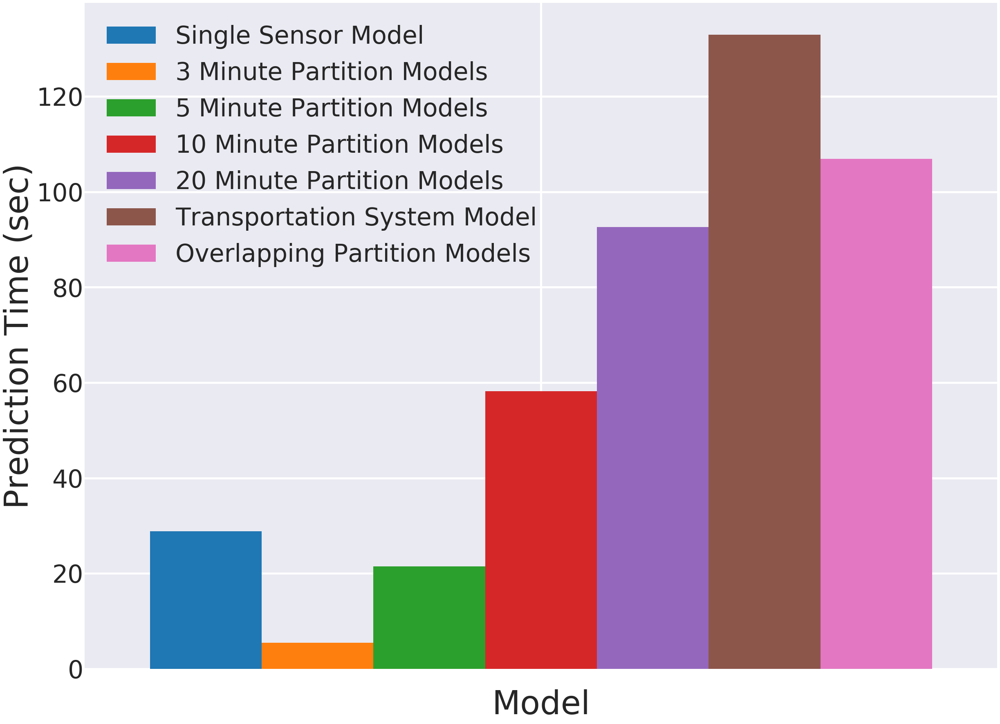

In [182]:
%%local
avg_p_time_plot = avg_p_time_df.plot(
    kind='bar',
    figsize=(40, 30), 
    fontsize=tick_size,
    width=3
)

avg_p_time_plot.set_xlabel("Model", {'size':xlabel_size}, labelpad=50)
avg_p_time_plot.set_ylabel("Prediction Time (sec)", {'size':ylabel_size})
avg_p_time_plot.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off') # labels along the bottom edge are off
#avg_p_time_plot.legend(loc='center left', bbox_to_anchor=(1, 0.5))
avg_p_time_plot.grid(linewidth=5)

## Calculate number of experiments

In [183]:
num_sensors = len(sensors)
num_part3 = len([x[0] for x in partitions_3min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()])
num_part5 = len([x[0] for x in partitions_5min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()])
num_part10 = len([x[0] for x in partitions_10min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()])
num_part20 = len([x[0] for x in partitions_20min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()])
num_part30 = len([x[0] for x in partitions_30min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()])
num_whole_traffic_network = 1
num_overlapping = len([x[0] for x in overlapping_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()])
hyperparameter_tuning = 8

In [184]:
total_experiments = num_sensors + ( num_part3 + num_part5 + num_part10 + num_part20 + num_part30 + num_whole_traffic_network + num_overlapping ) * 2 + hyperparameter_tuning

In [185]:
total_experiments

2236

In [186]:
experiments_df = spark.createDataFrame(
    sc.parallelize(zip(
        [
            "Single Sensor Model",
            "3 Minute Partition Models", 
            "5 Minute Partition Models", 
            "10 Minute Partition Models",
            "20 Minute Partition Models",
            "30 Minute Partition Models",
            "Whole Traffic Network Model",
            "Overlapping Models",
            "Hyperparameter Tuning",
            "Total"
        ],[
            num_sensors,
            num_part3 * 2,
            num_part5 * 2,
            num_part10 * 2,
            num_part20 * 2,
            num_part30 * 2,
            num_whole_traffic_network * 2,
            num_overlapping * 2,
            hyperparameter_tuning,
            total_experiments
        ])), schema=StructType()\
        .add("Experiment", StringType(), True)\
        .add("Number of executions", IntegerType(), True)\
)

In [187]:
experiments_df.show(20, False)

+---------------------------+--------------------+
|Experiment                 |Number of executions|
+---------------------------+--------------------+
|Single Sensor Model        |1938                |
|3 Minute Partition Models  |72                  |
|5 Minute Partition Models  |38                  |
|10 Minute Partition Models |26                  |
|20 Minute Partition Models |14                  |
|30 Minute Partition Models |14                  |
|Whole Traffic Network Model|2                   |
|Overlapping Models         |124                 |
|Hyperparameter Tuning      |8                   |
|Total                      |2236                |
+---------------------------+--------------------+

## 3 Minute Partitions - Sensor Group Box Plot

In [457]:
part3_start_sensors = [s[0] for s in  partitions_3min_df.where(col('group') == 'start').select('identifier').collect()]
part3_center_sensors = [s[0] for s in partitions_3min_df.where(col('group') == 'center').select('identifier').collect()]
part3_end_sensors = [s[0] for s in    partitions_3min_df.where(col('group') == 'end').select('identifier').collect()]

print len(part3_start_sensors) + len(part3_center_sensors) + len(part3_end_sensors)

1938

In [458]:
part3_start_rmse  = np.array([])
part3_center_rmse = np.array([])
part3_end_rmse    = np.array([])

if not file_exists(part_3min_path + "start_rmse.npy"):    
    part3_start_rmse =  calculate_rmse(part_3min_path, part3_start_sensors)
    part3_center_rmse = calculate_rmse(part_3min_path, part3_center_sensors)
    part3_end_rmse =    calculate_rmse(part_3min_path, part3_end_sensors)
    write_hdfs_file(part_3min_path + "start_rmse.npy", part3_start_rmse)
    write_hdfs_file(part_3min_path + "center_rmse.npy",part3_center_rmse)
    write_hdfs_file(part_3min_path + "end_rmse.npy",   part3_end_rmse)
else:    
    part3_start_rmse  = read_hdfs_file(part_3min_path + "start_rmse.npy") 
    part3_center_rmse = read_hdfs_file(part_3min_path + "center_rmse.npy") 
    part3_end_rmse    = read_hdfs_file(part_3min_path + "end_rmse.npy") 

In [459]:
indices = [9, 19, 29]

In [460]:
%%spark -o start_3min_rmse_df
start_3min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part3_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [461]:
%%spark -o center_3min_rmse_df
center_3min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part3_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [462]:
%%spark -o end_3min_rmse_df
end_3min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part3_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

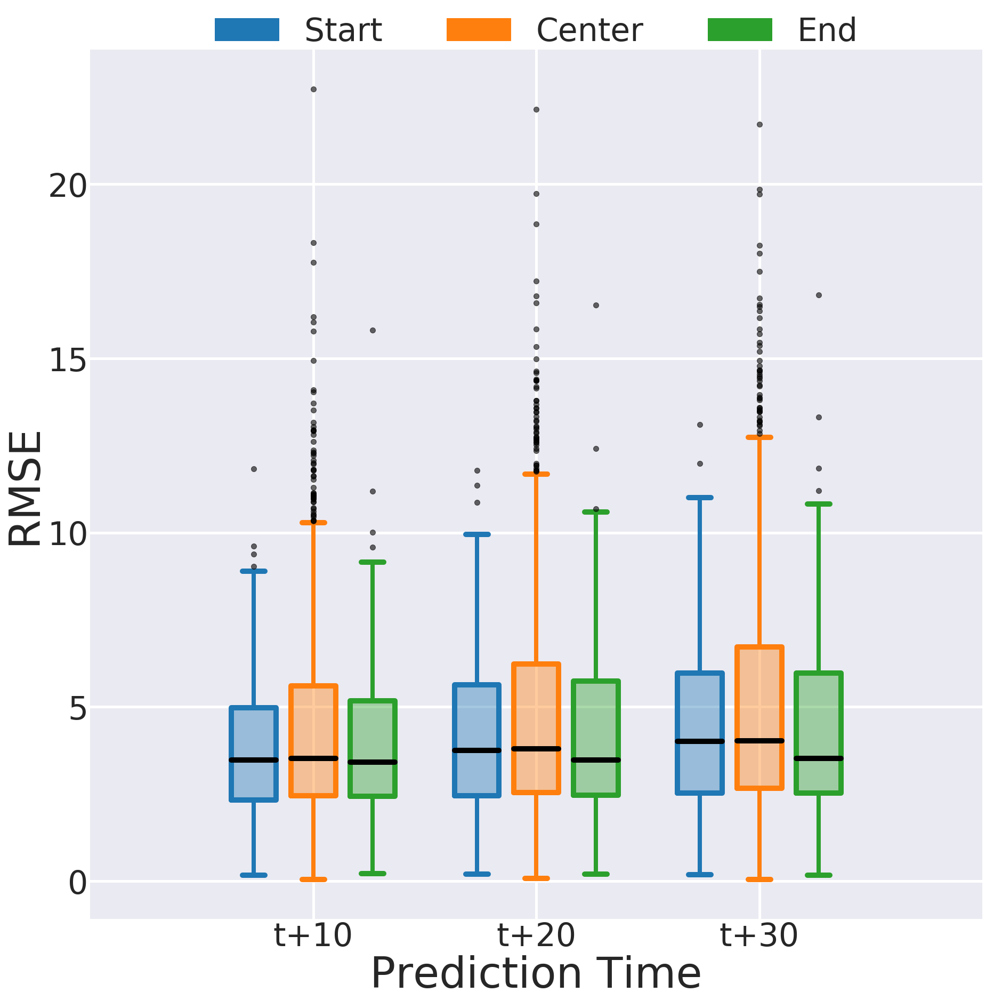

In [463]:
%%local 
data_start = [start_3min_rmse_df.values[0,0], start_3min_rmse_df.values[0,1], start_3min_rmse_df.values[0,2]]
data_center = [center_3min_rmse_df.values[0,0], center_3min_rmse_df.values[0,1], center_3min_rmse_df.values[0,2]]
data_end = [end_3min_rmse_df.values[0,0], end_3min_rmse_df.values[0,1], end_3min_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bpl = plt.boxplot(data_start, positions=np.array(xrange(len(data_start)))*3.0-0.8, widths=0.6, sym="k.")
bpc = plt.boxplot(data_center, positions=np.array(xrange(len(data_center)))*3.0, widths=0.6, sym="k.")
bpr = plt.boxplot(data_end, positions=np.array(xrange(len(data_end)))*3.0+0.8, widths=0.6, sym="k.")
set_box_color(bpl, colors[0])
set_box_color(bpc, colors[1])
set_box_color(bpr, colors[2])

start_patch = mpatches.Patch(color=colors[0], label='Start')
center_patch = mpatches.Patch(color=colors[1], label='Center')
end_patch = mpatches.Patch(color=colors[2], label='End')
plt.legend(
    handles=[start_patch, center_patch, end_patch], 
    loc='center', 
    bbox_to_anchor=(0.5, 1.02), 
    ncol=3,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 3, 3), ticks)
plt.xlim(-3, len(ticks)*3)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

In [464]:
%local 
data_start =  [np.median(start_3min_rmse_df.values[0,0]),  np.median(start_3min_rmse_df.values[0,1]),  np.median(start_3min_rmse_df.values[0,2])]
data_center = [np.median(center_3min_rmse_df.values[0,0]), np.median(center_3min_rmse_df.values[0,1]), np.median(center_3min_rmse_df.values[0,2])]
data_end =    [np.median(end_3min_rmse_df.values[0,0]),    np.median(end_3min_rmse_df.values[0,1]),    np.median(end_3min_rmse_df.values[0,2])]

data = {
'Groups': pd.Series(['Start', 'Center', 'End']),    
't+10': pd.Series([data_start[0], data_center[0], data_end[0]]),
't+20': pd.Series([data_start[1], data_center[1], data_end[1]]),
't+30': pd.Series([data_start[2], data_center[2], data_end[2]])}
pd.DataFrame(data)

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=4, layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u'Groups'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u't+10'), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

## 5 Minute Partitions - Sensor Group Box Plot

In [465]:
part5_start_sensors = [s[0] for s in  partitions_5min_df.where(col('group') == 'start').select('identifier').collect()]
part5_center_sensors = [s[0] for s in partitions_5min_df.where(col('group') == 'center').select('identifier').collect()]
part5_end_sensors = [s[0] for s in    partitions_5min_df.where(col('group') == 'end').select('identifier').collect()]

print len(part5_start_sensors) + len(part5_center_sensors) + len(part5_end_sensors)

1938

In [466]:
part5_start_rmse  = np.array([])
part5_center_rmse = np.array([])
part5_end_rmse    = np.array([])

if not file_exists(part_5min_path + "start_rmse.npy"):    
    part5_start_rmse =  calculate_rmse(part_5min_path, part5_start_sensors)
    part5_center_rmse = calculate_rmse(part_5min_path, part5_center_sensors)
    part5_end_rmse =    calculate_rmse(part_5min_path, part5_end_sensors)
    write_hdfs_file(part_5min_path + "start_rmse.npy", part5_start_rmse)
    write_hdfs_file(part_5min_path + "center_rmse.npy",part5_center_rmse)
    write_hdfs_file(part_5min_path + "end_rmse.npy",   part5_end_rmse)
else:    
    part5_start_rmse  = read_hdfs_file(part_5min_path + "start_rmse.npy") 
    part5_center_rmse = read_hdfs_file(part_5min_path + "center_rmse.npy") 
    part5_end_rmse    = read_hdfs_file(part_5min_path + "end_rmse.npy")

In [467]:
indices = [9, 19, 29]

In [468]:
%%spark -o start_5min_rmse_df
start_5min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part5_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [469]:
%%spark -o center_5min_rmse_df
center_5min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part5_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [470]:
%%spark -o end_5min_rmse_df
end_5min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part5_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

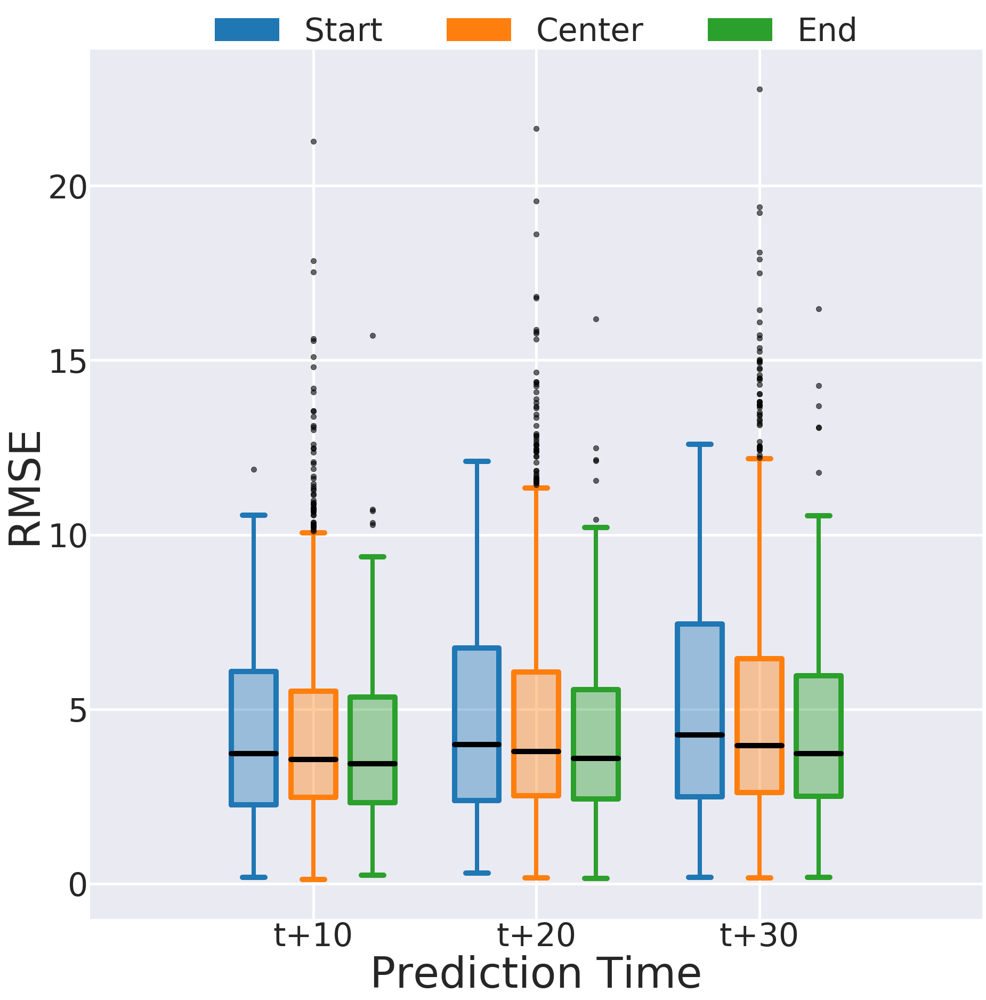

In [471]:
%%local 
data_start =  [ start_5min_rmse_df.values[0,0],  start_5min_rmse_df.values[0,1],  start_5min_rmse_df.values[0,2]]
data_center = [center_5min_rmse_df.values[0,0], center_5min_rmse_df.values[0,1], center_5min_rmse_df.values[0,2]]
data_end =    [   end_5min_rmse_df.values[0,0],    end_5min_rmse_df.values[0,1],    end_5min_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bpl = plt.boxplot(data_start, positions=np.array(xrange(len(data_start)))*3.0-0.8, widths=0.6, sym="k.")
bpc = plt.boxplot(data_center, positions=np.array(xrange(len(data_center)))*3.0, widths=0.6, sym="k.")
bpr = plt.boxplot(data_end, positions=np.array(xrange(len(data_end)))*3.0+0.8, widths=0.6, sym="k.")
set_box_color(bpl, colors[0])
set_box_color(bpc, colors[1])
set_box_color(bpr, colors[2])

start_patch = mpatches.Patch(color=colors[0], label='Start')
center_patch = mpatches.Patch(color=colors[1], label='Center')
end_patch = mpatches.Patch(color=colors[2], label='End')
plt.legend(
    handles=[start_patch, center_patch, end_patch], 
    loc='center', 
    bbox_to_anchor=(0.5, 1.02), 
    ncol=3,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 3, 3), ticks)
plt.xlim(-3, len(ticks)*3)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

In [472]:
%local 
data_start =  [np.median(start_5min_rmse_df.values[0,0]),  np.median(start_5min_rmse_df.values[0,1]),  np.median(start_5min_rmse_df.values[0,2])]
data_center = [np.median(center_5min_rmse_df.values[0,0]), np.median(center_5min_rmse_df.values[0,1]), np.median(center_5min_rmse_df.values[0,2])]
data_end =    [np.median(end_5min_rmse_df.values[0,0]),    np.median(end_5min_rmse_df.values[0,1]),    np.median(end_5min_rmse_df.values[0,2])]

data = {
'Groups': pd.Series(['Start', 'Center', 'End']),    
't+10': pd.Series([data_start[0], data_center[0], data_end[0]]),
't+20': pd.Series([data_start[1], data_center[1], data_end[1]]),
't+30': pd.Series([data_start[2], data_center[2], data_end[2]])}
pd.DataFrame(data)

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=4, layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u'Groups'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u't+10'), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

## 10 Minute Partitions - Sensor Group Box Plot

In [473]:
part10_start_sensors =  [s[0] for s in  partitions_10min_df.where(col('group') == 'start').select('identifier').collect()]
part10_center_sensors = [s[0] for s in  partitions_10min_df.where(col('group') == 'center').select('identifier').collect()]
part10_end_sensors =    [s[0] for s in  partitions_10min_df.where(col('group') == 'end').select('identifier').collect()]

print len(part10_start_sensors) + len(part10_center_sensors) + len(part10_end_sensors)

1938

In [474]:
part10_start_rmse  = np.array([])
part10_center_rmse = np.array([])
part10_end_rmse    = np.array([])

if not file_exists(part_10min_path + "start_rmse.npy"):    
    part10_start_rmse =  calculate_rmse(part_10min_path, part10_start_sensors)
    part10_center_rmse = calculate_rmse(part_10min_path, part10_center_sensors)
    part10_end_rmse =    calculate_rmse(part_10min_path, part10_end_sensors)
    write_hdfs_file(part_10min_path + "start_rmse.npy", part10_start_rmse)
    write_hdfs_file(part_10min_path + "center_rmse.npy",part10_center_rmse)
    write_hdfs_file(part_10min_path + "end_rmse.npy",   part10_end_rmse)
else:    
    part10_start_rmse  = read_hdfs_file(part_10min_path + "start_rmse.npy") 
    part10_center_rmse = read_hdfs_file(part_10min_path + "center_rmse.npy") 
    part10_end_rmse    = read_hdfs_file(part_10min_path + "end_rmse.npy")

In [475]:
indices = [9, 19, 29]

In [476]:
%%spark -o start_10min_rmse_df
start_10min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part10_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [477]:
%%spark -o center_10min_rmse_df
center_10min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part10_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [478]:
%%spark -o end_10min_rmse_df
end_10min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part10_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

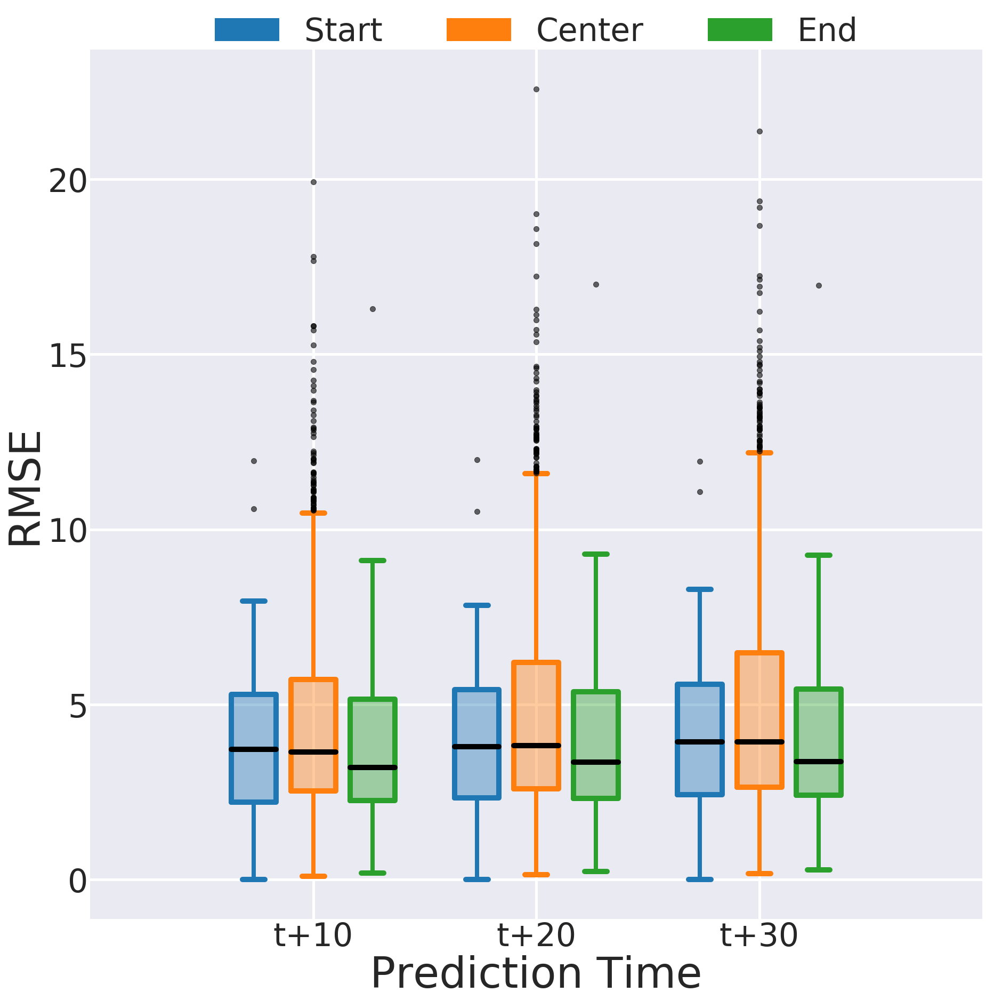

In [479]:
%%local 
data_start =  [ start_10min_rmse_df.values[0,0],  start_10min_rmse_df.values[0,1],  start_10min_rmse_df.values[0,2]]
data_center = [center_10min_rmse_df.values[0,0], center_10min_rmse_df.values[0,1], center_10min_rmse_df.values[0,2]]
data_end =    [   end_10min_rmse_df.values[0,0],    end_10min_rmse_df.values[0,1],    end_10min_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bpl = plt.boxplot(data_start, positions=np.array(xrange(len(data_start)))*3.0-0.8, widths=0.6, sym="k.")
bpc = plt.boxplot(data_center, positions=np.array(xrange(len(data_center)))*3.0, widths=0.6, sym="k.")
bpr = plt.boxplot(data_end, positions=np.array(xrange(len(data_end)))*3.0+0.8, widths=0.6, sym="k.")
set_box_color(bpl, colors[0])
set_box_color(bpc, colors[1])
set_box_color(bpr, colors[2])

start_patch = mpatches.Patch(color=colors[0], label='Start')
center_patch = mpatches.Patch(color=colors[1], label='Center')
end_patch = mpatches.Patch(color=colors[2], label='End')
plt.legend(
    handles=[start_patch, center_patch, end_patch], 
    loc='center', 
    bbox_to_anchor=(0.5, 1.02), 
    ncol=3,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 3, 3), ticks)
plt.xlim(-3, len(ticks)*3)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

In [480]:
%local 
data_start =  [np.median(start_10min_rmse_df.values[0,0]),  np.median(start_10min_rmse_df.values[0,1]),  np.median(start_10min_rmse_df.values[0,2])]
data_center = [np.median(center_10min_rmse_df.values[0,0]), np.median(center_10min_rmse_df.values[0,1]), np.median(center_10min_rmse_df.values[0,2])]
data_end =    [np.median(end_10min_rmse_df.values[0,0]),    np.median(end_10min_rmse_df.values[0,1]),    np.median(end_10min_rmse_df.values[0,2])]

data = {
'Groups': pd.Series(['Start', 'Center', 'End']),    
't+10': pd.Series([data_start[0], data_center[0], data_end[0]]),
't+20': pd.Series([data_start[1], data_center[1], data_end[1]]),
't+30': pd.Series([data_start[2], data_center[2], data_end[2]])}
pd.DataFrame(data)

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=4, layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u'Groups'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u't+10'), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

## 20 Minute Partitions - Sensor Group Box Plot

In [481]:
part20_start_sensors =  [s[0] for s in partitions_20min_df.where(col('group') == 'start').select('identifier').collect()]
part20_center_sensors = [s[0] for s in partitions_20min_df.where(col('group') == 'center').select('identifier').collect()]
part20_end_sensors =    [s[0] for s in partitions_20min_df.where(col('group') == 'end').select('identifier').collect()]

print len(part20_start_sensors) + len(part20_center_sensors) + len(part20_end_sensors)

1938

In [482]:
part20_start_rmse  = np.array([])
part20_center_rmse = np.array([])
part20_end_rmse    = np.array([])

if not file_exists(part_20min_path + "start_rmse.npy"):    
    part20_start_rmse =  calculate_rmse(part_20min_path, part20_start_sensors)
    part20_center_rmse = calculate_rmse(part_20min_path, part20_center_sensors)
    part20_end_rmse =    calculate_rmse(part_20min_path, part20_end_sensors)
    write_hdfs_file(part_20min_path + "start_rmse.npy", part20_start_rmse)
    write_hdfs_file(part_20min_path + "center_rmse.npy",part20_center_rmse)
    write_hdfs_file(part_20min_path + "end_rmse.npy",   part20_end_rmse)
else:    
    part20_start_rmse  = read_hdfs_file(part_20min_path + "start_rmse.npy") 
    part20_center_rmse = read_hdfs_file(part_20min_path + "center_rmse.npy") 
    part20_end_rmse    = read_hdfs_file(part_20min_path + "end_rmse.npy")

In [483]:
indices = [9, 19, 29]

In [484]:
%%spark -o start_20min_rmse_df
start_20min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part20_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [485]:
%%spark -o center_20min_rmse_df
center_20min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part20_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [486]:
%%spark -o end_20min_rmse_df
end_20min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part20_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

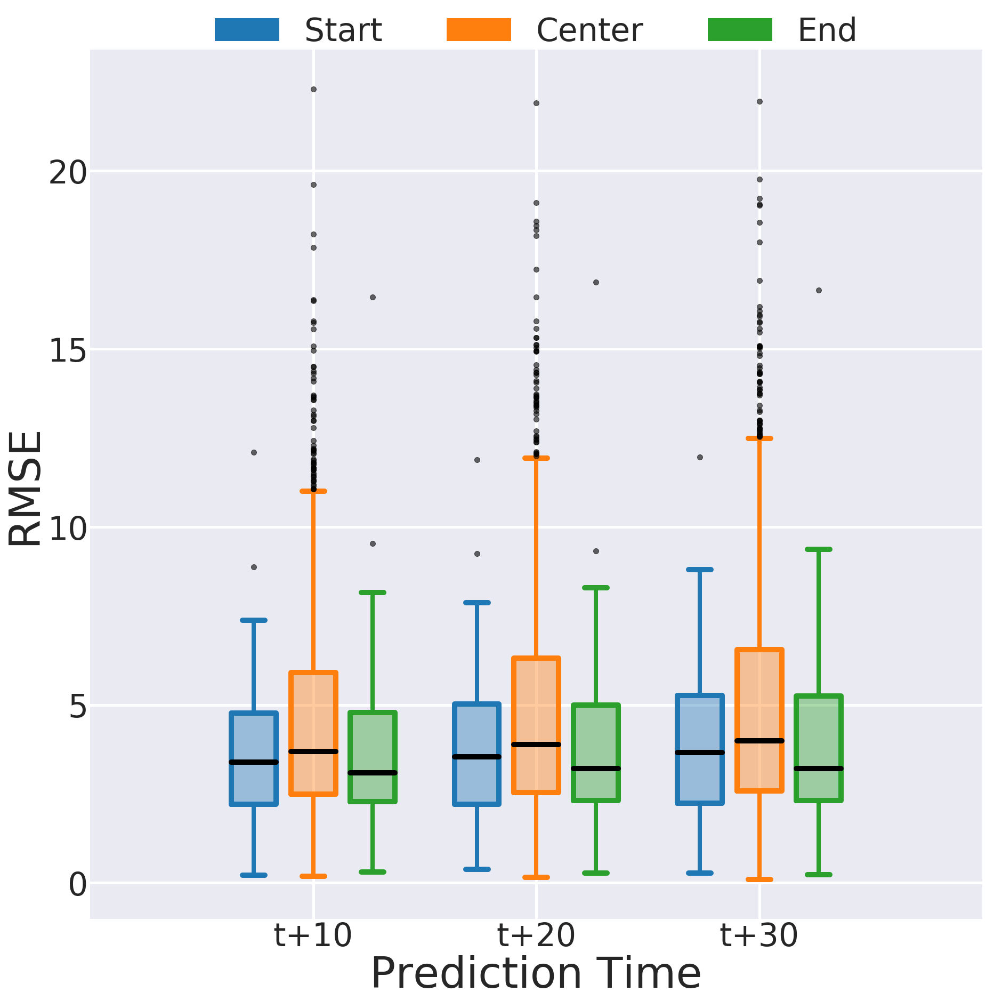

In [487]:
%%local 
data_start =  [ start_20min_rmse_df.values[0,0],  start_20min_rmse_df.values[0,1],  start_20min_rmse_df.values[0,2]]
data_center = [center_20min_rmse_df.values[0,0], center_20min_rmse_df.values[0,1], center_20min_rmse_df.values[0,2]]
data_end =    [   end_20min_rmse_df.values[0,0],    end_20min_rmse_df.values[0,1],    end_20min_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bpl = plt.boxplot(data_start, positions=np.array(xrange(len(data_start)))*3.0-0.8, widths=0.6, sym="k.")
bpc = plt.boxplot(data_center, positions=np.array(xrange(len(data_center)))*3.0, widths=0.6, sym="k.")
bpr = plt.boxplot(data_end, positions=np.array(xrange(len(data_end)))*3.0+0.8, widths=0.6, sym="k.")
set_box_color(bpl, colors[0])
set_box_color(bpc, colors[1])
set_box_color(bpr, colors[2])

start_patch = mpatches.Patch(color=colors[0], label='Start')
center_patch = mpatches.Patch(color=colors[1], label='Center')
end_patch = mpatches.Patch(color=colors[2], label='End')
plt.legend(
    handles=[start_patch, center_patch, end_patch], 
    loc='center', 
    bbox_to_anchor=(0.5, 1.02), 
    ncol=3,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 3, 3), ticks)
plt.xlim(-3, len(ticks)*3)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

In [488]:
%local 
data_start =  [np.median(start_20min_rmse_df.values[0,0]),  np.median(start_20min_rmse_df.values[0,1]),  np.median(start_20min_rmse_df.values[0,2])]
data_center = [np.median(center_20min_rmse_df.values[0,0]), np.median(center_20min_rmse_df.values[0,1]), np.median(center_20min_rmse_df.values[0,2])]
data_end =    [np.median(end_20min_rmse_df.values[0,0]),    np.median(end_20min_rmse_df.values[0,1]),    np.median(end_20min_rmse_df.values[0,2])]

data = {
'Groups': pd.Series(['Start', 'Center', 'End']),    
't+10': pd.Series([data_start[0], data_center[0], data_end[0]]),
't+20': pd.Series([data_start[1], data_center[1], data_end[1]]),
't+30': pd.Series([data_start[2], data_center[2], data_end[2]])}
pd.DataFrame(data)

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=4, layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u'Groups'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u't+10'), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

## 30 Minute Partitions - Sensor Group Box Plot

In [489]:
part30_start_sensors =  [s[0] for s in  partitions_30min_df.where(col('group') == 'start').select('identifier').collect()]
part30_center_sensors = [s[0] for s in  partitions_30min_df.where(col('group') == 'center').select('identifier').collect()]
part30_end_sensors =    [s[0] for s in  partitions_30min_df.where(col('group') == 'end').select('identifier').collect()]

print len(part30_start_sensors) + len(part30_center_sensors) + len(part30_end_sensors)

1938

In [490]:
part30_start_rmse  = np.array([])
part30_center_rmse = np.array([])
part30_end_rmse    = np.array([])

if not file_exists(part_30min_path + "start_rmse.npy"):    
    part30_start_rmse =  calculate_rmse(part_30min_path, part30_start_sensors)
    part30_center_rmse = calculate_rmse(part_30min_path, part30_center_sensors)
    part30_end_rmse =    calculate_rmse(part_30min_path, part30_end_sensors)
    write_hdfs_file(part_30min_path + "start_rmse.npy", part30_start_rmse)
    write_hdfs_file(part_30min_path + "center_rmse.npy",part30_center_rmse)
    write_hdfs_file(part_30min_path + "end_rmse.npy",   part30_end_rmse)
else:    
    part30_start_rmse  = read_hdfs_file(part_30min_path + "start_rmse.npy") 
    part30_center_rmse = read_hdfs_file(part_30min_path + "center_rmse.npy") 
    part30_end_rmse    = read_hdfs_file(part_30min_path + "end_rmse.npy")

In [491]:
indices = [9, 19, 29]

In [492]:
%%spark -o start_30min_rmse_df
start_30min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part30_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [493]:
%%spark -o center_30min_rmse_df
center_30min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part30_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [494]:
%%spark -o end_30min_rmse_df
end_30min_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part30_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

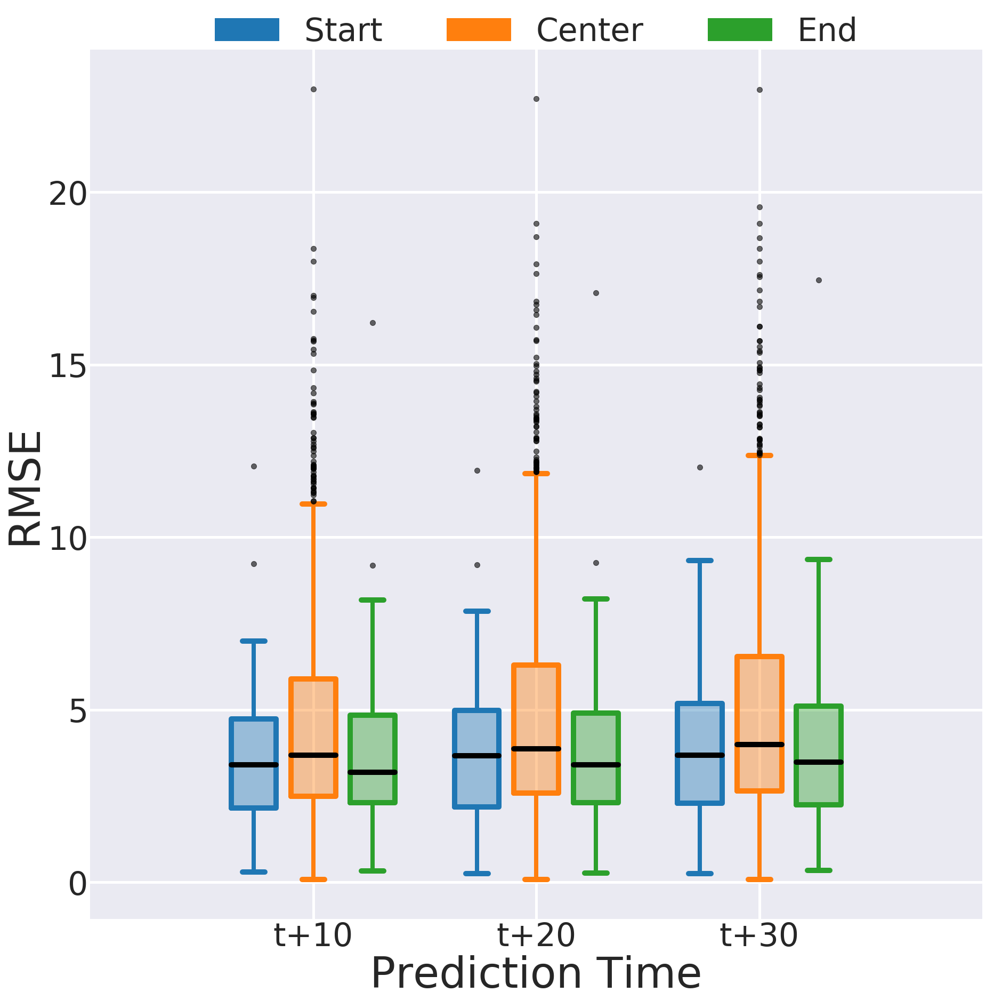

In [495]:
%%local 
data_start =  [ start_30min_rmse_df.values[0,0],  start_30min_rmse_df.values[0,1],  start_30min_rmse_df.values[0,2]]
data_center = [center_30min_rmse_df.values[0,0], center_30min_rmse_df.values[0,1], center_30min_rmse_df.values[0,2]]
data_end =    [   end_30min_rmse_df.values[0,0],    end_30min_rmse_df.values[0,1],    end_30min_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bpl = plt.boxplot(data_start, positions=np.array(xrange(len(data_start)))*3.0-0.8, widths=0.6, sym="k.")
bpc = plt.boxplot(data_center, positions=np.array(xrange(len(data_center)))*3.0, widths=0.6, sym="k.")
bpr = plt.boxplot(data_end, positions=np.array(xrange(len(data_end)))*3.0+0.8, widths=0.6, sym="k.")
set_box_color(bpl, colors[0])
set_box_color(bpc, colors[1])
set_box_color(bpr, colors[2])

start_patch = mpatches.Patch(color=colors[0], label='Start')
center_patch = mpatches.Patch(color=colors[1], label='Center')
end_patch = mpatches.Patch(color=colors[2], label='End')
plt.legend(
    handles=[start_patch, center_patch, end_patch], 
    loc='center', 
    bbox_to_anchor=(0.5, 1.02), 
    ncol=3,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 3, 3), ticks)
plt.xlim(-3, len(ticks)*3)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

In [496]:
%local 
data_start =  [np.median(start_30min_rmse_df.values[0,0]),  np.median(start_30min_rmse_df.values[0,1]),  np.median(start_30min_rmse_df.values[0,2])]
data_center = [np.median(center_30min_rmse_df.values[0,0]), np.median(center_30min_rmse_df.values[0,1]), np.median(center_30min_rmse_df.values[0,2])]
data_end =    [np.median(end_30min_rmse_df.values[0,0]),    np.median(end_30min_rmse_df.values[0,1]),    np.median(end_30min_rmse_df.values[0,2])]

data = {
'Groups': pd.Series(['Start', 'Center', 'End']),    
't+10': pd.Series([data_start[0], data_center[0], data_end[0]]),
't+20': pd.Series([data_start[1], data_center[1], data_end[1]]),
't+30': pd.Series([data_start[2], data_center[2], data_end[2]])}
pd.DataFrame(data)

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=4, layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u'Groups'), HBox(children=(Dropdown(description=u'Y', layout=Layout(width=u'200px'), options={u't+10': u't+10', u't+20': u't+20', '-': None, u't+30': u't+30', u'Groups': u'Groups'}, value=u't+10'), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

## Model RMSE Comparison - 20 Minute Partition - Start Group - Box Plot

In [224]:
part20_start_sensors =  [s[0] for s in  partitions_20min_df.where(col('group') == 'start').select('identifier').collect()]

In [225]:
part20_start_rmse      = np.array([])
single_start_rmse      = np.array([])
all_start_rmse         = np.array([])
overlapping_start_rmse = np.array([])

if not file_exists(part_20min_path + "start_rmse.npy"):
    part20_start_rmse      = calculate_rmse(part_20min_path, part20_start_sensors)
    write_hdfs_file(part_20min_path + "start_rmse.npy",             part20_start_rmse     )
    
    single_start_rmse      = calculate_rmse(single_sensor_model_path, part20_start_sensors)
    write_hdfs_file(part_20min_path + "single_start_rmse.npy",      single_start_rmse     )
    
    all_start_rmse         = calculate_rmse(all_sensors_model_path, part20_start_sensors)
    write_hdfs_file(part_20min_path + "all_start_rmse.npy",         all_start_rmse        )
    
    overlapping_start_rmse = calculate_rmse(overlapping_path, part20_start_sensors)    
    write_hdfs_file(part_20min_path + "overlapping_start_rmse.npy", overlapping_start_rmse)
else:
    part20_start_rmse      = read_hdfs_file(part_20min_path + "start_rmse.npy"            )
    single_start_rmse      = read_hdfs_file(part_20min_path + "single_start_rmse.npy"     )
    all_start_rmse         = read_hdfs_file(part_20min_path + "all_start_rmse.npy"        )
    overlapping_start_rmse = read_hdfs_file(part_20min_path + "overlapping_start_rmse.npy")

In [226]:
indices = [9, 19, 29]

In [227]:
%%spark -o part20_start_rmse_df
part20_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part20_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [228]:
%%spark -o single_start_rmse_df
single_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [229]:
%%spark -o all_start_rmse_df
all_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [230]:
%%spark -o overlapping_start_rmse_df
overlapping_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

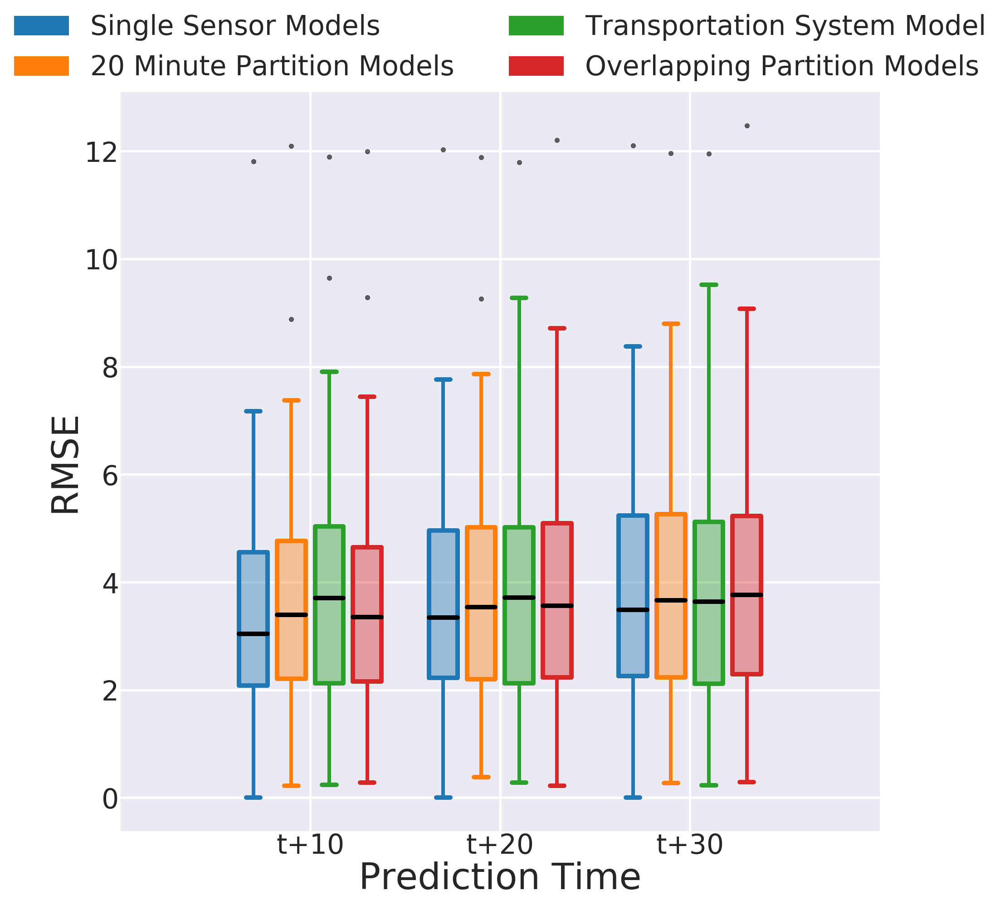

In [231]:
%%local 
single_start =  [ single_start_rmse_df.values[0,0],  single_start_rmse_df.values[0,1],  single_start_rmse_df.values[0,2]]
part20_start = [part20_start_rmse_df.values[0,0], part20_start_rmse_df.values[0,1], part20_start_rmse_df.values[0,2]]
all_start =    [   all_start_rmse_df.values[0,0],    all_start_rmse_df.values[0,1],    all_start_rmse_df.values[0,2]]
o_start = [ overlapping_start_rmse_df.values[0,0], overlapping_start_rmse_df.values[0,1], overlapping_start_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_start, positions=np.array(xrange(len(single_start)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part20_start, positions=np.array(xrange(len(part20_start)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_start,    positions=np.array(xrange(len(all_start)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_start,      positions=np.array(xrange(len(o_start)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='20 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]


plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 20 Minute Partition - Center Group - Box Plot

In [232]:
part20_center_sensors = [s[0] for s in  partitions_20min_df.where(col('group') == 'center').select('identifier').collect()]

In [233]:
part20_center_rmse      = np.array([])
single_center_rmse      = np.array([])
all_center_rmse         = np.array([])
overlapping_center_rmse = np.array([])

if not file_exists(part_20min_path + "center_rmse.npy"):
    part20_center_rmse      = calculate_rmse(part_20min_path, part20_center_sensors)
    write_hdfs_file(part_20min_path + "center_rmse.npy",             part20_center_rmse     )
    
    single_center_rmse      = calculate_rmse(single_sensor_model_path, part20_center_sensors)
    write_hdfs_file(part_20min_path + "single_center_rmse.npy",      single_center_rmse     )
    
    all_center_rmse         = calculate_rmse(all_sensors_model_path, part20_center_sensors)
    write_hdfs_file(part_20min_path + "all_center_rmse.npy",         all_center_rmse        )
    
    overlapping_center_rmse = calculate_rmse(overlapping_path, part20_center_sensors)
    write_hdfs_file(part_20min_path + "overlapping_center_rmse.npy", overlapping_center_rmse)    
else:
    part20_center_rmse      = read_hdfs_file(part_20min_path + "center_rmse.npy"            )
    single_center_rmse      = read_hdfs_file(part_20min_path + "single_center_rmse.npy"     )
    all_center_rmse         = read_hdfs_file(part_20min_path + "all_center_rmse.npy"        )
    overlapping_center_rmse = read_hdfs_file(part_20min_path + "overlapping_center_rmse.npy")

In [234]:
indices = [9, 19, 29]

In [235]:
%%spark -o part20_center_rmse_df
part20_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part20_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [236]:
%%spark -o single_center_rmse_df
single_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [237]:
%%spark -o all_center_rmse_df
all_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [238]:
%%spark -o overlapping_center_rmse_df
overlapping_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

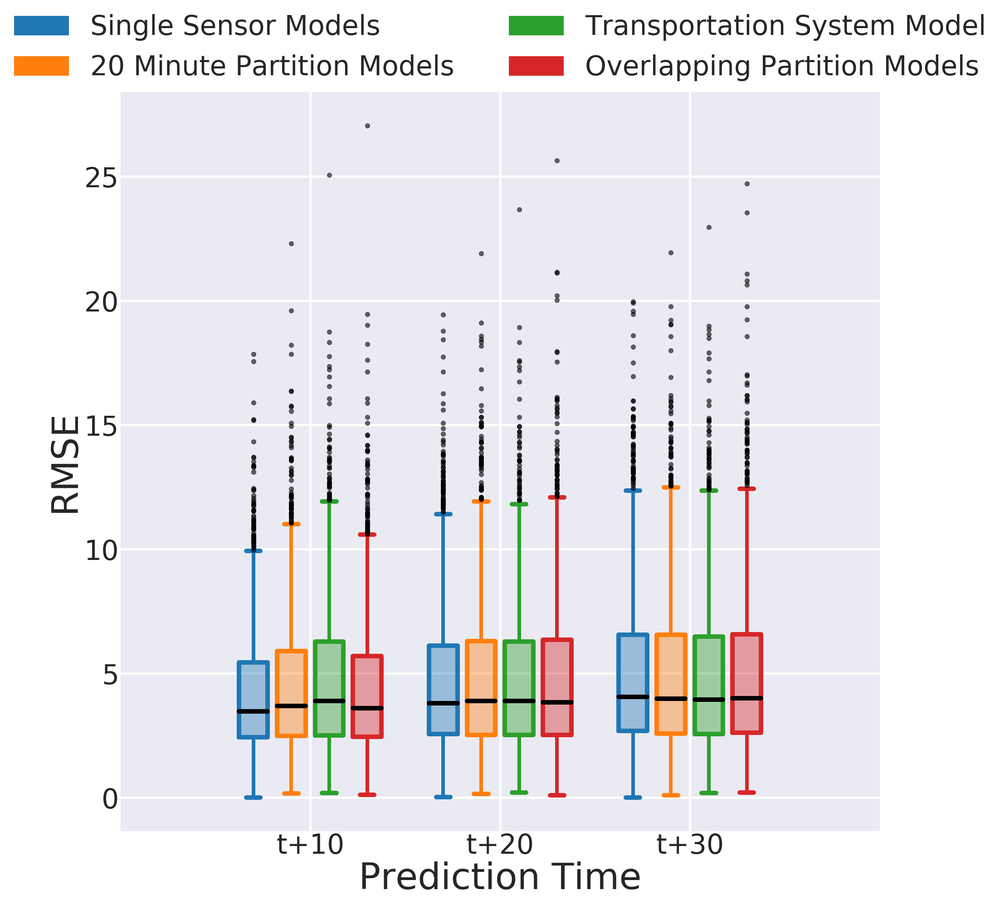

In [239]:
%%local 
single_center = [single_center_rmse_df.values[0,0], single_center_rmse_df.values[0,1], single_center_rmse_df.values[0,2]]
part20_center = [part20_center_rmse_df.values[0,0], part20_center_rmse_df.values[0,1], part20_center_rmse_df.values[0,2]]
all_center =    [all_center_rmse_df.values[0,0],    all_center_rmse_df.values[0,1],    all_center_rmse_df.values[0,2]]
o_center = [overlapping_center_rmse_df.values[0,0], overlapping_center_rmse_df.values[0,1], overlapping_center_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_center, positions=np.array(xrange(len(single_center)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part20_center, positions=np.array(xrange(len(part20_center)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_center,    positions=np.array(xrange(len(all_center)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_center,      positions=np.array(xrange(len(o_center)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='20 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 20 Minute Partition - End Group - Box Plot

In [240]:
part20_end_sensors = [s[0] for s in  partitions_20min_df.where(col('group') == 'end').select('identifier').collect()]

In [241]:
part20_end_rmse      = np.array([])
single_end_rmse      = np.array([])
all_end_rmse         = np.array([])
overlapping_end_rmse = np.array([])

if not file_exists(part_20min_path + "end_rmse.npy"):
    part20_end_rmse      = calculate_rmse(part_20min_path, part20_end_sensors)
    write_hdfs_file(part_20min_path + "end_rmse.npy",             part20_end_rmse     )
    
    single_end_rmse      = calculate_rmse(single_sensor_model_path, part20_end_sensors)
    write_hdfs_file(part_20min_path + "single_end_rmse.npy",      single_end_rmse     )
    
    all_end_rmse         = calculate_rmse(all_sensors_model_path, part20_end_sensors)
    write_hdfs_file(part_20min_path + "all_end_rmse.npy",         all_end_rmse        )
    
    overlapping_end_rmse = calculate_rmse(overlapping_path, part20_end_sensors)
    write_hdfs_file(part_20min_path + "overlapping_end_rmse.npy", overlapping_end_rmse)
else:
    part20_end_rmse      = read_hdfs_file(part_20min_path + "end_rmse.npy"            )
    single_end_rmse      = read_hdfs_file(part_20min_path + "single_end_rmse.npy"     )
    all_end_rmse         = read_hdfs_file(part_20min_path + "all_end_rmse.npy"        )
    overlapping_end_rmse = read_hdfs_file(part_20min_path + "overlapping_end_rmse.npy")

In [242]:
indices = [9, 19, 29]

In [243]:
%%spark -o part20_end_rmse_df
part20_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part20_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [244]:
%%spark -o single_end_rmse_df
single_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [245]:
%%spark -o all_end_rmse_df
all_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [246]:
%%spark -o overlapping_end_rmse_df
overlapping_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

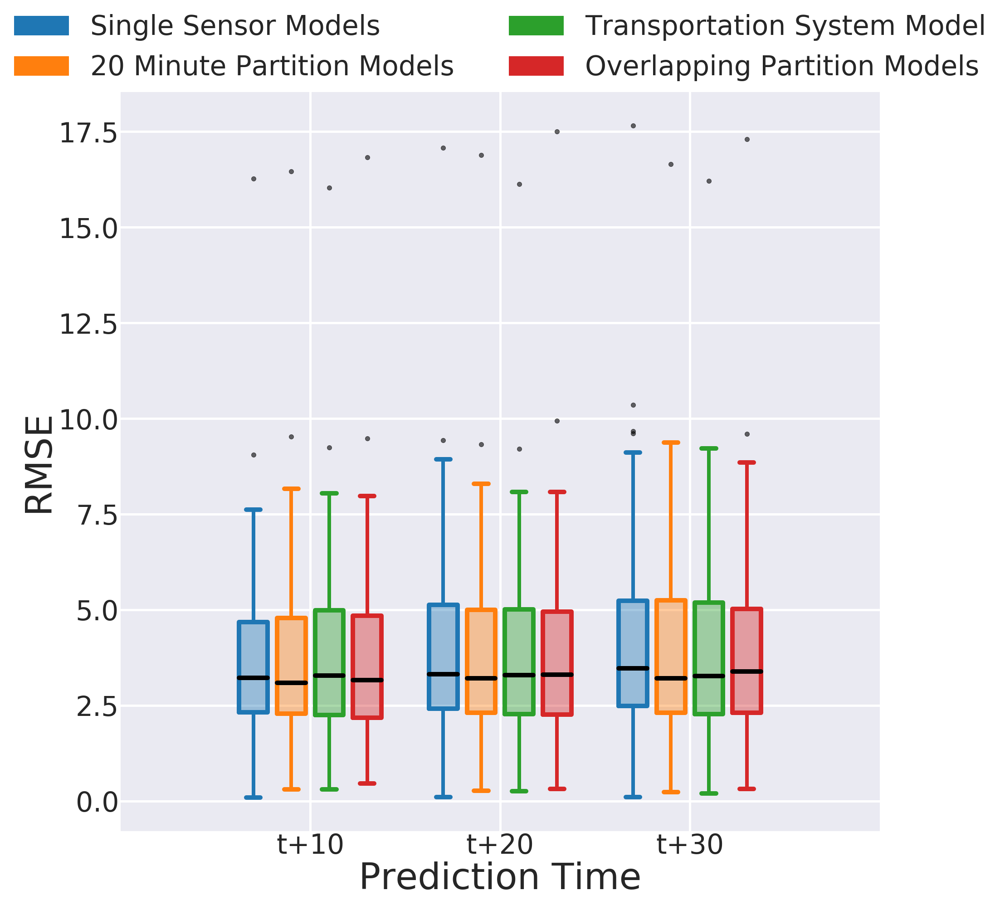

In [247]:
%%local 
single_end = [single_end_rmse_df.values[0,0], single_end_rmse_df.values[0,1], single_end_rmse_df.values[0,2]]
part20_end = [part20_end_rmse_df.values[0,0], part20_end_rmse_df.values[0,1], part20_end_rmse_df.values[0,2]]
all_end =    [all_end_rmse_df.values[0,0],    all_end_rmse_df.values[0,1],    all_end_rmse_df.values[0,2]]
o_end = [overlapping_end_rmse_df.values[0,0], overlapping_end_rmse_df.values[0,1], overlapping_end_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_end, positions=np.array(xrange(len(single_end)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part20_end, positions=np.array(xrange(len(part20_end)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_end,    positions=np.array(xrange(len(all_end)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_end,      positions=np.array(xrange(len(o_end)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='20 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)


axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - Box Plot

In [248]:
sensors = [s[0] for s in partitions_3min_df.select('identifier').collect()]

In [249]:
single_rmse      = np.array([])
part3_rmse       = np.array([])
part5_rmse       = np.array([])
part10_rmse      = np.array([])
part20_rmse      = np.array([])
part30_rmse      = np.array([])
all_rmse         = np.array([])
overlapping_rmse = np.array([])

if not file_exists(single_sensor_model_path + "rmse.npy"):
    single_rmse      = calculate_rmse(single_sensor_model_path, sensors)
    part3_rmse       = calculate_rmse(part_3min_path,           sensors)
    part5_rmse       = calculate_rmse(part_5min_path,           sensors)
    part10_rmse      = calculate_rmse(part_10min_path,          sensors)
    part20_rmse      = calculate_rmse(part_20min_path,          sensors)
    part30_rmse      = calculate_rmse(part_30min_path,          sensors)
    all_rmse         = calculate_rmse(all_sensors_model_path,   sensors)
    overlapping_rmse = calculate_rmse(overlapping_path,         sensors)
    
    write_hdfs_file(single_sensor_model_path + "rmse.npy", single_rmse     )
    write_hdfs_file(part_3min_path + "rmse.npy",           part3_rmse      )
    write_hdfs_file(part_5min_path + "rmse.npy",           part5_rmse      )
    write_hdfs_file(part_10min_path + "rmse.npy",          part10_rmse     )
    write_hdfs_file(part_20min_path + "rmse.npy",          part20_rmse     )
    write_hdfs_file(part_30min_path + "rmse.npy",          part30_rmse     )
    write_hdfs_file(all_sensors_model_path + "rmse.npy",   all_rmse        )
    write_hdfs_file(overlapping_path + "rmse.npy",         overlapping_rmse)
else:
    single_rmse      = read_hdfs_file(single_sensor_model_path + "rmse.npy")
    part3_rmse       = read_hdfs_file(part_3min_path + "rmse.npy"          )
    part5_rmse       = read_hdfs_file(part_5min_path + "rmse.npy"          )
    part10_rmse      = read_hdfs_file(part_10min_path + "rmse.npy"         )
    part20_rmse      = read_hdfs_file(part_20min_path + "rmse.npy"         )
    part30_rmse      = read_hdfs_file(part_30min_path + "rmse.npy"         )
    all_rmse         = read_hdfs_file(all_sensors_model_path + "rmse.npy"  )
    overlapping_rmse = read_hdfs_file(overlapping_path + "rmse.npy"        )

In [250]:
indices = [9, 19, 29]

In [251]:
%%spark -o single_rmse_df
single_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [252]:
%%spark -o part3_rmse_df
part3_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part3_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [253]:
%%spark -o part5_rmse_df
part5_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part5_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [254]:
%%spark -o part10_rmse_df
part10_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part10_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [255]:
%%spark -o part20_rmse_df
part20_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part20_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [256]:
%%spark -o part30_rmse_df
part30_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part30_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [257]:
%%spark -o all_rmse_df
all_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [258]:
%%spark -o overlapping_rmse_df
overlapping_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

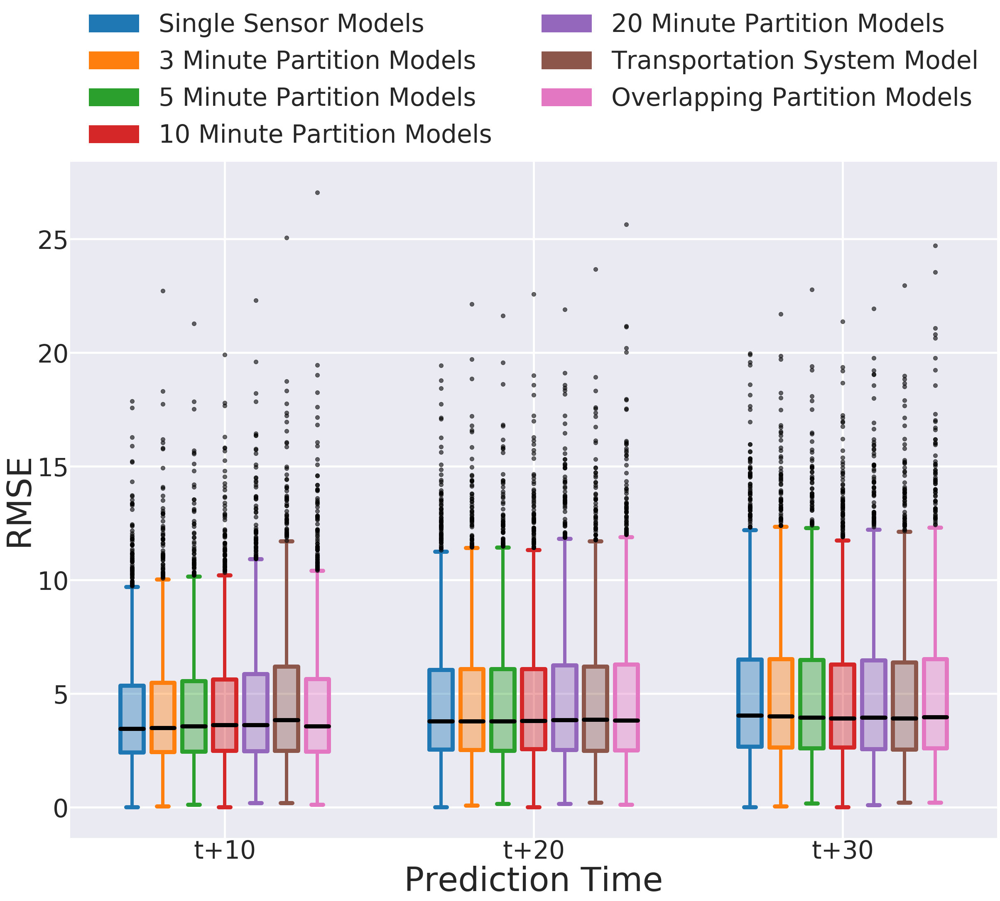

In [376]:
%%local 
single_rmse      = [single_rmse_df.values[0,0], single_rmse_df.values[0,1], single_rmse_df.values[0,2]]
part3_rmse       = [part3_rmse_df.values[0,0], part3_rmse_df.values[0,1], part3_rmse_df.values[0,2]]
part5_rmse       = [part5_rmse_df.values[0,0], part5_rmse_df.values[0,1], part5_rmse_df.values[0,2]]
part10_rmse      = [part10_rmse_df.values[0,0], part10_rmse_df.values[0,1], part10_rmse_df.values[0,2]]
part20_rmse      = [part20_rmse_df.values[0,0], part20_rmse_df.values[0,1], part20_rmse_df.values[0,2]]
part0_rmse      = [part30_rmse_df.values[0,0], part30_rmse_df.values[0,1], part30_rmse_df.values[0,2]]
all_rmse         = [all_rmse_df.values[0,0], all_rmse_df.values[0,1], all_rmse_df.values[0,2]]
overlapping_rmse = [overlapping_rmse_df.values[0,0], overlapping_rmse_df.values[0,1], overlapping_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(40, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_rmse     , positions=np.array(xrange(len(single_rmse     )))*8.0-2.4, widths=0.6, sym="k.")
bp2 = plt.boxplot(part3_rmse      , positions=np.array(xrange(len(part3_rmse      )))*8.0-1.6, widths=0.6, sym="k.")
bp3 = plt.boxplot(part5_rmse      , positions=np.array(xrange(len(part5_rmse      )))*8.0-0.8, widths=0.6, sym="k.")
bp4 = plt.boxplot(part10_rmse     , positions=np.array(xrange(len(part10_rmse     )))*8.0,  widths=0.6, sym="k.")
bp5 = plt.boxplot(part20_rmse     , positions=np.array(xrange(len(part20_rmse     )))*8.0+0.8,  widths=0.6, sym="k.")
bp7 = plt.boxplot(all_rmse        , positions=np.array(xrange(len(all_rmse        )))*8.0+1.6, widths=0.6, sym="k.")
bp8 = plt.boxplot(overlapping_rmse, positions=np.array(xrange(len(overlapping_rmse)))*8.0+2.4, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])
set_box_color(bp5, colors[4])
set_box_color(bp7, colors[5])
set_box_color(bp8, colors[6])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='3 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='5 Minute Partition Models'),
    mpatches.Patch(color=colors[3], label='10 Minute Partition Models'),
    mpatches.Patch(color=colors[4], label='20 Minute Partition Models'),
    mpatches.Patch(color=colors[5], label='Transportation System Model'),
    mpatches.Patch(color=colors[6], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.12), 
    ncol=2,
    borderaxespad=5
)
plt.grid(linewidth=5)

plt.xticks(xrange(0, len(ticks) * 8, 8), ticks)
plt.xlim(-4, 20)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 10 Minute Partition - Start Group - Box Plot

In [261]:
part10_start_sensors =  [s[0] for s in  partitions_10min_df.where(col('group') == 'start').select('identifier').collect()]

In [262]:
part10_start_rmse      = np.array([])
single_start_rmse      = np.array([])
all_start_rmse         = np.array([])
overlapping_start_rmse = np.array([])

if not file_exists(part_10min_path + "start_rmse.npy"):
    part10_start_rmse      = calculate_rmse(part_10min_path, part10_start_sensors)
    write_hdfs_file(part_10min_path + "start_rmse.npy",             part10_start_rmse     )
    
    single_start_rmse      = calculate_rmse(single_sensor_model_path, part10_start_sensors)
    write_hdfs_file(part_10min_path + "single_start_rmse.npy",      single_start_rmse     )
    
    all_start_rmse         = calculate_rmse(all_sensors_model_path, part10_start_sensors)
    write_hdfs_file(part_10min_path + "all_start_rmse.npy",         all_start_rmse        )
    
    overlapping_start_rmse = calculate_rmse(overlapping_path, part10_start_sensors)
    write_hdfs_file(part_10min_path + "overlapping_start_rmse.npy", overlapping_start_rmse)
else:
    part10_start_rmse      = read_hdfs_file(part_10min_path + "start_rmse.npy"            )
    single_start_rmse      = read_hdfs_file(part_10min_path + "single_start_rmse.npy"     )
    all_start_rmse         = read_hdfs_file(part_10min_path + "all_start_rmse.npy"        )
    overlapping_start_rmse = read_hdfs_file(part_10min_path + "overlapping_start_rmse.npy")

In [263]:
indices = [9, 19, 29]

In [264]:
%%spark -o part10_start_rmse_df
part10_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part10_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [265]:
%%spark -o single_start_rmse_df
single_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [266]:
%%spark -o all_start_rmse_df
all_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [267]:
%%spark -o overlapping_start_rmse_df
overlapping_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

(-4, 12)

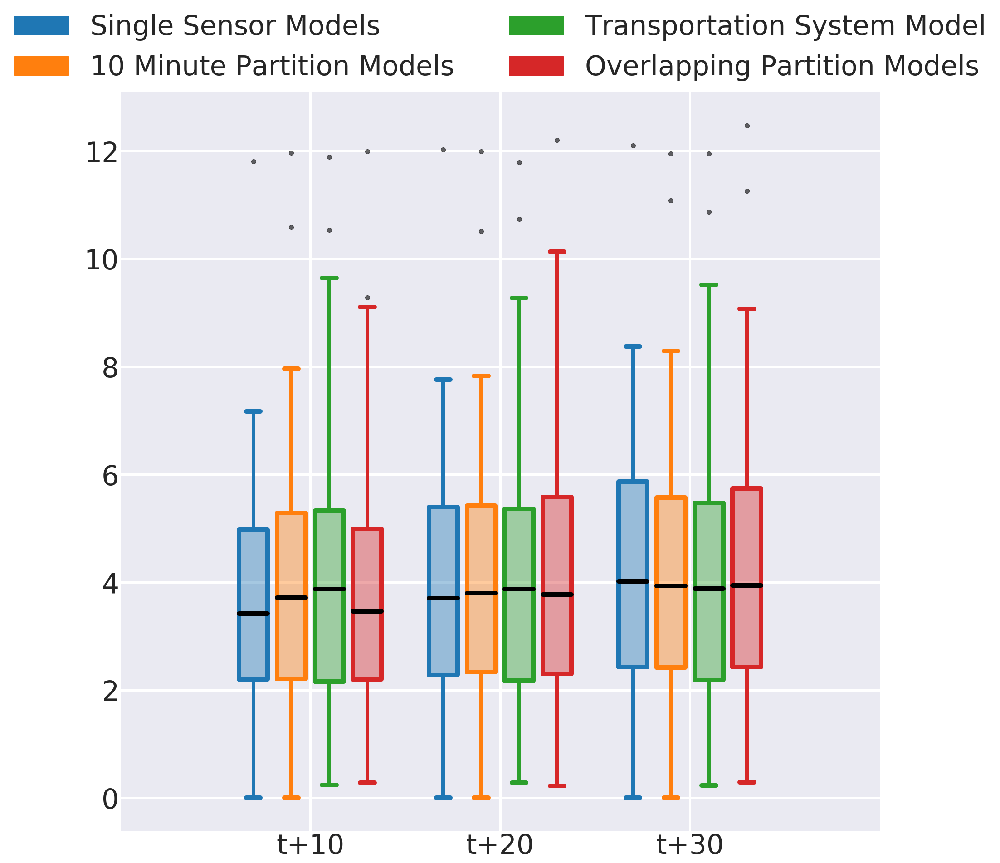

In [268]:
%%local 
single_start =  [ single_start_rmse_df.values[0,0],  single_start_rmse_df.values[0,1],  single_start_rmse_df.values[0,2]]
part10_start = [part10_start_rmse_df.values[0,0], part10_start_rmse_df.values[0,1], part10_start_rmse_df.values[0,2]]
all_start =    [   all_start_rmse_df.values[0,0],    all_start_rmse_df.values[0,1],    all_start_rmse_df.values[0,2]]
o_start = [ overlapping_start_rmse_df.values[0,0], overlapping_start_rmse_df.values[0,1], overlapping_start_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_start, positions=np.array(xrange(len(single_start)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part10_start, positions=np.array(xrange(len(part10_start)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_start,    positions=np.array(xrange(len(all_start)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_start,      positions=np.array(xrange(len(o_start)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='10 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]


plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

## Model RMSE Comparison - 10 Minute Partition - Center Group - Box Plot

In [269]:
part10_center_sensors = [s[0] for s in  partitions_10min_df.where(col('group') == 'center').select('identifier').collect()]
indices = [9, 19, 29]

In [270]:
part10_center_rmse      = np.array([])
single_center_rmse      = np.array([])
all_center_rmse         = np.array([])
overlapping_center_rmse = np.array([])

if not file_exists(part_10min_path + "center_rmse.npy"):
    part10_center_rmse      = calculate_rmse(part_10min_path, part10_center_sensors)
    write_hdfs_file(part_10min_path + "center_rmse.npy",             part10_center_rmse     )
    
    single_center_rmse      = calculate_rmse(single_sensor_model_path, part10_center_sensors)
    write_hdfs_file(part_10min_path + "single_center_rmse.npy",      single_center_rmse     )
    
    all_center_rmse         = calculate_rmse(all_sensors_model_path, part10_center_sensors)
    write_hdfs_file(part_10min_path + "all_center_rmse.npy",         all_center_rmse        )
    
    overlapping_center_rmse = calculate_rmse(overlapping_path, part10_center_sensors)
    write_hdfs_file(part_10min_path + "overlapping_center_rmse.npy", overlapping_center_rmse)
else:
    part10_center_rmse      = read_hdfs_file(part_10min_path + "center_rmse.npy"            )
    single_center_rmse      = read_hdfs_file(part_10min_path + "single_center_rmse.npy"     )
    all_center_rmse         = read_hdfs_file(part_10min_path + "all_center_rmse.npy"        )
    overlapping_center_rmse = read_hdfs_file(part_10min_path + "overlapping_center_rmse.npy")

In [271]:
%%spark -o part10_center_rmse_df
part10_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part10_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [272]:
%%spark -o single_center_rmse_df
single_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [273]:
%%spark -o all_center_rmse_df
all_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [274]:
%%spark -o overlapping_center_rmse_df
overlapping_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

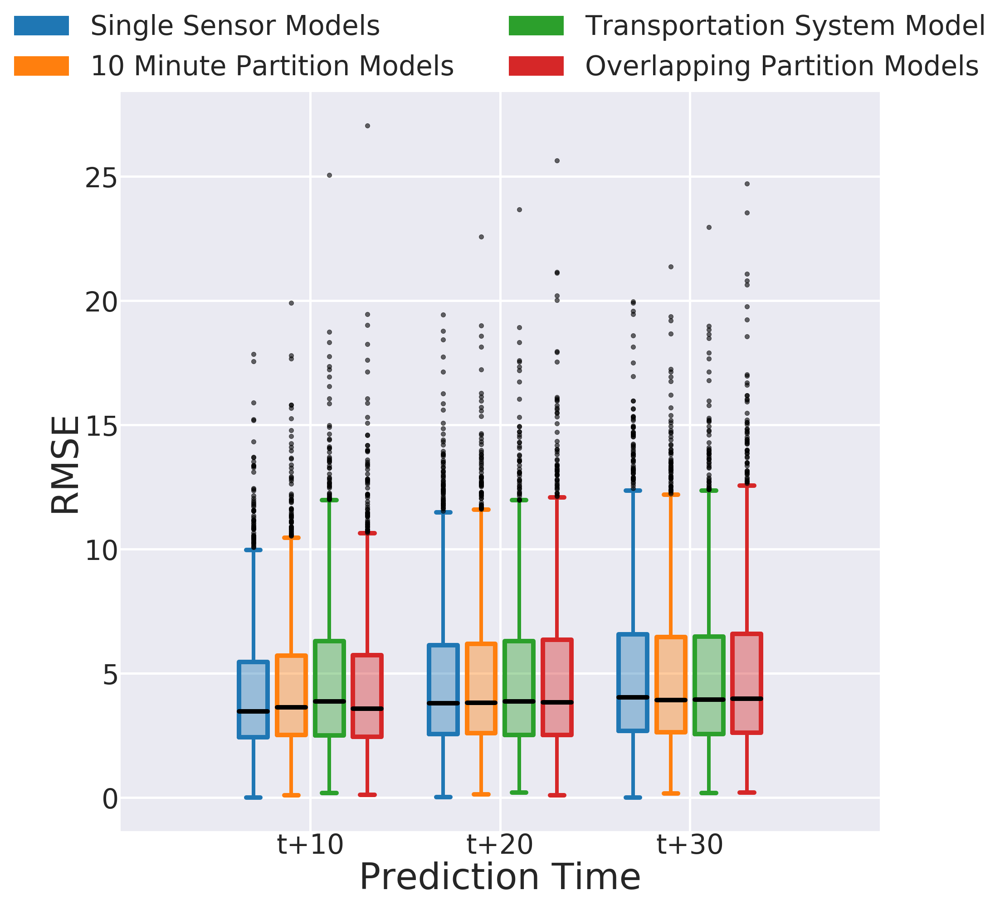

In [275]:
%%local 
single_center = [single_center_rmse_df.values[0,0], single_center_rmse_df.values[0,1], single_center_rmse_df.values[0,2]]
part10_center = [part10_center_rmse_df.values[0,0], part10_center_rmse_df.values[0,1], part10_center_rmse_df.values[0,2]]
all_center =    [all_center_rmse_df.values[0,0],    all_center_rmse_df.values[0,1],    all_center_rmse_df.values[0,2]]
o_center = [overlapping_center_rmse_df.values[0,0], overlapping_center_rmse_df.values[0,1], overlapping_center_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_center, positions=np.array(xrange(len(single_center)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part10_center, positions=np.array(xrange(len(part10_center)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_center,    positions=np.array(xrange(len(all_center)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_center,      positions=np.array(xrange(len(o_center)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='10 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 10 Minute Partition - End Group - Box Plot

In [276]:
part10_end_sensors = [s[0] for s in  partitions_10min_df.where(col('group') == 'end').select('identifier').collect()]
indices = [9, 19, 29]

In [277]:
part10_end_rmse      = np.array([])
single_end_rmse      = np.array([])
all_end_rmse         = np.array([])
overlapping_end_rmse = np.array([])

if not file_exists(part_10min_path + "end_rmse.npy"):
    part10_end_rmse      = calculate_rmse(part_10min_path, part10_end_sensors)
    write_hdfs_file(part_10min_path + "end_rmse.npy",             part10_end_rmse     )
    
    single_end_rmse      = calculate_rmse(single_sensor_model_path, part10_end_sensors)
    write_hdfs_file(part_10min_path + "single_end_rmse.npy",      single_end_rmse     )
    
    all_end_rmse         = calculate_rmse(all_sensors_model_path, part10_end_sensors)
    write_hdfs_file(part_10min_path + "all_end_rmse.npy",         all_end_rmse        )

        
    overlapping_end_rmse = calculate_rmse(overlapping_path, part10_end_sensors)
    write_hdfs_file(part_10min_path + "overlapping_end_rmse.npy", overlapping_end_rmse)
else:
    part10_end_rmse      = read_hdfs_file(part_10min_path + "end_rmse.npy"            )
    single_end_rmse      = read_hdfs_file(part_10min_path + "single_end_rmse.npy"     )
    all_end_rmse         = read_hdfs_file(part_10min_path + "all_end_rmse.npy"        )
    overlapping_end_rmse = read_hdfs_file(part_10min_path + "overlapping_end_rmse.npy")

In [278]:
%%spark -o part10_end_rmse_df
part10_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part10_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [279]:
%%spark -o single_end_rmse_df
single_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [280]:
%%spark -o all_end_rmse_df
all_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [281]:
%%spark -o overlapping_end_rmse_df
overlapping_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

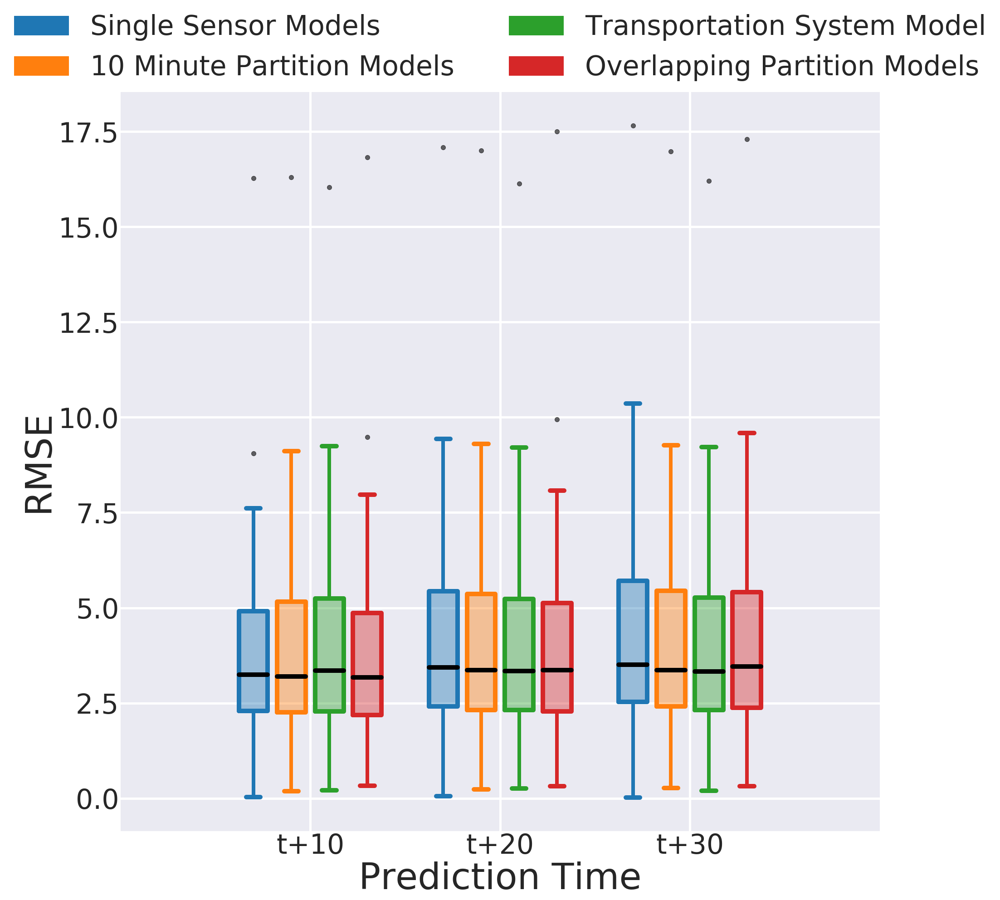

In [282]:
%%local 
single_end = [single_end_rmse_df.values[0,0], single_end_rmse_df.values[0,1], single_end_rmse_df.values[0,2]]
part10_end = [part10_end_rmse_df.values[0,0], part10_end_rmse_df.values[0,1], part10_end_rmse_df.values[0,2]]
all_end =    [all_end_rmse_df.values[0,0],    all_end_rmse_df.values[0,1],    all_end_rmse_df.values[0,2]]
o_end = [overlapping_end_rmse_df.values[0,0], overlapping_end_rmse_df.values[0,1], overlapping_end_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_end, positions=np.array(xrange(len(single_end)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part10_end, positions=np.array(xrange(len(part10_end)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_end,    positions=np.array(xrange(len(all_end)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_end,      positions=np.array(xrange(len(o_end)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='10 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 5 Minute Partition - Start Group - Box Plot

In [283]:
part5_start_sensors =  [s[0] for s in  partitions_5min_df.where(col('group') == 'start').select('identifier').collect()]
indices = [9, 19, 29]

In [284]:
part5_start_rmse      = np.array([])
single_start_rmse      = np.array([])
all_start_rmse         = np.array([])
overlapping_start_rmse = np.array([])

if not file_exists(part_5min_path + "start_rmse.npy"):
    part5_start_rmse      = calculate_rmse(part_5min_path, part5_start_sensors)
    write_hdfs_file(part_5min_path + "start_rmse.npy",             part5_start_rmse     )
    
    single_start_rmse      = calculate_rmse(single_sensor_model_path, part5_start_sensors)
    write_hdfs_file(part_5min_path + "single_start_rmse.npy",      single_start_rmse     )

        
    all_start_rmse         = calculate_rmse(all_sensors_model_path, part5_start_sensors)
    write_hdfs_file(part_5min_path + "all_start_rmse.npy",         all_start_rmse        )
    
    overlapping_start_rmse = calculate_rmse(overlapping_path, part5_start_sensors)
    write_hdfs_file(part_5min_path + "overlapping_start_rmse.npy", overlapping_start_rmse)
else:
    part5_start_rmse      = read_hdfs_file(part_5min_path + "start_rmse.npy"            )
    single_start_rmse      = read_hdfs_file(part_5min_path + "single_start_rmse.npy"     )
    all_start_rmse         = read_hdfs_file(part_5min_path + "all_start_rmse.npy"        )
    overlapping_start_rmse = read_hdfs_file(part_5min_path + "overlapping_start_rmse.npy")

In [285]:
%%spark -o part5_start_rmse_df
part5_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part5_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [286]:
%%spark -o single_start_rmse_df
single_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [287]:
%%spark -o all_start_rmse_df
all_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [288]:
%%spark -o overlapping_start_rmse_df
overlapping_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

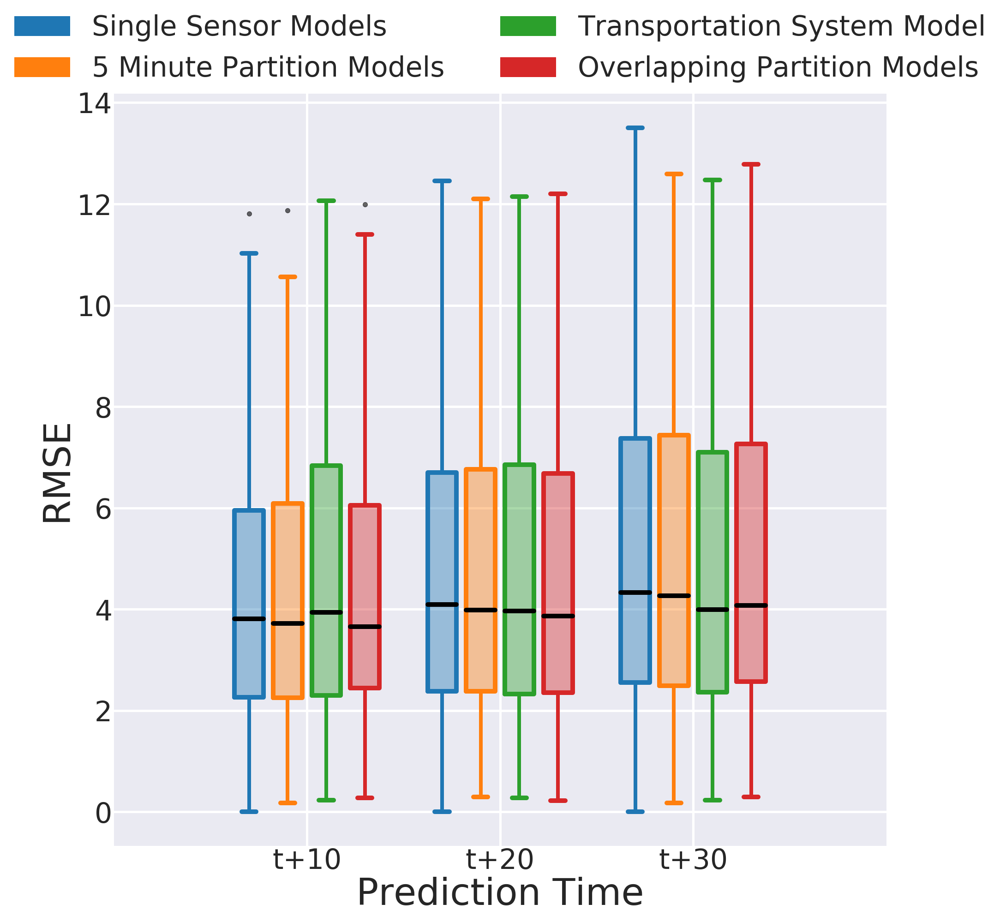

In [289]:
%%local 
single_start =  [ single_start_rmse_df.values[0,0],  single_start_rmse_df.values[0,1],  single_start_rmse_df.values[0,2]]
part5_start = [part5_start_rmse_df.values[0,0], part5_start_rmse_df.values[0,1], part5_start_rmse_df.values[0,2]]
all_start =    [   all_start_rmse_df.values[0,0],    all_start_rmse_df.values[0,1],    all_start_rmse_df.values[0,2]]
o_start = [ overlapping_start_rmse_df.values[0,0], overlapping_start_rmse_df.values[0,1], overlapping_start_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_start, positions=np.array(xrange(len(single_start)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part5_start, positions=np.array(xrange(len(part5_start)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_start,    positions=np.array(xrange(len(all_start)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_start,      positions=np.array(xrange(len(o_start)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='5 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]


plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 5 Minute Partition - Center Group - Box Plot

In [290]:
part5_center_sensors = [s[0] for s in  partitions_5min_df.where(col('group') == 'center').select('identifier').collect()]
indices = [9, 19, 29]

In [291]:
part5_center_rmse      = np.array([])
single_center_rmse      = np.array([])
all_center_rmse         = np.array([])
overlapping_center_rmse = np.array([])

if not file_exists(part_5min_path + "center_rmse.npy"):
    part5_center_rmse      = calculate_rmse(part_5min_path, part5_center_sensors)           
    write_hdfs_file(part_5min_path + "center_rmse.npy",             part5_center_rmse     )
    
    single_center_rmse      = calculate_rmse(single_sensor_model_path, part5_center_sensors)
    write_hdfs_file(part_5min_path + "single_center_rmse.npy",      single_center_rmse     )
    
    all_center_rmse         = calculate_rmse(all_sensors_model_path, part5_center_sensors)
    write_hdfs_file(part_5min_path + "all_center_rmse.npy",         all_center_rmse        )
    
    overlapping_center_rmse = calculate_rmse(overlapping_path, part5_center_sensors)
    write_hdfs_file(part_5min_path + "overlapping_center_rmse.npy", overlapping_center_rmse)
else:
    part5_center_rmse       = read_hdfs_file(part_5min_path + "center_rmse.npy"            )
    single_center_rmse      = read_hdfs_file(part_5min_path + "single_center_rmse.npy"     )
    all_center_rmse         = read_hdfs_file(part_5min_path + "all_center_rmse.npy"        )
    overlapping_center_rmse = read_hdfs_file(part_5min_path + "overlapping_center_rmse.npy")

In [292]:
%%spark -o part5_center_rmse_df
part5_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part5_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [293]:
%%spark -o single_center_rmse_df
single_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [294]:
%%spark -o all_center_rmse_df
all_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [295]:
%%spark -o overlapping_center_rmse_df
overlapping_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

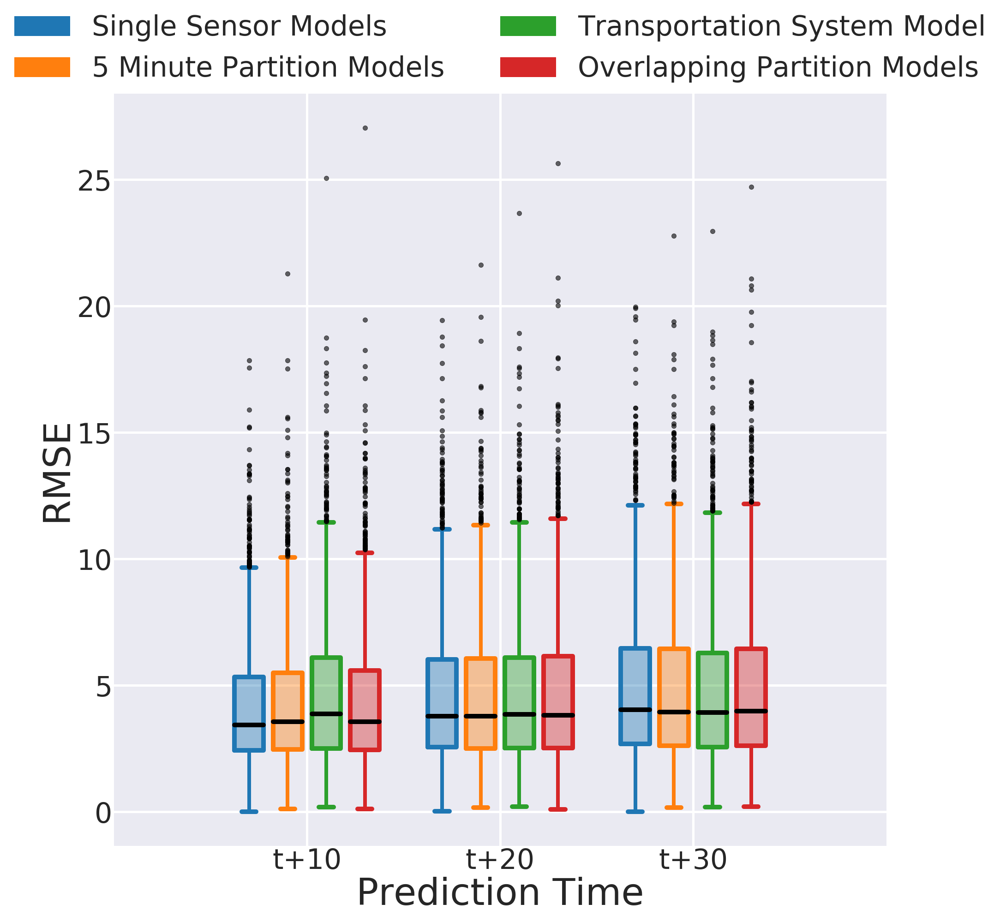

In [296]:
%%local 
single_center = [single_center_rmse_df.values[0,0], single_center_rmse_df.values[0,1], single_center_rmse_df.values[0,2]]
part5_center = [part5_center_rmse_df.values[0,0], part5_center_rmse_df.values[0,1], part5_center_rmse_df.values[0,2]]
all_center =    [all_center_rmse_df.values[0,0],    all_center_rmse_df.values[0,1],    all_center_rmse_df.values[0,2]]
o_center = [overlapping_center_rmse_df.values[0,0], overlapping_center_rmse_df.values[0,1], overlapping_center_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_center, positions=np.array(xrange(len(single_center)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part5_center, positions=np.array(xrange(len(part5_center)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_center,    positions=np.array(xrange(len(all_center)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_center,      positions=np.array(xrange(len(o_center)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='5 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 5 Minute Partition - End Group - Box Plot

In [297]:
part5_end_sensors = [s[0] for s in  partitions_5min_df.where(col('group') == 'end').select('identifier').collect()]
indices = [9, 19, 29]

In [298]:
part5_end_rmse      = np.array([])
single_end_rmse      = np.array([])
all_end_rmse         = np.array([])
overlapping_end_rmse = np.array([])

if not file_exists(part_5min_path + "end_rmse.npy"):
    part5_end_rmse      = calculate_rmse(part_5min_path, part5_end_sensors)           
    write_hdfs_file(part_5min_path + "end_rmse.npy",             part5_end_rmse     )
    
    single_end_rmse      = calculate_rmse(single_sensor_model_path, part5_end_sensors)
    write_hdfs_file(part_5min_path + "single_end_rmse.npy",      single_end_rmse     )
    
    all_end_rmse         = calculate_rmse(all_sensors_model_path, part5_end_sensors)
    write_hdfs_file(part_5min_path + "all_end_rmse.npy",         all_end_rmse        )
    
    overlapping_end_rmse = calculate_rmse(overlapping_path, part5_end_sensors)
    write_hdfs_file(part_5min_path + "overlapping_end_rmse.npy", overlapping_end_rmse)    
else:
    part5_end_rmse      = read_hdfs_file(part_5min_path + "end_rmse.npy"            )
    single_end_rmse      = read_hdfs_file(part_5min_path + "single_end_rmse.npy"     )
    all_end_rmse         = read_hdfs_file(part_5min_path + "all_end_rmse.npy"        )
    overlapping_end_rmse = read_hdfs_file(part_5min_path + "overlapping_end_rmse.npy")

In [299]:
%%spark -o part5_end_rmse_df
part5_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part5_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [300]:
%%spark -o single_end_rmse_df
single_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [301]:
%%spark -o all_end_rmse_df
all_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [302]:
%%spark -o overlapping_end_rmse_df
overlapping_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

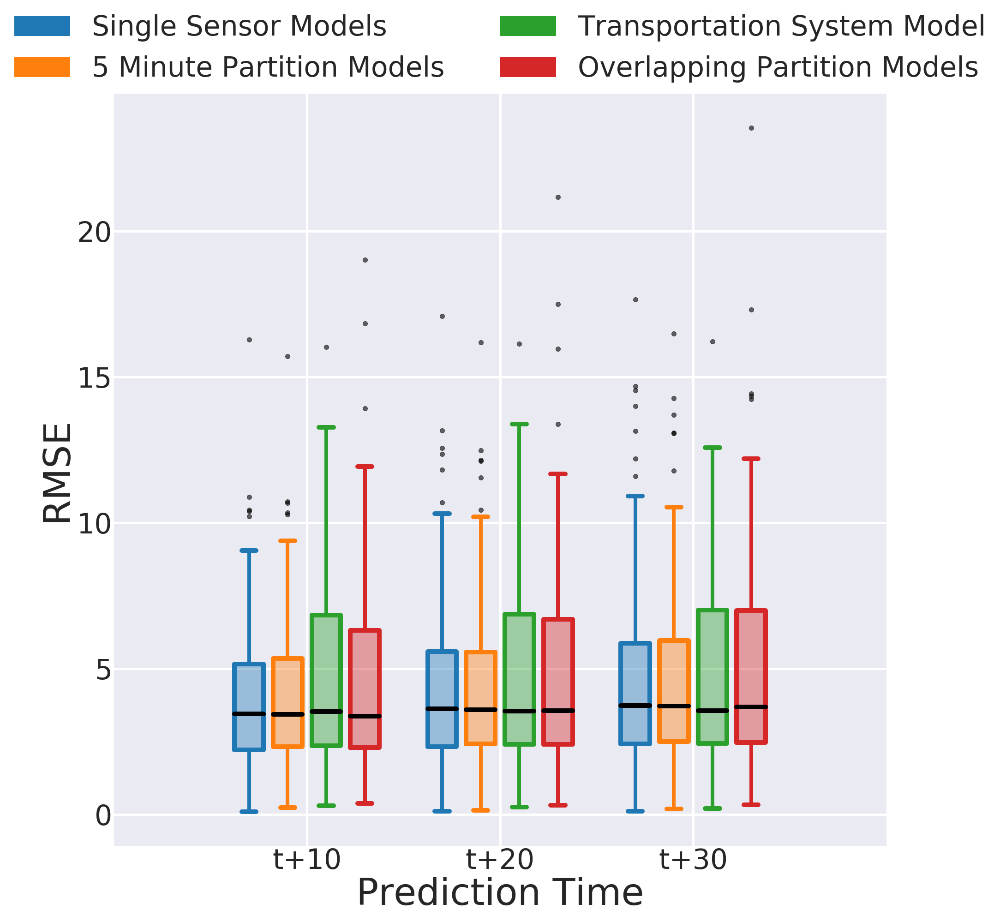

In [303]:
%%local 
single_end = [single_end_rmse_df.values[0,0], single_end_rmse_df.values[0,1], single_end_rmse_df.values[0,2]]
part5_end = [part5_end_rmse_df.values[0,0], part5_end_rmse_df.values[0,1], part5_end_rmse_df.values[0,2]]
all_end =    [all_end_rmse_df.values[0,0],    all_end_rmse_df.values[0,1],    all_end_rmse_df.values[0,2]]
o_end = [overlapping_end_rmse_df.values[0,0], overlapping_end_rmse_df.values[0,1], overlapping_end_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_end, positions=np.array(xrange(len(single_end)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part5_end, positions=np.array(xrange(len(part5_end)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_end,    positions=np.array(xrange(len(all_end)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_end,      positions=np.array(xrange(len(o_end)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='5 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 3 Minute Partition - Start Group - Box Plot

In [304]:
part3_start_sensors =  [s[0] for s in  partitions_3min_df.where(col('group') == 'start').select('identifier').collect()]
indices = [9, 19, 29]

In [305]:
part3_start_rmse      = np.array([])
single_start_rmse      = np.array([])
all_start_rmse         = np.array([])
overlapping_start_rmse = np.array([])

if not file_exists(part_3min_path + "start_rmse.npy"):
    part3_start_rmse      = calculate_rmse(part_3min_path, part3_start_sensors)           
    write_hdfs_file(part_3min_path + "start_rmse.npy",             part3_start_rmse     )
    
    single_start_rmse      = calculate_rmse(single_sensor_model_path, part3_start_sensors)
    write_hdfs_file(part_3min_path + "single_start_rmse.npy",      single_start_rmse     )
    
    all_start_rmse         = calculate_rmse(all_sensors_model_path, part3_start_sensors)
    write_hdfs_file(part_3min_path + "all_start_rmse.npy",         all_start_rmse        )
    
    overlapping_start_rmse = calculate_rmse(overlapping_path, part3_start_sensors)
    write_hdfs_file(part_3min_path + "overlapping_start_rmse.npy", overlapping_start_rmse)   
else:
    part3_start_rmse       = read_hdfs_file(part_3min_path + "start_rmse.npy"            )
    single_start_rmse      = read_hdfs_file(part_3min_path + "single_start_rmse.npy"     )
    all_start_rmse         = read_hdfs_file(part_3min_path + "all_start_rmse.npy"        )
    overlapping_start_rmse = read_hdfs_file(part_3min_path + "overlapping_start_rmse.npy")

In [306]:
%%spark -o part3_start_rmse_df
part3_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part3_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [307]:
%%spark -o single_start_rmse_df
single_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [308]:
%%spark -o all_start_rmse_df
all_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [309]:
%%spark -o overlapping_start_rmse_df
overlapping_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

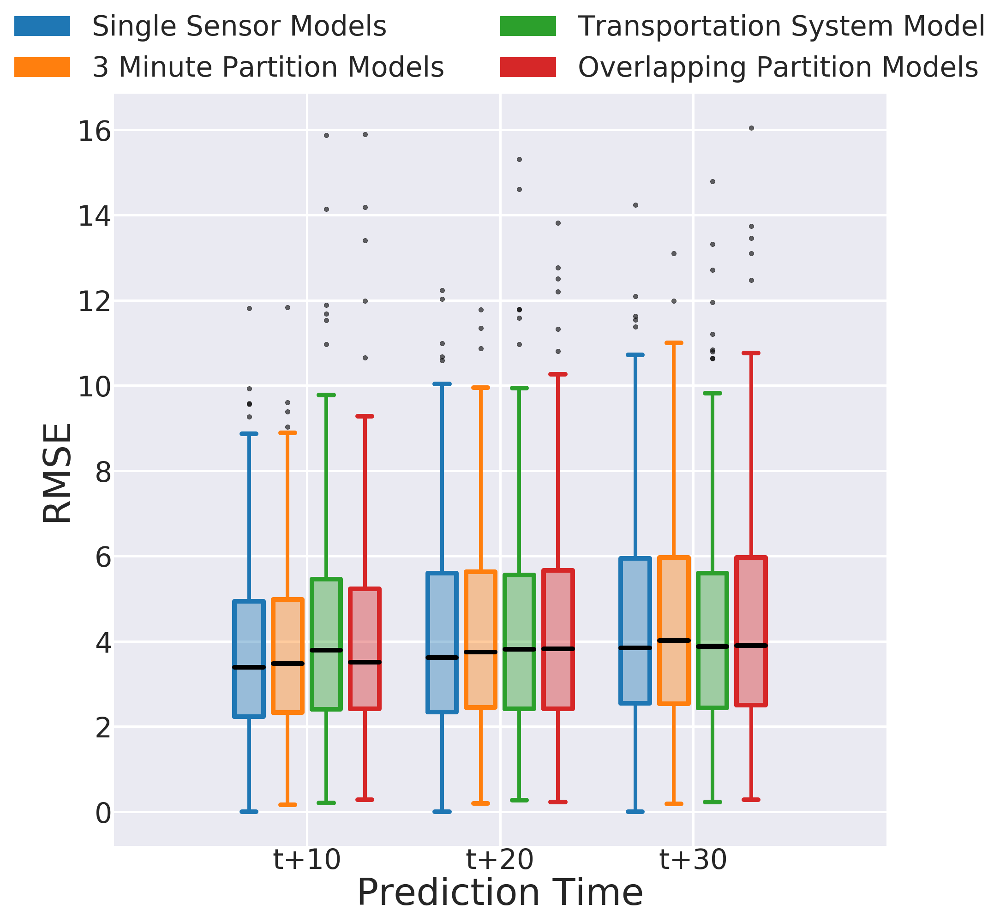

In [310]:
%%local 
single_start =  [ single_start_rmse_df.values[0,0],  single_start_rmse_df.values[0,1],  single_start_rmse_df.values[0,2]]
part3_start = [part3_start_rmse_df.values[0,0], part3_start_rmse_df.values[0,1], part3_start_rmse_df.values[0,2]]
all_start =    [   all_start_rmse_df.values[0,0],    all_start_rmse_df.values[0,1],    all_start_rmse_df.values[0,2]]
o_start = [ overlapping_start_rmse_df.values[0,0], overlapping_start_rmse_df.values[0,1], overlapping_start_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_start, positions=np.array(xrange(len(single_start)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part3_start, positions=np.array(xrange(len(part3_start)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_start,    positions=np.array(xrange(len(all_start)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_start,      positions=np.array(xrange(len(o_start)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='3 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]


plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 3 Minute Partition - Center Group - Box Plot

In [311]:
part3_center_sensors = [s[0] for s in  partitions_3min_df.where(col('group') == 'center').select('identifier').collect()]
indices = [9, 19, 29]

In [312]:
part3_center_rmse      = np.array([])
single_center_rmse      = np.array([])
all_center_rmse         = np.array([])
overlapping_center_rmse = np.array([])

if not file_exists(part_3min_path + "center_rmse.npy"):
    part3_center_rmse      = calculate_rmse(part_3min_path, part3_center_sensors)           
    write_hdfs_file(part_3min_path + "center_rmse.npy",             part3_center_rmse     )    
    
    single_center_rmse      = calculate_rmse(single_sensor_model_path, part3_center_sensors)
    write_hdfs_file(part_3min_path + "single_center_rmse.npy",      single_center_rmse     ) 
    
    all_center_rmse         = calculate_rmse(all_sensors_model_path, part3_center_sensors)  
    write_hdfs_file(part_3min_path + "all_center_rmse.npy",         all_center_rmse        )    
    
    overlapping_center_rmse = calculate_rmse(overlapping_path, part3_center_sensors)        
    write_hdfs_file(part_3min_path + "overlapping_center_rmse.npy", overlapping_center_rmse)        
else:
    part3_center_rmse       = read_hdfs_file(part_3min_path + "center_rmse.npy"            )
    single_center_rmse      = read_hdfs_file(part_3min_path + "single_center_rmse.npy"     )
    all_center_rmse         = read_hdfs_file(part_3min_path + "all_center_rmse.npy"        )
    overlapping_center_rmse = read_hdfs_file(part_3min_path + "overlapping_center_rmse.npy")

In [313]:
%%spark -o part3_center_rmse_df
part3_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part3_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [314]:
%%spark -o single_center_rmse_df
single_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [315]:
%%spark -o all_center_rmse_df
all_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [316]:
%%spark -o overlapping_center_rmse_df
overlapping_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

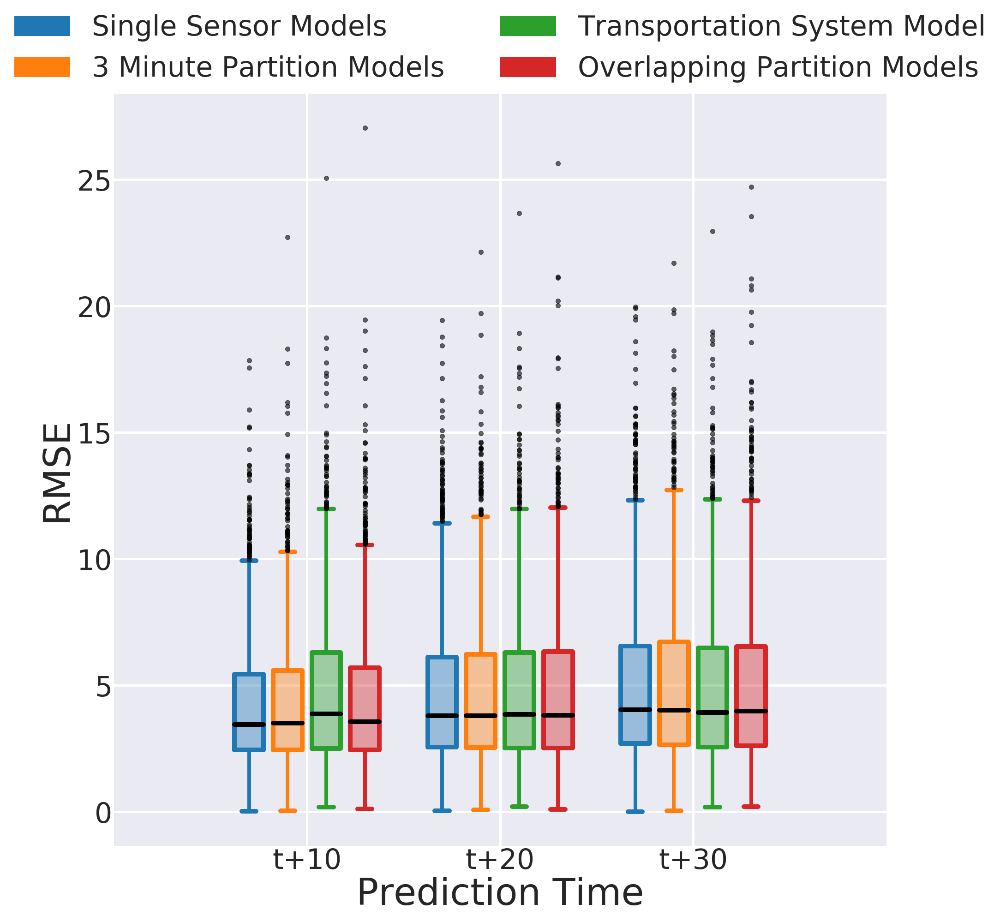

In [317]:
%%local 
single_center = [single_center_rmse_df.values[0,0], single_center_rmse_df.values[0,1], single_center_rmse_df.values[0,2]]
part3_center = [part3_center_rmse_df.values[0,0], part3_center_rmse_df.values[0,1], part3_center_rmse_df.values[0,2]]
all_center =    [all_center_rmse_df.values[0,0],    all_center_rmse_df.values[0,1],    all_center_rmse_df.values[0,2]]
o_center = [overlapping_center_rmse_df.values[0,0], overlapping_center_rmse_df.values[0,1], overlapping_center_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_center, positions=np.array(xrange(len(single_center)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part3_center, positions=np.array(xrange(len(part3_center)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_center,    positions=np.array(xrange(len(all_center)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_center,      positions=np.array(xrange(len(o_center)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='3 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 3 Minute Partition - End Group - Box Plot

In [318]:
part3_end_sensors = [s[0] for s in  partitions_3min_df.where(col('group') == 'end').select('identifier').collect()]
indices = [9, 19, 29]

In [319]:
part3_end_rmse      = np.array([])
single_end_rmse      = np.array([])
all_end_rmse         = np.array([])
overlapping_end_rmse = np.array([])

if not file_exists(part_3min_path + "end_rmse.npy"):
    part3_end_rmse      = calculate_rmse(part_3min_path, part3_end_sensors)             
    write_hdfs_file(part_3min_path + "end_rmse.npy",             part3_end_rmse     )  
    
    single_end_rmse      = calculate_rmse(single_sensor_model_path, part3_end_sensors)  
    write_hdfs_file(part_3min_path + "single_end_rmse.npy",      single_end_rmse     ) 
    
    all_end_rmse         = calculate_rmse(all_sensors_model_path, part3_end_sensors)    
    write_hdfs_file(part_3min_path + "all_end_rmse.npy",         all_end_rmse        )
    
    overlapping_end_rmse = calculate_rmse(overlapping_path, part3_end_sensors)          
    write_hdfs_file(part_3min_path + "overlapping_end_rmse.npy", overlapping_end_rmse)    
else:
    part3_end_rmse       = read_hdfs_file(part_3min_path + "end_rmse.npy"            )
    single_end_rmse      = read_hdfs_file(part_3min_path + "single_end_rmse.npy"     )
    all_end_rmse         = read_hdfs_file(part_3min_path + "all_end_rmse.npy"        )
    overlapping_end_rmse = read_hdfs_file(part_3min_path + "overlapping_end_rmse.npy")

In [320]:
%%spark -o part3_end_rmse_df
part3_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part3_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [321]:
%%spark -o single_end_rmse_df
single_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [322]:
%%spark -o all_end_rmse_df
all_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [323]:
%%spark -o overlapping_end_rmse_df
overlapping_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

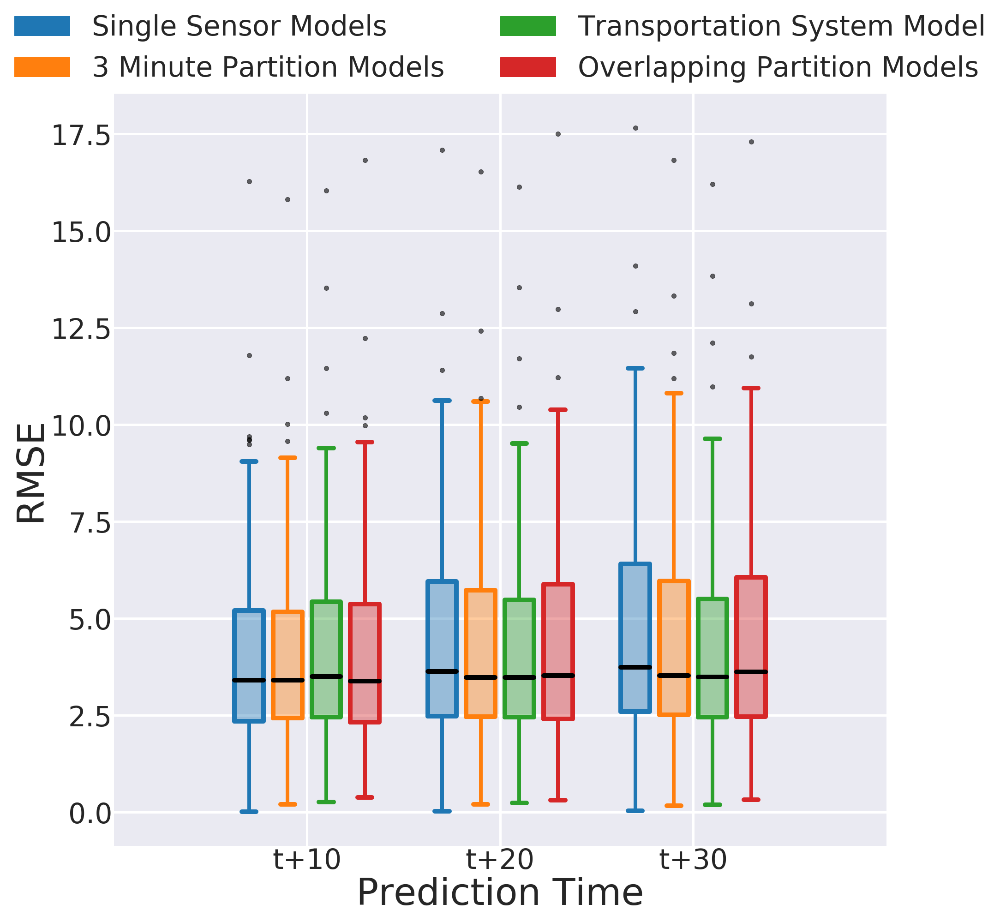

In [324]:
%%local 
single_end = [single_end_rmse_df.values[0,0], single_end_rmse_df.values[0,1], single_end_rmse_df.values[0,2]]
part3_end = [part3_end_rmse_df.values[0,0], part3_end_rmse_df.values[0,1], part3_end_rmse_df.values[0,2]]
all_end =    [all_end_rmse_df.values[0,0],    all_end_rmse_df.values[0,1],    all_end_rmse_df.values[0,2]]
o_end = [overlapping_end_rmse_df.values[0,0], overlapping_end_rmse_df.values[0,1], overlapping_end_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_end, positions=np.array(xrange(len(single_end)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part3_end, positions=np.array(xrange(len(part3_end)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_end,    positions=np.array(xrange(len(all_end)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_end,      positions=np.array(xrange(len(o_end)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='3 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 30 Minute Partition - Start Group - Box Plot

In [325]:
part30_start_sensors =  [s[0] for s in  partitions_30min_df.where(col('group') == 'start').select('identifier').collect()]
indices = [9, 19, 29]

In [326]:
part30_start_rmse      = np.array([])
single_start_rmse      = np.array([])
all_start_rmse         = np.array([])
overlapping_start_rmse = np.array([])

if not file_exists(part_30min_path + "start_rmse.npy"):
    part30_start_rmse      = calculate_rmse(part_30min_path, part30_start_sensors)          
    write_hdfs_file(part_30min_path + "start_rmse.npy",             part30_start_rmse     )  
    
    single_start_rmse      = calculate_rmse(single_sensor_model_path, part30_start_sensors) 
    write_hdfs_file(part_30min_path + "single_start_rmse.npy",      single_start_rmse     )  
    
    all_start_rmse         = calculate_rmse(all_sensors_model_path, part30_start_sensors)   
    write_hdfs_file(part_30min_path + "all_start_rmse.npy",         all_start_rmse        ) 
    
    overlapping_start_rmse = calculate_rmse(overlapping_path, part30_start_sensors)         
    write_hdfs_file(part_30min_path + "overlapping_start_rmse.npy", overlapping_start_rmse)  
else:
    part30_start_rmse      = read_hdfs_file(part_30min_path + "start_rmse.npy"            )
    single_start_rmse      = read_hdfs_file(part_30min_path + "single_start_rmse.npy"     )
    all_start_rmse         = read_hdfs_file(part_30min_path + "all_start_rmse.npy"        )
    overlapping_start_rmse = read_hdfs_file(part_30min_path + "overlapping_start_rmse.npy")

In [327]:
%%spark -o part30_start_rmse_df
part30_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part30_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [328]:
%%spark -o single_start_rmse_df
single_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [329]:
%%spark -o all_start_rmse_df
all_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [330]:
%%spark -o overlapping_start_rmse_df
overlapping_start_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_start_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

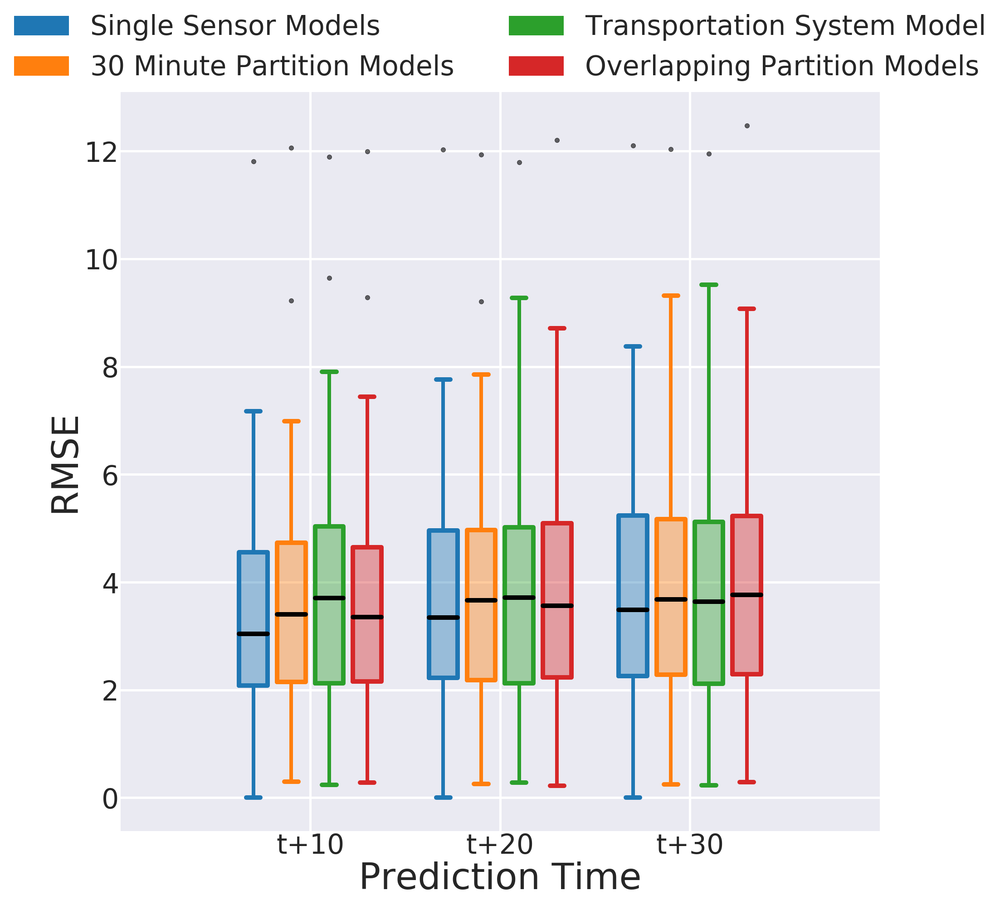

In [331]:
%%local 
single_start =  [ single_start_rmse_df.values[0,0],  single_start_rmse_df.values[0,1],  single_start_rmse_df.values[0,2]]
part30_start = [part30_start_rmse_df.values[0,0], part30_start_rmse_df.values[0,1], part30_start_rmse_df.values[0,2]]
all_start =    [   all_start_rmse_df.values[0,0],    all_start_rmse_df.values[0,1],    all_start_rmse_df.values[0,2]]
o_start = [ overlapping_start_rmse_df.values[0,0], overlapping_start_rmse_df.values[0,1], overlapping_start_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_start, positions=np.array(xrange(len(single_start)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part30_start, positions=np.array(xrange(len(part30_start)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_start,    positions=np.array(xrange(len(all_start)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_start,      positions=np.array(xrange(len(o_start)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='30 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]


plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 30 Minute Partition - Center Group - Box Plot

In [332]:
part30_center_sensors = [s[0] for s in  partitions_30min_df.where(col('group') == 'center').select('identifier').collect()]
indices = [9, 19, 29]

In [333]:
part30_center_rmse      = np.array([])
single_center_rmse      = np.array([])
all_center_rmse         = np.array([])
overlapping_center_rmse = np.array([])

if not file_exists(part_30min_path + "center_rmse.npy"):
    part30_center_rmse      = calculate_rmse(part_30min_path, part30_center_sensors)          
    write_hdfs_file(part_30min_path + "center_rmse.npy",             part30_center_rmse     )
    
    single_center_rmse      = calculate_rmse(single_sensor_model_path, part30_center_sensors) 
    write_hdfs_file(part_30min_path + "single_center_rmse.npy",      single_center_rmse     )  
    
    all_center_rmse         = calculate_rmse(all_sensors_model_path, part30_center_sensors)   
    write_hdfs_file(part_30min_path + "all_center_rmse.npy",         all_center_rmse        ) 
    
    overlapping_center_rmse = calculate_rmse(overlapping_path, part30_center_sensors)         
    write_hdfs_file(part_30min_path + "overlapping_center_rmse.npy", overlapping_center_rmse)      
else:
    part30_center_rmse       = read_hdfs_file(part_30min_path + "center_rmse.npy"            )
    single_center_rmse      = read_hdfs_file(part_30min_path + "single_center_rmse.npy"     )
    all_center_rmse         = read_hdfs_file(part_30min_path + "all_center_rmse.npy"        )
    overlapping_center_rmse = read_hdfs_file(part_30min_path + "overlapping_center_rmse.npy")

In [334]:
%%spark -o part30_center_rmse_df
part30_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part30_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [335]:
%%spark -o single_center_rmse_df
single_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [336]:
%%spark -o all_center_rmse_df
all_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [337]:
%%spark -o overlapping_center_rmse_df
overlapping_center_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_center_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

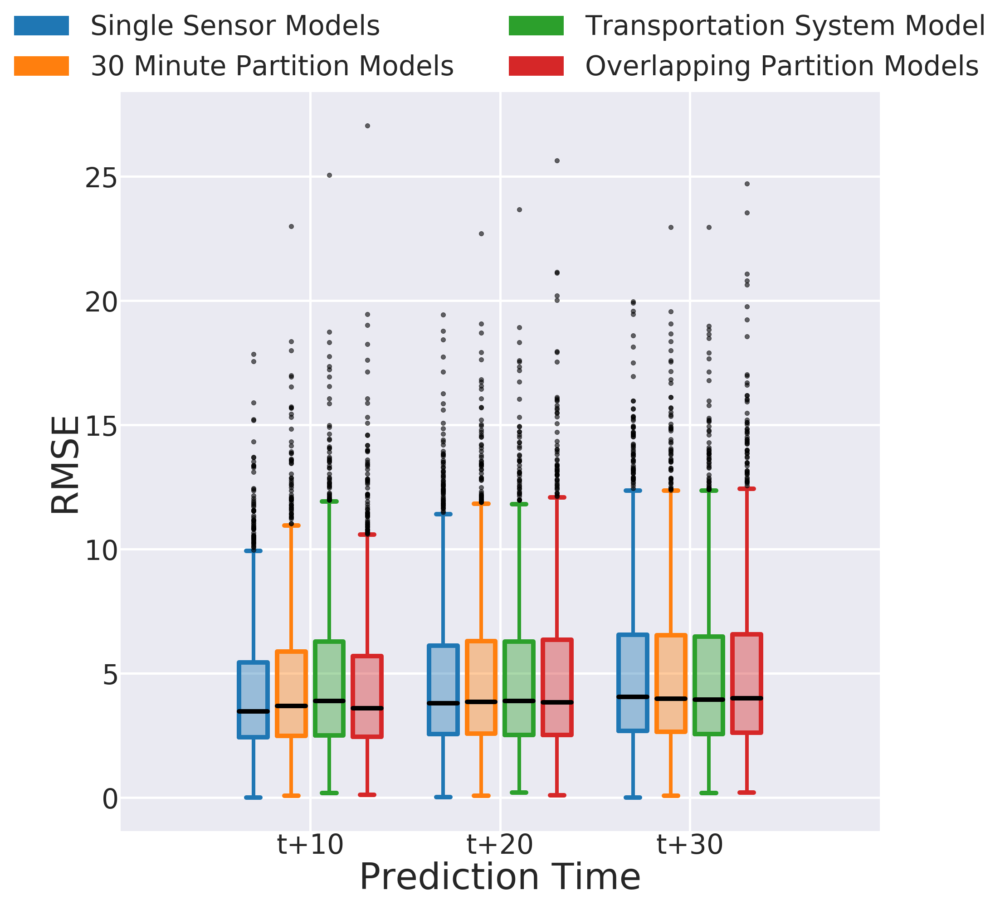

In [338]:
%%local 
single_center = [single_center_rmse_df.values[0,0], single_center_rmse_df.values[0,1], single_center_rmse_df.values[0,2]]
part30_center = [part30_center_rmse_df.values[0,0], part30_center_rmse_df.values[0,1], part30_center_rmse_df.values[0,2]]
all_center =    [all_center_rmse_df.values[0,0],    all_center_rmse_df.values[0,1],    all_center_rmse_df.values[0,2]]
o_center = [overlapping_center_rmse_df.values[0,0], overlapping_center_rmse_df.values[0,1], overlapping_center_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_center, positions=np.array(xrange(len(single_center)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part30_center, positions=np.array(xrange(len(part30_center)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_center,    positions=np.array(xrange(len(all_center)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_center,      positions=np.array(xrange(len(o_center)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='30 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

## Model RMSE Comparison - 30 Minute Partition - End Group - Box Plot

In [339]:
part30_end_sensors = [s[0] for s in  partitions_30min_df.where(col('group') == 'end').select('identifier').collect()]
indices = [9, 19, 29]

In [340]:
part30_end_rmse      = np.array([])
single_end_rmse      = np.array([])
all_end_rmse         = np.array([])
overlapping_end_rmse = np.array([])

if not file_exists(part_30min_path + "end_rmse.npy"):
    part30_end_rmse      = calculate_rmse(part_30min_path, part30_end_sensors)         
    write_hdfs_file(part_30min_path + "end_rmse.npy",             part30_end_rmse     ) 
    
    single_end_rmse      = calculate_rmse(single_sensor_model_path, part30_end_sensors)
    write_hdfs_file(part_30min_path + "single_end_rmse.npy",      single_end_rmse     )  
    
    all_end_rmse         = calculate_rmse(all_sensors_model_path, part30_end_sensors)  
    write_hdfs_file(part_30min_path + "all_end_rmse.npy",         all_end_rmse        )   
    
    overlapping_end_rmse = calculate_rmse(overlapping_path, part30_end_sensors)        
    write_hdfs_file(part_30min_path + "overlapping_end_rmse.npy", overlapping_end_rmse)                
else:
    part30_end_rmse      = read_hdfs_file(part_30min_path + "end_rmse.npy"            )
    single_end_rmse      = read_hdfs_file(part_30min_path + "single_end_rmse.npy"     )
    all_end_rmse         = read_hdfs_file(part_30min_path + "all_end_rmse.npy"        )
    overlapping_end_rmse = read_hdfs_file(part_30min_path + "overlapping_end_rmse.npy")

In [341]:
%%spark -o part30_end_rmse_df
part30_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        part30_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [342]:
%%spark -o single_end_rmse_df
single_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        single_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [343]:
%%spark -o all_end_rmse_df
all_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        all_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

In [344]:
%%spark -o overlapping_end_rmse_df
overlapping_end_rmse_df = spark.createDataFrame(
    sc.parallelize([
        overlapping_end_rmse.transpose()[:, indices].transpose().tolist()
    ]), [
        "t+10",
        "t+20",
        "t+30"
    ]
)

Text(0,0.5,u'RMSE')

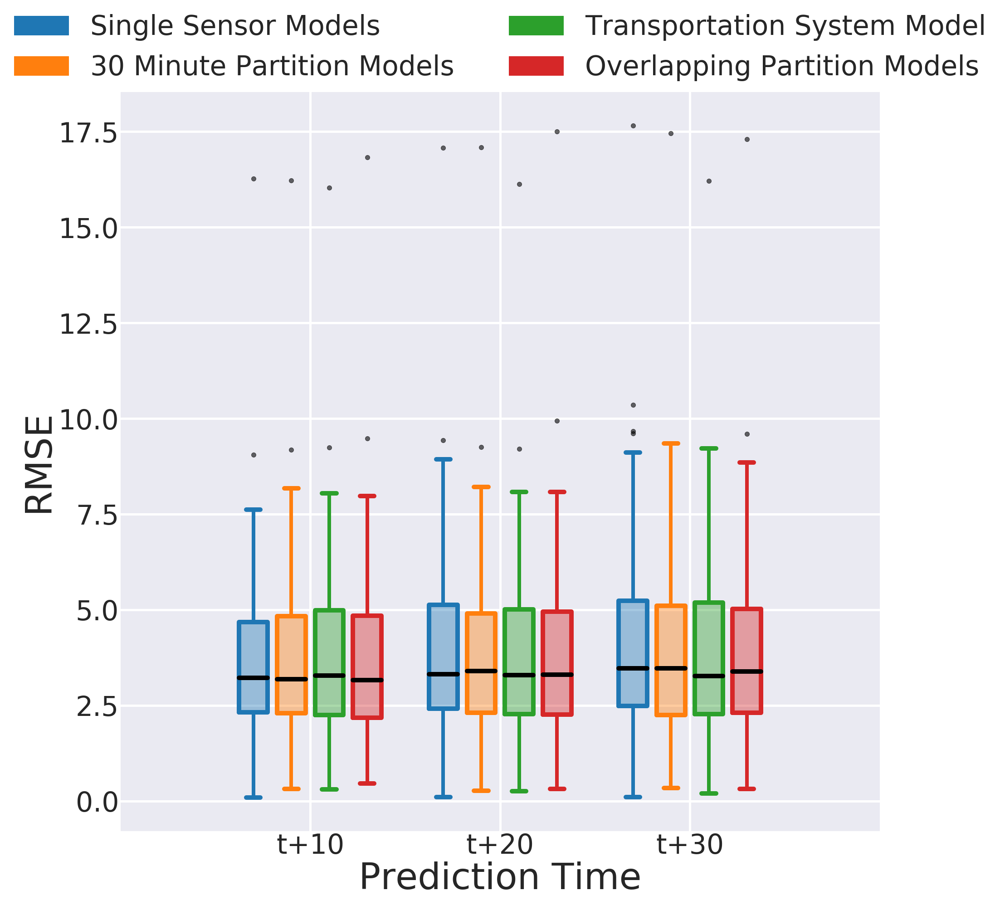

In [345]:
%%local 
single_end = [single_end_rmse_df.values[0,0], single_end_rmse_df.values[0,1], single_end_rmse_df.values[0,2]]
part30_end = [part30_end_rmse_df.values[0,0], part30_end_rmse_df.values[0,1], part30_end_rmse_df.values[0,2]]
all_end =    [all_end_rmse_df.values[0,0],    all_end_rmse_df.values[0,1],    all_end_rmse_df.values[0,2]]
o_end = [overlapping_end_rmse_df.values[0,0], overlapping_end_rmse_df.values[0,1], overlapping_end_rmse_df.values[0,2]]

ticks = ['t+10', 't+20', 't+30']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color, linewidth=10)
    plt.setp(bp['whiskers'], color=color, linewidth=8)
    plt.setp(bp['caps'], color=color, linewidth=10)
    plt.setp(bp['medians'], color='#000000', linewidth=10)
    plt.setp(bp['fliers'], color='red', markersize=20, alpha=0.6, markeredgecolor="black")
    
    for i in range(3):
        box = bp['boxes'][i]
        boxX = []
        boxY = []
        for j in range(5):
            boxX.append(box.get_xdata()[j])
            boxY.append(box.get_ydata()[j])
        boxCoords = np.column_stack([boxX, boxY])
        boxPolygon = Polygon(boxCoords, facecolor=color, alpha=0.4)
        axs.add_patch(boxPolygon)


plt.figure(figsize=(30, 30))
axs = plt.axes()

bp1 = plt.boxplot(single_end, positions=np.array(xrange(len(single_end)))*4.0-1.2, widths=0.6, sym="k.")
bp2 = plt.boxplot(part30_end, positions=np.array(xrange(len(part30_end)))*4.0-0.4, widths=0.6, sym="k.")
bp3 = plt.boxplot(all_end,    positions=np.array(xrange(len(all_end)))*4.0+0.4, widths=0.6, sym="k.")
bp4 = plt.boxplot(o_end,      positions=np.array(xrange(len(o_end)))*4.0+1.2, widths=0.6, sym="k.")

set_box_color(bp1, colors[0])
set_box_color(bp2, colors[1])
set_box_color(bp3, colors[2])
set_box_color(bp4, colors[3])

patches = [
    mpatches.Patch(color=colors[0], label='Single Sensor Models'),
    mpatches.Patch(color=colors[1], label='30 Minute Partition Models'),
    mpatches.Patch(color=colors[2], label='Transportation System Model'),
    mpatches.Patch(color=colors[3], label='Overlapping Partition Models')
]

plt.legend(
    handles=patches, 
    loc='center', 
    bbox_to_anchor=(0.5, 1.06), 
    ncol=2,
    borderaxespad=5
)

plt.grid(linewidth=5)
plt.xticks(xrange(0, len(ticks) * 4, 4), ticks)
plt.xlim(-4, len(ticks)*4)

axs.set_xlabel("Prediction Time", {'size':ylabel_size})
axs.set_ylabel("RMSE", {'size':ylabel_size})

# Scalability

In [346]:
# Average Training Time and Prediction Time
single_avg_t_time = calculate_avg_t_time(single_sensor_model_path, sensors)
single_avg_p_time = calculate_avg_p_time(single_sensor_model_path, sensors)

ids = [x[0] for x in partitions_3min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part3_avg_t_time = calculate_avg_t_time(part_3min_path + "partition_", ids)
part3_avg_p_time = calculate_avg_p_time(part_3min_path + "partition_", ids)

ids = [x[0] for x in partitions_5min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part5_avg_t_time = calculate_avg_t_time(part_5min_path + "partition_", ids)
part5_avg_p_time = calculate_avg_p_time(part_5min_path + "partition_", ids)

ids = [x[0] for x in partitions_10min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part10_avg_t_time = calculate_avg_t_time(part_10min_path + "partition_", ids)
part10_avg_p_time = calculate_avg_p_time(part_10min_path + "partition_", ids)

ids = [x[0] for x in partitions_20min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part20_avg_t_time = calculate_avg_t_time(part_20min_path + "partition_", ids)
part20_avg_p_time = calculate_avg_p_time(part_20min_path + "partition_", ids)

ids = [x[0] for x in partitions_30min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part30_avg_t_time = calculate_avg_t_time(part_30min_path + "partition_", ids)
part30_avg_p_time = calculate_avg_p_time(part_30min_path + "partition_", ids)

all_avg_t_time = read_hdfs_file(all_sensors_model_path + "training_time.npy")
all_avg_p_time = read_hdfs_file(all_sensors_model_path + "prediction_time.npy")

ids = [x[0] for x in overlapping_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
overlapping_avg_t_time = calculate_avg_t_time(overlapping_path + "partition_", ids)
overlapping_avg_p_time = calculate_avg_p_time(overlapping_path + "partition_", ids)

# Average RMSE
single_avg_rmse = read_hdfs_file(single_sensor_model_path + "avg_rmse.npy")
part3_avg_rmse = read_hdfs_file(part_3min_path + "avg_rmse.npy")
part5_avg_rmse = read_hdfs_file(part_5min_path + "avg_rmse.npy")
part10_avg_rmse = read_hdfs_file(part_10min_path + "avg_rmse.npy")
part20_avg_rmse = read_hdfs_file(part_20min_path + "avg_rmse.npy")
part30_avg_rmse = read_hdfs_file(part_30min_path + "avg_rmse.npy")
all_avg_rmse = read_hdfs_file(all_sensors_model_path + "avg_rmse.npy")
overlapping_avg_rsme = read_hdfs_file(overlapping_path + "avg_rmse.npy")

# Model Complexity
single_lstm_units = 50
part3_lstm_units = 200
part5_lstm_units = 600
part10_lstm_units = 800
part20_lstm_units = 1000
part30_lstm_units = 1000
all_lstm_units = 1000
overlapping_lstm_units = 1000

# Average Input data
single_avg_input = 1
part3_avg_input = partitions_3min_df.groupby('partition').count().agg({"count": "avg"}).collect()[0]['avg(count)']
part5_avg_input = partitions_5min_df.groupby('partition').count().agg({"count": "avg"}).collect()[0]['avg(count)']
part10_avg_input = partitions_10min_df.groupby('partition').count().agg({"count": "avg"}).collect()[0]['avg(count)']
part20_avg_input = partitions_20min_df.groupby('partition').count().agg({"count": "avg"}).collect()[0]['avg(count)']
part30_avg_input = partitions_30min_df.groupby('partition').count().agg({"count": "avg"}).collect()[0]['avg(count)']
all_avg_input = len([s[0] for s in partitions_3min_df.select('identifier').collect()])
overlapping_avg_input = overlapping_df.groupBy("partition").count().agg({"count": "avg"}).collect()[0]['avg(count)']

In [347]:
ids = [x[0] for x in partitions_20min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part20_t_time = get_t_time(part_20min_path + "partition_", ids)
part20_p_time = get_p_time(part_20min_path + "partition_", ids)
ids = [x[0] for x in partitions_30min_raw_df.groupby('partition').count().orderBy('partition').select('partition').collect()]
part30_t_time = get_t_time(part_30min_path + "partition_", ids)
part30_p_time = get_p_time(part_30min_path + "partition_", ids)

In [348]:
%%spark -o scalability_df
indices = [2, 4, 9, 19, 29]

scalability_df = spark.createDataFrame(
    sc.parallelize(
        np.array([
np.append(np.array(["Single Sensor Models",         single_avg_t_time,      single_avg_p_time,      single_lstm_units,      single_avg_input,      single_avg_input      * 10]),      np.take(single_avg_rmse, indices)),
np.append(np.array(["3 Minute Partition Models",    part3_avg_t_time,       part3_avg_p_time,       part3_lstm_units,       part3_avg_input ,      part3_avg_input       * 10]),      np.take(part3_avg_rmse, indices)),
np.append(np.array(["5 Minute Partition Models",    part5_avg_t_time,       part5_avg_p_time,       part5_lstm_units,       part5_avg_input ,      part5_avg_input       * 10]),      np.take(part5_avg_rmse, indices)),
np.append(np.array(["10 Minute Partition Models",   part10_avg_t_time,      part10_avg_p_time,      part10_lstm_units,      part10_avg_input,      part10_avg_input      * 10]),      np.take(part10_avg_rmse, indices)),
np.append(np.array(["20 Minute Partition Models",   part20_avg_t_time,      part20_avg_p_time,      part20_lstm_units,      part20_avg_input,      part20_avg_input      * 10]),      np.take(part20_avg_rmse, indices)),
np.append(np.array(["Transportation System Model",  all_avg_t_time,         all_avg_p_time,         all_lstm_units,         all_avg_input   ,      all_avg_input         * 10]),      np.take(all_avg_rmse, indices)),
np.append(np.array(["Overlapping Partition Models", overlapping_avg_t_time, overlapping_avg_p_time, overlapping_lstm_units, overlapping_avg_input, overlapping_avg_input * 10]), np.take(overlapping_avg_rsme, indices))
        ]).tolist()
    ), 
    np.append(np.array([ 
        "Model", 
        "Average Training Time", 
        "Average Prediction Time",
        "LSTM Units", 
        "Average Number of Sensors",
        "Average Input Size"
    ]), np.take(["t+" + str(x) for x in range(1, 31)], indices)).tolist()
)

In [349]:
%%local
scalability_df

VBox(children=(HBox(children=(HTML(value=u'Type:'), Button(description=u'Table', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Pie', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Scatter', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Line', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Area', layout=Layout(width=u'70px'), style=ButtonStyle()), Button(description=u'Bar', layout=Layout(width=u'70px'), style=ButtonStyle()))), EncodingWidget(children=(VBox(children=(HTML(value=u'Encoding:'), Dropdown(description=u'X', index=11, layout=Layout(width=u'200px'), options={u'LSTM Units': u'LSTM Units', u'Average Input Size': u'Average Input Size', u't+20': u't+20', u'Average Prediction Time': u'Average Prediction Time', '-': None, u't+10': u't+10', u't+5': u't+5', u't+3': u't+3', u't+30': u't+30', u'Average Number of Sensors': u'Average Number of Sensors', u'Average Training Time': u'Average Training Time', u'Model': u'Model'}, value=u'Model'), HBox(children=(Dropdown(description=u'Y', index=10, layout=Layout(width=u'200px'), options={u'LSTM Units': u'LSTM Units', u'Average Input Size': u'Average Input Size', u't+20': u't+20', u'Average Prediction Time': u'Average Prediction Time', '-': None, u't+10': u't+10', u't+5': u't+5', u't+3': u't+3', u't+30': u't+30', u'Average Number of Sensors': u'Average Number of Sensors', u'Average Training Time': u'Average Training Time', u'Model': u'Model'}, value=u'Average Training Time'), Dropdown(description=u'Func.', index=2, layout=Layout(width=u'200px'), options={'Count': 'Count', 'Min': 'Min', 'Max': 'Max', 'Sum': 'Sum', '-': 'None', 'Avg': 'Avg'}, value='Max'))), Checkbox(value=False, description=u'Log scale X'), Checkbox(value=False, description=u'Log scale Y'))),))))

Output()

In [350]:
data = np.array([
np.take(single_avg_rmse, indices),
np.take(part3_avg_rmse, indices),
np.take(part5_avg_rmse, indices),
np.take(part10_avg_rmse, indices),
np.take(part20_avg_rmse, indices),
np.take(all_avg_rmse, indices),
np.take(overlapping_avg_rsme, indices)
])

print "t+3: " + str(np.std(data[:, [0]]))
print "t+5: " + str(np.std(data[:, [1]]))
print "t+10: " + str(np.std(data[:, [2]]))
print "t+20: " + str(np.std(data[:, [3]]))
print "t+30: " + str(np.std(data[:, [4]]))

t+3: 0.2058590813010481
t+5: 0.16677338277689885
t+10: 0.16090130361188343
t+20: 0.05230204901606895
t+30: 0.06429055050551825

[Text(0,0,u'1.0'),
 Text(0,0,u'53.83'),
 Text(0,0,u'102.0'),
 Text(0,0,u'149.08'),
 Text(0,0,u'276.86'),
 Text(0,0,u'608.66'),
 Text(0,0,u'1938.0')]

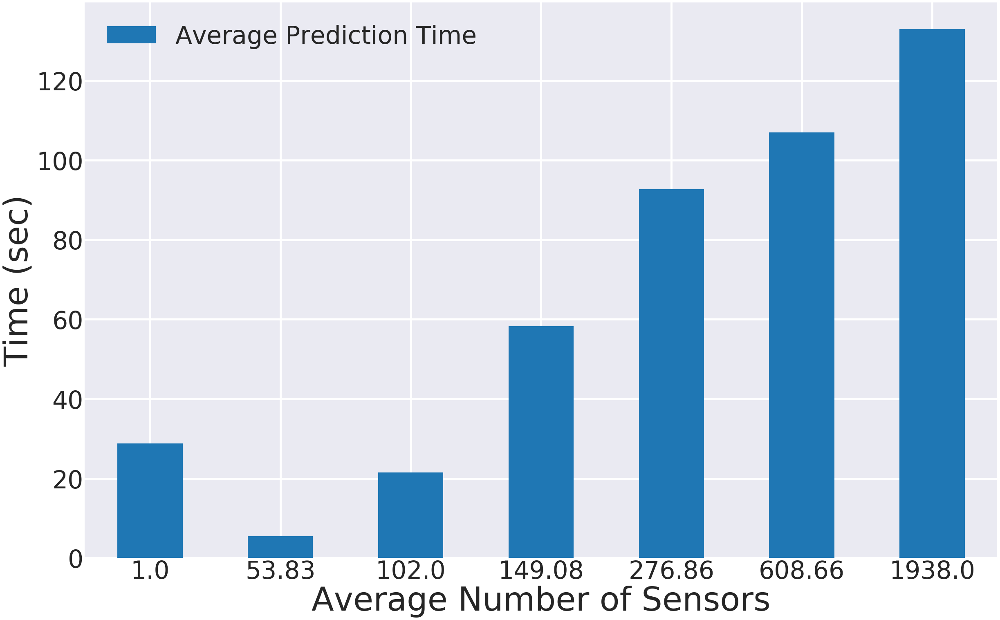

In [351]:
%%local
scalability_df = scalability_df.round(2).sort_values("Average Number of Sensors")
scalability_plot = scalability_df.plot.bar(
    figsize=(40, 25), 
    x="Average Number of Sensors",
    y=["Average Prediction Time", "Model"],
    fontsize=tick_size, 
    linewidth=line_width * 0.5
)

scalability_plot.grid(linewidth=5)
scalability_plot.set_xlabel("Average Number of Sensors", {'size':xlabel_size})
scalability_plot.set_ylabel("Time (sec)", {'size':ylabel_size})
scalability_plot.set_xticklabels(scalability_df['Average Number of Sensors'], rotation=0)

[Text(0,0,u'1.0'),
 Text(0,0,u'53.83'),
 Text(0,0,u'102.0'),
 Text(0,0,u'149.08'),
 Text(0,0,u'276.86'),
 Text(0,0,u'608.66'),
 Text(0,0,u'1938.0')]

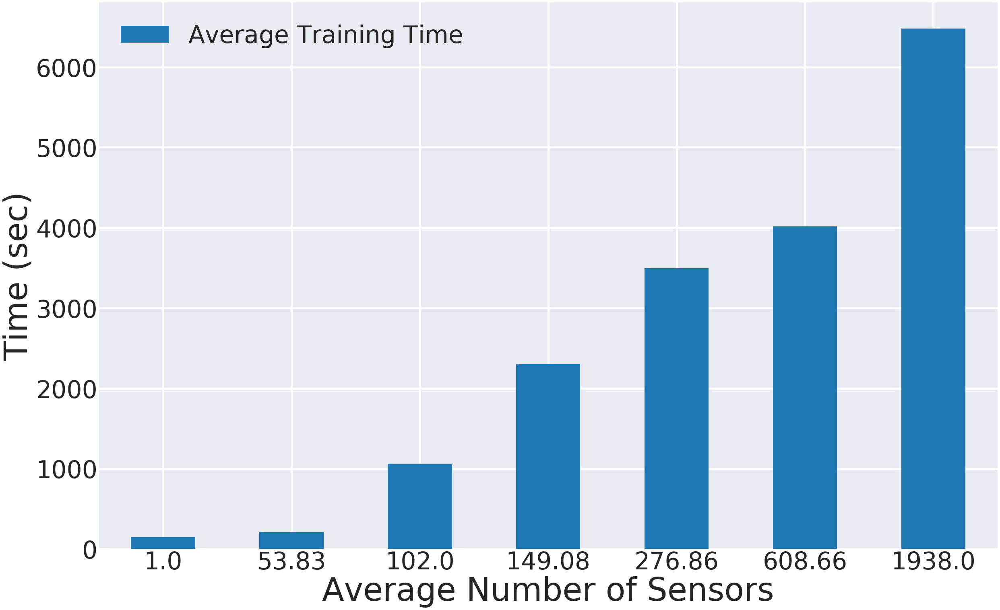

In [352]:
%%local
scalability_df = scalability_df.round(2).sort_values("Average Number of Sensors")
scalability_plot = scalability_df.plot.bar(
    figsize=(40, 25), 
    x="Average Number of Sensors",
    y=["Average Training Time"],
    fontsize=tick_size, 
    linewidth=line_width * 0.5
)

scalability_plot.grid(linewidth=5)
scalability_plot.set_xlabel("Average Number of Sensors", {'size':xlabel_size})
scalability_plot.set_ylabel("Time (sec)", {'size':ylabel_size})
scalability_plot.set_xticklabels(scalability_df['Average Number of Sensors'], rotation=0)